Random search for parameter sets where A affects k4 and B affects k3. Note that it is not required that A is stronger. Run on an interactive session on the cluster, took about 30 minutes to get 10 million points.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sys, os
sys.path.append("../../../work2/ownutils/scriptssyn") #rosamc/scriptssyn repo
sys.path.append("./bin/")
import PolAB_A_allpars

import networkx as nx
import matplotlib as mpl
mpl.rcParams['font.size']=12
import fluxes
import clusteringaux
import basic
import glob
import itertools
import matplotlib.colors as colors
import seaborn as sns

In [2]:
rhofunc=PolAB_A_allpars.interface_rhos_GRF_PolAB_A_A
parsliststr='ktia0,ktan0,ktin0,ktni0,ktiaA,ktanA,ktinA,ktniA,ktiaB,ktanB,ktinB,ktniB,kbBa,kuBa,kbBi,kuBi,kbBn,kuBn,kbAa,kuAa,kbAi,kuAi,kbAn,kuAn'
parslist=parsliststr.split(',')
parslist_order=['ktni0','ktin0','ktia0','ktan0','ktniA','ktinA','ktiaA','ktanA','ktniB','ktinB','ktiaB','ktanB','kbBa','kuBa','kbBi','kuBi','kbBn','kuBn','kbAa','kuAa','kbAi','kuAi','kbAn','kuAn']
flux_order_labs=['2-1','1-2','1-0','0-2','5-4','4-5','4-3','3-5','8-7','7-8','7-6','6-8','2-5','5-2','2-8','8-2','1-4','4-1','1-7','7-1','0-3','3-0','0-6','6-0']

#labls=np.array(parslist[:18])

#copied from 2019_05_14_prepare_3statepol-equalb

edges=[(2,'ktia0',1),(1,'ktan0',3),(2,'ktin0',3),(3,'ktni0',2),
       (8,'ktiaA',7),(7,'ktanA',9),(8,'ktinA',9),(9,'ktniA',8),
       (5,'ktiaB',4),(4,'ktanB',6),(5,'ktinB',6),(6,'ktniB',5),
      (1,'kbBa-B',4),(4,'kuBa',1),(2,'kbBi-B',5),(5,'kuBi',2),(3,'kbBn-B',6),(6,'kuBn',3),
       (1,'kbAa-A',7),(7,'kuAa',1),(2,'kbAi-A',8),(8,'kuAi',2),(3,'kbAn-A',9),(9,'kuAn',3)]
edges_=[]
for tuple_ in edges:
    edges_.append((tuple_[0]-1,tuple_[1],tuple_[2]-1))
    
graph_edges_dict=dict()
for x in edges:
    graph_edges_dict['%s-%s'%(x[0],x[2])]=x[1]
#note that A is to the left, B is to the right
#coords=fluxes.get_G_coords_9nodes()
basiccoords={0: [0,-1],
         1: [0.,1],
         2: [-1, 0]}

dx=2.5
coords=dict()
coords[0]=basiccoords[0]
coords[1]=basiccoords[1]
coords[2]=basiccoords[2]
coords[3]=[basiccoords[0][0]+dx,basiccoords[0][1]] #B
coords[4]=[basiccoords[1][0]+dx,basiccoords[1][1]] #B
coords[5]=[basiccoords[2][0]+dx,basiccoords[2][1]] #B
coords[6]=[basiccoords[0][0]-dx,basiccoords[0][1]] #A
coords[7]=[basiccoords[1][0]-dx,basiccoords[1][1]] #A
coords[8]=[basiccoords[2][0]-dx,basiccoords[2][1]] #A


#connectstyles

#these are the labels corresponding to the flux matrix, then flattened so that it is a row
nnodes=9
flux_names_mat=np.empty((nnodes,nnodes),dtype=object)
for i in np.arange(nnodes):
    for j in np.arange(nnodes):
        flux_names_mat[i,j]='%d-%d'%(i,j)
#print(flux_names_mat)
flux_names_flat=flux_names_mat.flatten()
#print(flux_names_flat)

#names of transitions for the fluxes, appending an extension to distinguish the different TF states
#for this analysis I only look at the situation where both TFs are present, but could also look at the situation where, nothing, or only A or B are bound
all_fnames=[]
flux_order_labs_AB=[]
for i in [3]:
    if i==0:
        ext='0'
    elif i==1:
        ext='A'
    elif i==2:
        ext='B'
    else:
        ext='AB'
    all_fnames.extend(['%s.%s'%(x,ext) for x in flux_names_flat]) #add extension to the labls obtained above
    flux_order_labs_AB.extend(['%s.%s'%(x,ext) for x in flux_order_labs]) #add extension to the order
all_fnames=np.array(all_fnames)

#find the edges that are mirror images of each other
edges_sym=dict()
for edge_ in edges:
    edge=edge_[1]
    if "A" in edge:
        e2=edge.replace("A","B")
    elif "B" in edge:
        e2=edge.replace("B","A")
    else:
        continue
    for e_ in edges:
        if e_[1]==e2:
            nodes1="%d-%d"%(edge_[0]-1,edge_[2]-1)
            nodes="%d-%d"%(e_[0]-1,e_[2]-1)
            print(nodes1, edge_, "symmetric of", e_,nodes)
            edges_sym[nodes1]=nodes

7-6 (8, 'ktiaA', 7) symmetric of (5, 'ktiaB', 4) 4-3
6-8 (7, 'ktanA', 9) symmetric of (4, 'ktanB', 6) 3-5
7-8 (8, 'ktinA', 9) symmetric of (5, 'ktinB', 6) 4-5
8-7 (9, 'ktniA', 8) symmetric of (6, 'ktniB', 5) 5-4
4-3 (5, 'ktiaB', 4) symmetric of (8, 'ktiaA', 7) 7-6
3-5 (4, 'ktanB', 6) symmetric of (7, 'ktanA', 9) 6-8
4-5 (5, 'ktinB', 6) symmetric of (8, 'ktinA', 9) 7-8
5-4 (6, 'ktniB', 5) symmetric of (9, 'ktniA', 8) 8-7
0-3 (1, 'kbBa-B', 4) symmetric of (1, 'kbAa-A', 7) 0-6
3-0 (4, 'kuBa', 1) symmetric of (7, 'kuAa', 1) 6-0
1-4 (2, 'kbBi-B', 5) symmetric of (2, 'kbAi-A', 8) 1-7
4-1 (5, 'kuBi', 2) symmetric of (8, 'kuAi', 2) 7-1
2-5 (3, 'kbBn-B', 6) symmetric of (3, 'kbAn-A', 9) 2-8
5-2 (6, 'kuBn', 3) symmetric of (9, 'kuAn', 3) 8-2
0-6 (1, 'kbAa-A', 7) symmetric of (1, 'kbBa-B', 4) 0-3
6-0 (7, 'kuAa', 1) symmetric of (4, 'kuBa', 1) 3-0
1-7 (2, 'kbAi-A', 8) symmetric of (2, 'kbBi-B', 5) 1-4
7-1 (8, 'kuAi', 2) symmetric of (5, 'kuBi', 2) 4-1
2-8 (3, 'kbAn-A', 9) symmetric of (3, 'kbBn-B'

In [3]:
def check_constraints(df,minb=None,maxb=None,parfc=None,fc1=None,fc2=None):
    for par in ["p1","p2","p4"]:
        minb_=10**minb
        maxb_=10**maxb
        print(minb_,maxb_)
        mask=(df[par].values>=minb_) & (df[par].values<=maxb_)
        checkb1=np.all(mask)
        print("base clockwise", checkb1)
        if not checkb1:
            display(df[~mask])
        
    ktinlim=4-(maxb-minb)
    print("ktin>%d? "%ktinlim, np.all(df["p3"].values >=ktinlim))
    
    
    r1A=df["p5"]/df["p1"]
    r2A=df["p6"]/df["p2"]
    r3A=df["p8"]/df["p4"]
    r1B=df["p9"]/df["p1"]
    r2B=df["p10"]/df["p2"]
    r3B=df["p12"]/df["p4"]
    
    r4A=df["p7"]/df["p3"]
    r4B=df["p11"]/df["p3"]
    
    
    if parfc is None:
        for r_,r in enumerate([r1A,r2A,r3A,r1B,r2B,r3B]):
            print("clockwise par",r_,"gt1",np.all(r.values>1-1e-10),"gteq1",np.all(r.values>=1))
        for r_,r in enumerate([r4A,r4B]):
            print("anticlockwise par", r_,"lt1",np.all(r.values<1),"lteq1",np.all(r.values<=1))
    else:
        parfc_=10**parfc
        titles=["r1A","r2A","r3A","r1B","r2B","r3B"]
        for r_,r in enumerate([r1A,r2A,r3A,r1B,r2B,r3B]):
            print("clockwise par",titles[r_],"eq1",np.all(r.values==1),"gt1",np.all(r.values>1),"eqgt1",np.all(r.values>=1-1e-10),"eqgt1 and fc",np.all((r.values>=1)&(r.values<=parfc_)))
        for r_,r in enumerate([r4A,r4B]):
            print("anticlockwise par", r_,"lt1",np.all(r.values<1),"leq1",np.all(r.values<=1+1e-10),np.all((r.values<1)&(r.values>=1/parfc_)))
    print("fc1 A", np.all((df["mA"]/df["m0"]).values<fc1))
    print("fc1 B", np.all((df["mB"]/df["m0"]).values<fc1))
    print("fc2", np.all((df["mA"]/df["mB"]).values<=fc2))
    
    return 
        
        
def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=100):
    new_cmap = colors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(minval, maxval, n)))
    return new_cmap

# Read data

In [4]:
def return_fullparset(parset,case):
    if case=="any":
        parset2=parset.copy()
    elif case=="difAD_difbnp":
        parset2=np.concatenate((parset[0:12],parset[12:14],parset[12:14],parset[12:14],parset[14:16],parset[14:16],parset[14:16]))
    elif case=="difADsbnp" or case=="difAD_samebnp":
        parset2=np.concatenate((parset[0:12],parset[12:14],parset[12:14],parset[12:14],parset[12:14],parset[12:14],parset[12:14]))
    elif case=="difAD_samebnp_step12":#ni,ia
        parset2=np.concatenate((parset[0:4],parset[0:3],parset[4:5],parset[5:6],parset[1:4],parset[6:8],parset[6:8],parset[6:8],parset[6:8],parset[6:8],parset[6:8]))
    elif case=="difAD_samebnp_step13": #ni,an
        parset2=np.concatenate((parset[0:4],parset[0:3],parset[4:5],parset[0:1],parset[5:6],parset[2:4],parset[6:8],parset[6:8],parset[6:8],parset[6:8],parset[6:8],parset[6:8]))    
    elif case=="difAD_samebnp_step42": #in,ia #4,2
        parset2=np.concatenate((parset[0:4],parset[0:2],parset[4:5],parset[3:4],parset[5:6],parset[1:4],parset[6:8],parset[6:8],parset[6:8],parset[6:8],parset[6:8],parset[6:8]))    
    elif case=="difAD_samebnp_step43": #in,an #4,3
        parset2=np.concatenate((parset[0:4],parset[0:2],parset[4:5],parset[3:4],parset[0:1],parset[5:6],parset[2:4],parset[6:8],parset[6:8],parset[6:8],parset[6:8],parset[6:8],parset[6:8]))    
    elif case=="difAD_samebnp_step23":#ia,an
        parset2=np.concatenate((parset[0:4],parset[4:5],parset[1:4],parset[0:1],parset[5:6],parset[2:4],parset[6:8],parset[6:8],parset[6:8],parset[6:8],parset[6:8],parset[6:8]))    
    elif case=="difAD_samebnp_step11":
        parset2=np.concatenate((parset[0:4],parset[0:3],parset[4:5],parset[0:3],parset[5:6],parset[6:8],parset[6:8],parset[6:8],parset[6:8],parset[6:8],parset[6:8]))
    elif case=="difAD_samebnp_step22":
        parset2=np.concatenate((parset[0:4],parset[4:5],parset[1:4],parset[5:6],parset[1:4],parset[6:8],parset[6:8],parset[6:8],parset[6:8],parset[6:8],parset[6:8]))
    elif case=="sameAD_difbp":
        parset2=np.concatenate((parset[0:8],parset[4:8],parset[8:20]))
    elif case=="sameAD_difbp_kuonly":
        kb=parset[8]
        ku1,ku2,ku3,ku4,ku5,ku6=parset[9:]
        bindingar=np.array([kb,ku1,kb,ku2,kb,ku3,kb,ku4,kb,ku5,kb,ku6])
        parset2=np.concatenate((parset[0:8],parset[4:8],bindingar))
    elif case=="sameAD_difbnp":
        parset2=np.concatenate((parset[0:8],parset[4:8],parset[8:10],parset[8:10],parset[8:10],parset[10:12],parset[10:12],parset[10:12]))
    elif case=="empty":
         parset2=np.concatenate((parset[0:8],parset[0:4],parset[8:10],parset[8:10],parset[8:10],parset[8:10],parset[8:10],parset[8:10]))
    else:
        print("unrecognised case, ", case)
        raise ValueError
    return parset2

In [5]:
colnames=["p%d"%i for i in range(1,25)]
colnames=colnames+["SAB","SBA","m0","mA","mB","mAB","quadrant"]
colnames

['p1',
 'p2',
 'p3',
 'p4',
 'p5',
 'p6',
 'p7',
 'p8',
 'p9',
 'p10',
 'p11',
 'p12',
 'p13',
 'p14',
 'p15',
 'p16',
 'p17',
 'p18',
 'p19',
 'p20',
 'p21',
 'p22',
 'p23',
 'p24',
 'SAB',
 'SBA',
 'm0',
 'mA',
 'mB',
 'mAB',
 'quadrant']

In [6]:
fc1=10
fc2=10
minb=0
maxb=4
parfc=3
alldfs=[]


green="#c6cdad"
blue="#d3dbe4"
red="#e3cbc8"

green2="#b1bc8c"
blue2="#a6bed8"

In [7]:
f="/Users/rosamartinezcorral/Dropbox (HMS)/data/magic-kinsynsub1/random_k2k4_k3k4/2022_03_15_k2k4/final_results/2022_03_14_randompoints_nit=10000000_minb=0_maxb=4_parfc=3_fc1=10_fc2=10_seed=0.df"
df=pd.read_csv(f)

display(df.head())
ok=check_constraints(df,minb=minb,maxb=maxb,parfc=parfc,fc1=fc1,fc2=fc2)
alldfs=[df]

,p1,p2,p3,p4,p5,p6,p7,p8,p9,p10,...,p22,p23,p24,SAB,SBA,m0,mA,mB,mAB,quadrant
0,156.766772,725.700572,257.663857,151.193365,156.766772,725.700572,49.501596,151.193365,383.333216,725.700572,...,3690.557729,56.279320,3690.557729,-0.011541,0.011845,39.616732,40.703595,40.049107,40.379290,2
1,27.417737,55.992237,617.340520,1.741413,27.417737,55.992237,464.586795,1.741413,481.450319,55.992237,...,3.278726,6.942729,3.278726,-0.801025,1.957320,0.073755,0.623539,0.092155,0.357875,2
2,201.273214,5214.165242,18.805107,467.349217,201.273214,5214.165242,3.366599,467.349217,733.345813,5214.165242,...,5.404624,14.375547,5.404624,-0.365514,0.490824,133.336886,245.943638,135.847664,190.899533,2
3,9.885817,201.664446,233.435942,194.539423,9.885817,201.664446,7.804167,194.539423,6471.367240,201.664446,...,2430.159002,61.447117,2430.159002,-0.657819,2.228067,4.298594,32.626777,4.414037,20.680023,2
4,5.556125,5990.865369,908.245344,91.587295,5.556125,5990.865369,8.121916,91.587295,10.409406,5990.865369,...,54.659607,1.706541,54.659607,-0.169027,0.191290,0.506100,0.682698,0.531817,0.607220,2


1 10000
base clockwise True
1 10000
base clockwise True
1 10000
base clockwise True
ktin>0?  True
clockwise par r1A eq1 True gt1 False eqgt1 True eqgt1 and fc True
clockwise par r2A eq1 True gt1 False eqgt1 True eqgt1 and fc True
clockwise par r3A eq1 True gt1 False eqgt1 True eqgt1 and fc True
clockwise par r1B eq1 False gt1 True eqgt1 True eqgt1 and fc True
clockwise par r2B eq1 True gt1 False eqgt1 True eqgt1 and fc True
clockwise par r3B eq1 True gt1 False eqgt1 True eqgt1 and fc True
anticlockwise par 0 lt1 True leq1 True True
anticlockwise par 1 lt1 False leq1 True False
fc1 A True
fc1 B True
fc2 True


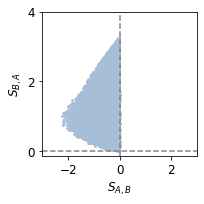

In [15]:
for df in alldfs:
    fig,ax=plt.subplots(1,1,figsize=(3,3))
    mask1=df["quadrant"]==1
    mask2=df["quadrant"]==2
    mask3=df["quadrant"]==3
    ax.scatter(df["SAB"].values[mask2],df["SBA"].values[mask2],s=3,color=blue2)
    ax.scatter(df["SAB"].values[mask1],df["SBA"].values[mask1],s=3,color=green2)
    ax.scatter(df["SAB"].values[mask3],df["SBA"].values[mask3],s=3,color="red")
    ax.set_xlabel('$S_{A,B}$')
    ax.set_ylabel('$S_{B,A}$')
    ax.axhline(y=0,linestyle="--",color="gray")
    ax.axvline(x=0,linestyle="--",color="gray")
    ax.set_xticks([-2,0,2])
    ax.set_yticks([0,2,4])
    ax.set_xlim(-3,3)
    plt.tight_layout()
    plt.savefig("/Users/rosamartinezcorral/Dropbox (HMS)/work2/papersyn/figs/panels/Figs1_scatter_k2k4.pdf")
    plt.savefig("/Users/rosamartinezcorral/Dropbox (HMS)/work2/papersyn/figs/panels/Figs1_scatter_k2k4.svg")
    plt.show()

In [11]:
all_fnames

array(['0-0.AB', '0-1.AB', '0-2.AB', '0-3.AB', '0-4.AB', '0-5.AB',
       '0-6.AB', '0-7.AB', '0-8.AB', '1-0.AB', '1-1.AB', '1-2.AB',
       '1-3.AB', '1-4.AB', '1-5.AB', '1-6.AB', '1-7.AB', '1-8.AB',
       '2-0.AB', '2-1.AB', '2-2.AB', '2-3.AB', '2-4.AB', '2-5.AB',
       '2-6.AB', '2-7.AB', '2-8.AB', '3-0.AB', '3-1.AB', '3-2.AB',
       '3-3.AB', '3-4.AB', '3-5.AB', '3-6.AB', '3-7.AB', '3-8.AB',
       '4-0.AB', '4-1.AB', '4-2.AB', '4-3.AB', '4-4.AB', '4-5.AB',
       '4-6.AB', '4-7.AB', '4-8.AB', '5-0.AB', '5-1.AB', '5-2.AB',
       '5-3.AB', '5-4.AB', '5-5.AB', '5-6.AB', '5-7.AB', '5-8.AB',
       '6-0.AB', '6-1.AB', '6-2.AB', '6-3.AB', '6-4.AB', '6-5.AB',
       '6-6.AB', '6-7.AB', '6-8.AB', '7-0.AB', '7-1.AB', '7-2.AB',
       '7-3.AB', '7-4.AB', '7-5.AB', '7-6.AB', '7-7.AB', '7-8.AB',
       '8-0.AB', '8-1.AB', '8-2.AB', '8-3.AB', '8-4.AB', '8-5.AB',
       '8-6.AB', '8-7.AB', '8-8.AB'], dtype='<U6')

In [16]:
min_nflog=-13
node0=2
plotting=True
paths_dict=dict()

constraints=[0,4,3]
minb,maxb,parfc=constraints
fc1,fc2=[10,10]
alllabls=[]
allsubsets=[]
allmatd=[]
for i in range(1):
    df=alldfs[i]
    
    #Plot distribution of synergies per most dominant paths, irrespective of the quadrant.



    subset=df[(np.abs(df["SAB"])>0.001)&(np.abs(df["SBA"])>0.001)]
    
    allsubsets.append(subset)
    print("npoints subset", len(subset))
    smatall,labls_=fluxes.get_mat_fluxes_abonly(subset,all_fnames,netJ=True,rhofunc=rhofunc,graph_edges=edges_)
    alllabls.append(labls_)
    mat_dominant_paths_all=fluxes.get_dominant_paths_mat_v4(smatall,labls_,node0)
    allmatd.append(mat_dominant_paths_all)


    #2. select sample, in this case all points
    subset2=subset
    SAB_values=subset2['SAB'].values
    SBA_values=subset2['SBA'].values
    quadrants=subset2["quadrant"].values
    #plt.scatter(subset2["SAB"],subset2["SBA"])
    #plt.show()
    smat=smatall #[mask]
    mat_dominant_paths=mat_dominant_paths_all #[mask]

    result=np.unique(mat_dominant_paths,axis=0,return_inverse=True,return_counts=True)
    #do not take mirrors
    
    #alluniques=fluxes.merge_mirrored_unique_paths(mat_dominant_paths,result,idxs_rev)
    #paths_dict[i]=[title,alluniques,smat,quadrants,SAB_values,SBA_values]
    paths_dict[i]=["title",result,smat,quadrants,SAB_values,SBA_values]

npoints subset 6231


['0-2.AB' '0-3.AB' '0-6.AB' '1-0.AB' '1-2.AB' '1-4.AB' '2-1.AB' '2-5.AB'
 '2-8.AB' '3-0.AB' '3-5.AB' '4-1.AB' '4-3.AB' '4-5.AB' '5-2.AB' '5-4.AB'
 '6-0.AB' '6-8.AB' '7-1.AB' '7-6.AB' '8-2.AB' '8-7.AB']
[0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 1. 1. 0. 0. 0. 1. 0. 0. 1.]
['1-4.AB' '2-8.AB' '4-5.AB' '5-2.AB' '7-1.AB' '8-7.AB']


<ipython-input-20-c98954b0ec77>:56: RuntimeWarning: divide by zero encountered in log10
  matnfi=np.log10(smat_)


path 2, 2077 instances
[0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1.]
['1-2.AB' '2-8.AB' '7-1.AB' '8-7.AB']
path 7, 1083 instances
[1. 0. 0. 0. 0. 1. 1. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
['0-2.AB' '1-4.AB' '2-1.AB' '3-0.AB' '4-3.AB']
path 15, 770 instances
[0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 1.]
['2-8.AB' '6-8.AB' '7-6.AB' '8-7.AB']
path 0, 394 instances
[0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 1. 0. 1. 0. 0. 1. 0. 0. 1. 0. 0. 1.]
['1-4.AB' '2-8.AB' '3-5.AB' '4-3.AB' '5-4.AB' '7-1.AB' '8-7.AB']
path 3, 377 instances
[0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 1. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
['1-4.AB' '2-1.AB' '3-5.AB' '4-3.AB' '5-4.AB']
path 5, 351 instances
[0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 1. 0. 1. 0. 1. 0. 0. 0. 1. 0. 0. 1.]
['1-4.AB' '2-8.AB' '3-5.AB' '4-3.AB' '5-2.AB' '7-1.AB' '8-7.AB']
path 4, 214 instances
[1. 0. 0. 0. 0. 1. 0. 0. 1. 1. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 1.]
['0-2.AB' '1-4.AB' '2-8.AB' '3-0.AB' '4-3.AB' '7-1.AB' '8-7.AB']
pa

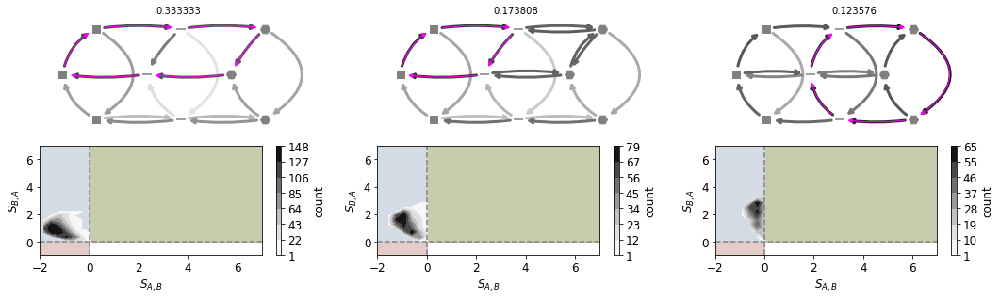

3 1 0
4 1 1
5 1 2


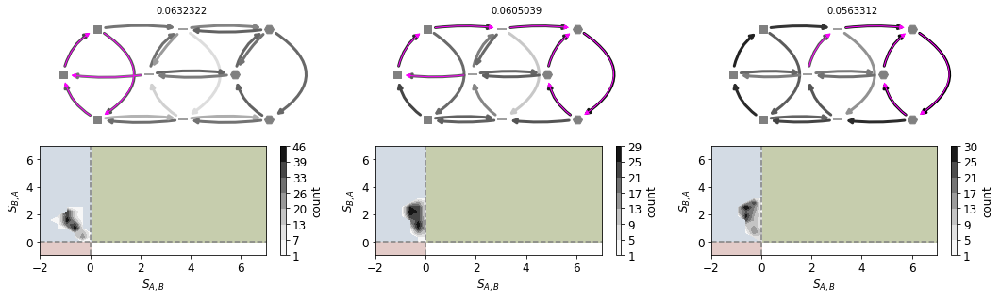

6 2 0
7 2 1


<ipython-input-20-c98954b0ec77>:205: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


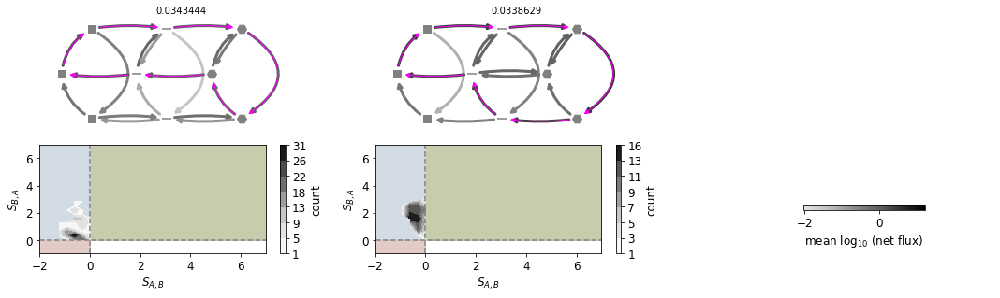

In [20]:
green="#c6cdad"
blue="#d3dbe4"
red="#e3cbc8"

xlim=7
ylim=7
cmapgreys=truncate_colormap(plt.cm.Greys,minval=0.2,maxval=1.0)


percent=0.9
for key in [0]:
    labls_=alllabls[key]
    print(labls_)
    #Now sort according to fluxes

    
    title,alluniques,smat,quadrants,SAB_values,SBA_values=paths_dict[key]


    #print("seed", seed, "percent", percent)
    #for q in range(3):

    unique_paths,idxsup,countup=alluniques
    total=np.sum(countup)
    argsort=np.argsort(countup)[::-1]
    counts_sorted=countup[argsort]
    #print(countup[argsort])


    m_allGs=[] #graphs for each instance with the dominant path
    dominantG=[] #dominant graphs
    corresponding_synergies=[] #corresponding synergies for each path
    percentage_positive=[]
    cumsum=np.cumsum(counts_sorted)
    threshold=np.where(cumsum>percent*total)[0][0]
    #print(cumsum)
    #print('total', total,percent*total,'threshold',threshold,countup[argsort[0:threshold]], '+1?', countup[argsort[0:threshold+1]])
    if threshold==0:
        threshold=1

    for inum,i in enumerate(argsort[0:threshold]):
        #print(inum)
        #get correaponding graph for each path

        path=unique_paths[i]

        print(path)
        print(np.array(labls_)[np.asarray(path,dtype=bool)])
        original_idxs=np.where(idxsup==i)[0] #positions where this path was
        quadrants_p=quadrants[original_idxs]
        #print("count is,", countup[i], "original indexes len is", len(original_idxs))
        #find fluxes corresponding to this path
        #smat_=smat[quadrants==q+1].copy()
        smat_=smat[original_idxs].copy()
        
        matnfi=np.log10(smat_)
        matnfi[matnfi<min_nflog]=min_nflog


        #get graphs that share this dominant path
        all_Gs=[]
        for row in matnfi:
            #Gs=[]
            J=row
            edgelabls=labls_
            G=fluxes.get_graph_fromJarray(J,edgelabls,min_=min_nflog)

            #Gs.append(G)
            #all_Gs.append(Gs)

            all_Gs.append(G)
        common_U=fluxes.merge_graphs(all_Gs)
        dominant=fluxes.get_dominant_path_G(G,node0) #since all have the same dominant path, use the last one
        m_allGs.append(common_U)
        dominantG.append(dominant)
        #allranks[q][pc].append([path,countup[i],all_Gs])
        #mask=(quadrants==q+1)
        SABoriginal=SAB_values[original_idxs]
        SBAoriginal=SBA_values[original_idxs]
        print('path %d, %d instances'%(i,len(original_idxs)))

        corresponding_synergies.append([SABoriginal,SBAoriginal])
        percentage_positive.append(np.sum(SABoriginal>0)/len(SABoriginal))


    #plot
    m=5
    max_nflog=np.log10(np.max(smat))
    #cmap=plt.cm.summer_r
    cmap=plt.cm.Greys



    #gs=mpl.gridspec.GridSpec(6*nr,nc)

    #fig.suptitle("%s,percent %g"%(title,percent),y=1.05)


    mins=[min([G[e[0]][e[1]]["weight"] for e in G.edges]) for G in m_allGs]
    minv=min(mins)

    maxs=[max([G[e[0]][e[1]]["weight"] for e in G.edges]) for G in m_allGs]
    maxv=max(maxs)


    nr=2
    nc=3

    neworder=[]
    #first find the ones with percentage_positive < 0.5
    for i,item_ in enumerate(percentage_positive):
        if item_>=0.5:
            neworder.append(i)
    print("first items", len(neworder))
    for i,item_ in enumerate(percentage_positive):
        if item_<0.5:
            neworder.append(i)
    pltnum=1
    for i,inum in enumerate(neworder):

        row=i//nc
        col=i%nc
        if col==0:
            if i>0:
                plt.tight_layout()
                plt.savefig("/Users/rosamartinezcorral/Dropbox (HMS)/work2/papersyn/figs/panels/fluxessupplk2k4_%d.pdf"%pltnum,bbox_inches="tight")
                plt.show()
                pltnum+=1
            fig,axes=plt.subplots(nr,nc,figsize=(5*nc,2.3*nr))
        print(i,row,col)
        ax=axes[0,col]
        #ax=fig.add_subplot(gs[row:row+5,col:col+1]) #axes_[2*row][col]
        ax.set_title("%g"%(counts_sorted[inum]/total),fontsize=10)
        #print(inum)

        #In this case graphs may have different connectivity
        G=m_allGs[inum]
        colors_=[G[e[0]][e[1]]["weight"] for e in G.edges]
        G2=dominantG[inum]
        #print(minv,colors_w)
        fluxes.plot_graphs([G],[ax],coords=coords,color_lists=[colors_],dominant=[G2],color_args={"edge_cmap":cmapgreys,"edge_vmin":minv,"edge_vmax":maxv,"width":3},colord="magenta")
        ax.set_frame_on(False)
        #cax=fig.add_axes([1,0.6,0.01,0.3])
        #norm = mpl.colors.Normalize(vmin=minv,vmax=maxv)
        #cwidth=0.85/nc
        #cax=fig.add_axes([(col)*(1/nc)+cwidth,1-row*1/nr,0.01,0.9/nr])
        #cb=mpl.colorbar.ColorbarBase(cmap=cmapgreys,norm=norm,ax=cax,orientation='vertical',label="mean\n$\log_{10}$ (net flux)",ticks=[-0.5,0,1])
        #cb.ax.set_yticks()
        #cb.yaxes.set_ylabel()

        ax=axes[1,col]
        #ax=fig.add_subplot(gs[6*row+5:,col:col+1])
        #patch=plt.Polygon([[0,0],[5,0],[5,5],[0,5]],color=green)
        #ax.add_patch(patch)
        ax.fill_between([0,xlim],0,ylim,color=green)
        ax.fill_between([-2,0],0,ylim,color=blue)
        ax.fill_between([-2,0],0,-1,color=red)
        x=corresponding_synergies[inum][0]
        y=corresponding_synergies[inum][1]
        H,xbins,ybins=np.histogram2d(y,x,bins=[np.linspace(-2,xlim,30),np.linspace(-2,ylim,30)])
        mask=H<1
        #mask1=
        cmap1=plt.cm.Greys
        #cmap1.set_under(green)
        #cmap1.set_bad(green)
        #ax.contourf(H,8,extent=[xbins[0],xbins[-1],ybins[0],ybins[-1]],origin="lower",cmap=cmap1,zorder=2)
        levels=list(map(int,np.linspace(1,np.max(H),8)))
        cf=ax.contourf(np.ma.masked_array(H,mask=mask),levels,extent=[xbins[0],xbins[-1],ybins[0],ybins[-1]],vmin=1,origin="lower",cmap=cmap1,zorder=2)
        plt.colorbar(cf,ax=ax,label="count")
        #contours.append(cf)
        #ax.imshow(np.ma.masked_array(H,mask=mask),extent=[xbins[0],xbins[-1],ybins[0],ybins[-1]],origin="lower",cmap=cmap1,zorder=2)
        #sns.kdeplot(*corresponding_synergies[inum],ax=ax,shade=True,cbar=True,cmap=plt.cm.Greys)
        ax.axvline(x=0,linestyle="--",color="gray",zorder=2)
        ax.axhline(y=0,linestyle="--",color="gray",zorder=2)
        ax.set_xlabel(r'$S_{A,B}$')
        ax.set_ylabel(r'$S_{B,A}$')
        ax.set_xlim(-2,xlim)
        ax.set_ylim(-1,ylim)

    #plt.tight_layout()
    #plt.show()
    #norm = mpl.colors.Normalize(vmin=minv,vmax=maxv)
    #mpl.colorbar.ColorbarBase(cmap=cmap,norm=norm,ax=cax,orientation='vertical')
    #cax.set_ylabel()
    #inum=11
    #row=inum//nc
    #col=inum%nc
    #fig,ax=plt.subplots(1,1,)
    ax=axes[0,2]
    ax.set_frame_on(False)
    ax.set_xticks([])
    ax.set_yticks([])

    ax=axes[1,2]
    ax.set_frame_on(False)
    ax.set_xticks([])
    ax.set_yticks([])


    cax=fig.add_axes([0.8,0.3,0.12,0.02])
    norm = mpl.colors.Normalize(vmin=minv,vmax=maxv)
    mpl.colorbar.ColorbarBase(cmap=cmapgreys,norm=norm,ax=cax,orientation='horizontal',label="mean $\log_{10}$ (net flux)")
    #cax.set_ylabel("count")

    plt.tight_layout()
    plt.savefig("/Users/rosamartinezcorral/Dropbox (HMS)/work2/papersyn/figs/panels/fluxessupplk2k4_%d.pdf"%pltnum,bbox_inches="tight")
    plt.show()

Print parameter sets for this path, which is the one that we would expect for A acting on k4 and B acting on k2

#path
[0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1]
['1-4.AB' '2-8.AB' '4-5.AB' '5-2.AB' '7-1.AB' '8-7.AB']
5735
[  7.89054241  13.63253757 171.37765372   2.21447193]
[ 7.89054241 13.63253757  3.23501305  2.21447193]
[ 18.7602641   13.63253757 171.37765372   2.21447193]
7.890542408335324,13.63253757013443,171.37765372083004,2.214471926581427,7.890542408335324,13.63253757013443,3.235013052936797,2.214471926581427,18.760264095437567,13.63253757013443,171.37765372083004,2.214471926581427,7386.718871521808,986.5909165513018,7386.718871521808,986.5909165513018,7386.718871521808,986.5909165513018,7386.718871521808,986.5909165513018,7386.718871521808,986.5909165513018,7386.718871521808,986.5909165513018
*****negative SAB
[-1.3670082045851497, 0.3949087267863164, [0.0956060576718812, 0.6977214113003132, 0.20572743168938054, 0.2705026827734625]]
0 0 0.09560605767188118
2 0 0.6977214113003132
0 2 0.2057274316893806
1 1 0.27050268277346246


<ipython-input-22-5923f238d122>:89: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


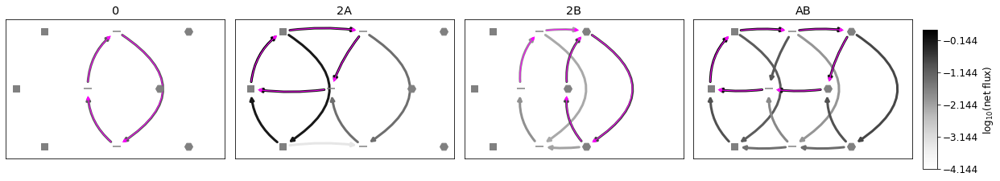

3311
[1.80403141e+02 1.29940496e+01 5.29520897e+03 1.09102306e+00]
[180.40314084  12.99404958 202.17157131   1.09102306]
[1.82926559e+02 1.29940496e+01 5.29520897e+03 1.09102306e+00]
180.40314084223385,12.99404957748655,5295.20896802987,1.0910230586452,180.40314084223385,12.99404957748655,202.1715713096873,1.0910230586452,182.9265591880213,12.99404957748655,5295.20896802987,1.0910230586452,8436.705074338706,693.2453244140692,8436.705074338706,693.2453244140692,8436.705074338706,693.2453244140692,8436.705074338706,693.2453244140692,8436.705074338706,693.2453244140692,8436.705074338706,693.2453244140692
*****negative SAB
[-1.2159239348305484, 2.067681778338042, [0.03583928424555513, 0.35351803762263406, 0.036303438731815366, 0.15218855760961286]]
0 0 0.03583928424555514
2 0 0.35351803762263406
0 2 0.036303438731815366
1 1 0.15218855760961286


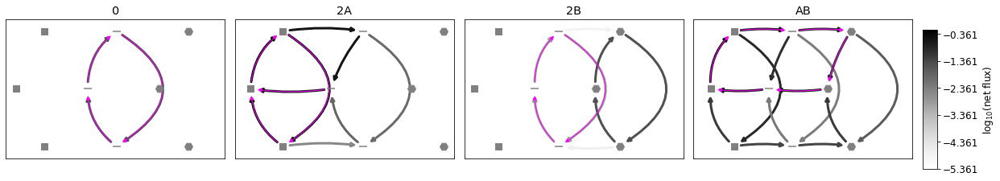

1669
[1.21757924e+00 2.69194151e+03 6.99606460e+02 6.28384101e+01]
[1.21757924e+00 2.69194151e+03 5.88893152e+00 6.28384101e+01]
[   5.11272169 2691.94150695  699.60645961   62.83841014]
1.2175792387880628,2691.9415069482984,699.606459607673,62.838410141349534,1.2175792387880628,2691.9415069482984,5.888931524251405,62.838410141349534,5.112721689107869,2691.9415069482984,699.606459607673,62.838410141349534,6573.517490371512,328.82513618394705,6573.517490371512,328.82513618394705,6573.517490371512,328.82513618394705,6573.517490371512,328.82513618394705,6573.517490371512,328.82513618394705,6573.517490371512,328.82513618394705
*****negative SAB
[-0.7639776758735152, 0.34933640050153725, [0.10018548928491514, 0.8886752609607503, 0.4107732544430376, 0.5233146513500937]]
0 0 0.10018548928491512
2 0 0.8886752609607503
0 2 0.41077325444303764
1 1 0.5233146513500937


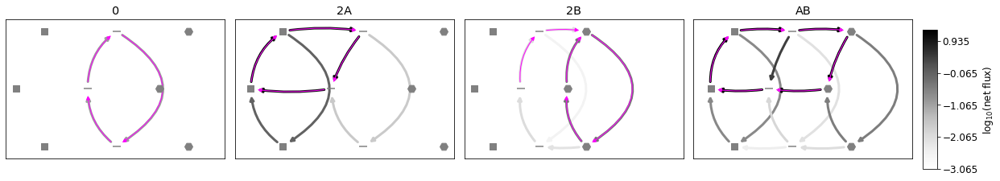

4933
[ 21.72215804  35.04268439 387.94092746  10.61069587]
[21.72215804 35.04268439  2.88552964 10.61069587]
[ 23.72347228  35.04268439 387.94092746  10.61069587]
21.722158036154905,35.04268438631872,387.94092746171975,10.610695874443186,21.722158036154905,35.04268438631872,2.885529635172773,10.610695874443186,23.72347227637547,35.04268438631872,387.94092746171975,10.610695874443186,1611.3569397081196,182.2201982071884,1611.3569397081196,182.2201982071884,1611.3569397081196,182.2201982071884,1611.3569397081196,182.2201982071884,1611.3569397081196,182.2201982071884,1611.3569397081196,182.2201982071884
*****negative SAB
[-1.3591630930067087, 1.3489661646577256, [0.539970982510029, 3.8142068319774656, 0.5836817320007651, 1.4868096792517167]]
0 0 0.539970982510029
2 0 3.8142068319774656
0 2 0.5836817320007651
1 1 1.4868096792517167


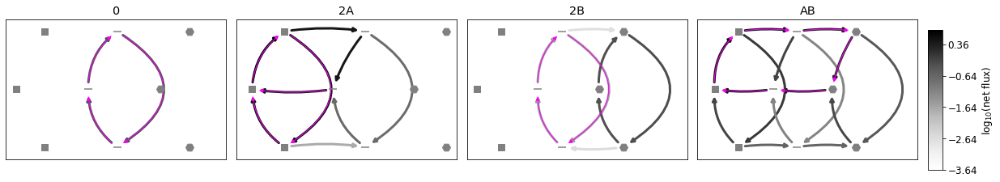

4007
[  26.95001736   35.11952642 2239.48849007   59.41932336]
[26.95001736 35.11952642 70.93585743 59.41932336]
[  36.34887127   35.11952642 2239.48849007   59.41932336]
26.950017361191207,35.11952642004377,2239.488490069714,59.41932336045512,26.950017361191207,35.11952642004377,70.93585742902847,59.41932336045512,36.34887126527643,35.11952642004377,2239.488490069714,59.41932336045512,6293.646683594298,1891.562930247628,6293.646683594298,1891.562930247628,6293.646683594298,1891.562930247628,6293.646683594298,1891.562930247628,6293.646683594298,1891.562930247628,6293.646683594298,1891.562930247628
*****negative SAB
[-1.1321740710177683, 0.8845082874911272, [0.6752612976544752, 3.528129963053691, 0.8718920001181385, 1.6096305970387579]]
0 0 0.6752612976544752
2 0 3.528129963053691
0 2 0.8718920001181385
1 1 1.609630597038758


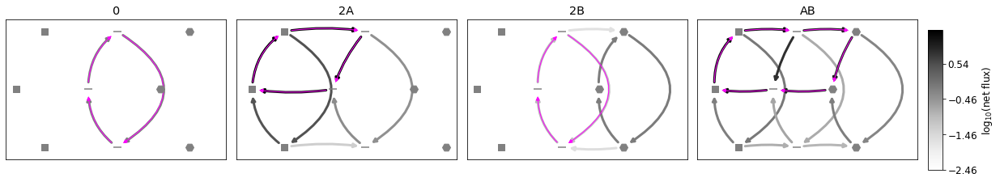

6059
[4.24646980e+01 8.88063206e+01 1.64442500e+03 1.01558495e+00]
[42.46469797 88.80632058  7.85681898  1.01558495]
[5.00061679e+01 8.88063206e+01 1.64442500e+03 1.01558495e+00]
42.46469797134733,88.8063205753123,1644.4250003040354,1.0155849495020424,42.46469797134733,88.8063205753123,7.856818982855223,1.0155849495020424,50.00616789091588,88.8063205753123,1644.4250003040354,1.0155849495020424,3119.841863085436,746.6667943938185,3119.841863085436,746.6667943938185,3119.841863085436,746.6667943938185,3119.841863085436,746.6667943938185,3119.841863085436,746.6667943938185,3119.841863085436,746.6667943938185
*****negative SAB
[-1.4828898397610837, 1.4124734325242987, [0.02554296398564415, 0.21930417359664886, 0.029475128257391695, 0.07846077161069445]]
0 0 0.025542963985644155
2 0 0.21930417359664886
0 2 0.029475128257391695
1 1 0.07846077161069445


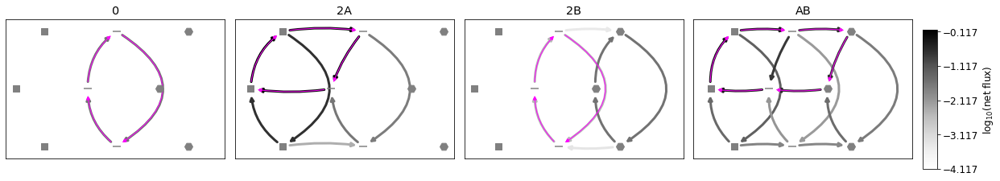

5180
[3.78564159e+00 6.94043528e+03 1.49450007e+03 1.42384817e+02]
[3.78564159e+00 6.94043528e+03 1.18581020e+02 1.42384817e+02]
[3.85618369e+00 6.94043528e+03 1.49450007e+03 1.42384817e+02]
3.7856415937746135,6940.435280533175,1494.5000665846526,142.38481721225412,3.7856415937746135,6940.435280533175,118.58101982013557,142.38481721225412,3.8561836875931848,6940.435280533175,1494.5000665846526,142.38481721225412,9722.594754321488,202.83608754601423,9722.594754321488,202.83608754601423,9722.594754321488,202.83608754601423,9722.594754321488,202.83608754601423,9722.594754321488,202.83608754601423,9722.594754321488,202.83608754601423
*****negative SAB
[-0.9887636045565326, 1.5454879711426592, [0.32851956810872146, 1.9380470672073191, 0.3345635157203746, 0.9766002170730814]]
0 0 0.32851956810872146
2 0 1.9380470672073191
0 2 0.33456351572037457
1 1 0.9766002170730814


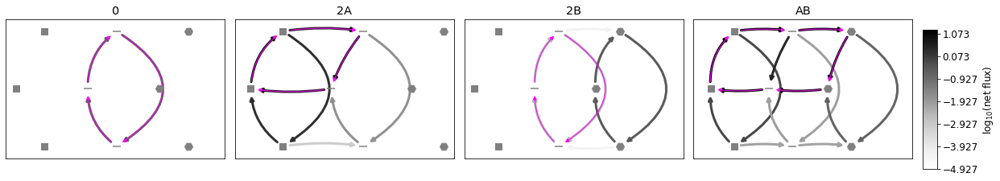

6036
[   6.1666228  3805.52052909  826.56667547   35.8599116 ]
[   6.1666228  3805.52052909    7.4679625    35.8599116 ]
[   6.44745035 3805.52052909  826.56667547   35.8599116 ]
6.166622799124539,3805.5205290904,826.5666754675575,35.85991160292764,6.166622799124539,3805.5205290904,7.467962504985562,35.85991160292764,6.4474503531780245,3805.5205290904,826.5666754675575,35.85991160292764,2799.4351138872057,591.5135597331862,2799.4351138872057,591.5135597331862,2799.4351138872057,591.5135597331862,2799.4351138872057,591.5135597331862,2799.4351138872057,591.5135597331862,2799.4351138872057,591.5135597331862
*****negative SAB
[-1.5315705448145092, 1.2722185934493109, [0.25457228198613585, 1.8502774148285286, 0.26497946296017877, 0.6400120829756354]]
0 0 0.25457228198613585
2 0 1.8502774148285284
0 2 0.26497946296017877
1 1 0.6400120829756354


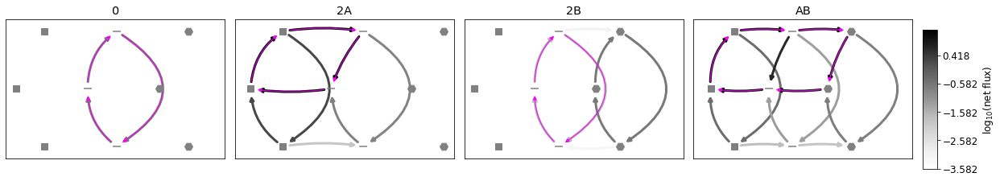

5393
[  1.7058869   57.39231318 380.98452377  11.19228902]
[ 1.7058869  57.39231318  2.33989021 11.19228902]
[  3.26983082  57.39231318 380.98452377  11.19228902]
1.7058868993794272,57.3923131762772,380.9845237707968,11.192289017830545,1.7058868993794272,57.3923131762772,2.339890208484872,11.192289017830545,3.269830815361564,57.3923131762772,380.9845237707968,11.192289017830545,6330.054003950369,1858.858957012378,6330.054003950369,1858.858957012378,6330.054003950369,1858.858957012378,6330.054003950369,1858.858957012378,6330.054003950369,1858.858957012378,6330.054003950369,1858.858957012378
*****negative SAB
[-1.31983545654759, 0.48480460285053883, [0.048432356045752405, 0.3031961391531579, 0.08679063732473612, 0.12145449847790209]]
0 0 0.048432356045752405
2 0 0.3031961391531579
0 2 0.08679063732473609
1 1 0.12145449847790207


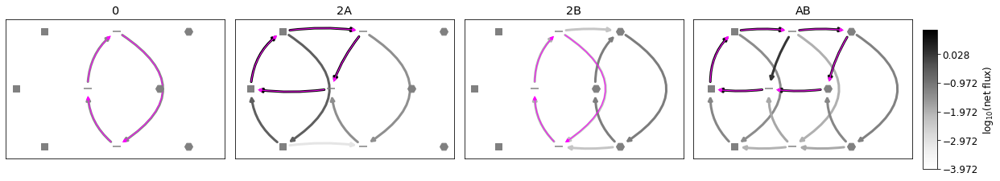

5872
[1.73593781e+00 3.66844088e+01 1.09139141e+03 1.02880571e+00]
[ 1.73593781 36.68440884 96.4697911   1.02880571]
[2.52116126e+00 3.66844088e+01 1.09139141e+03 1.02880571e+00]
1.7359378071110456,36.68440884054415,1091.3914139057968,1.0288057148794694,1.7359378071110456,36.68440884054415,96.4697910972202,1.0288057148794694,2.5211612563524617,36.68440884054415,1091.3914139057968,1.0288057148794694,9526.365636867182,212.20995661828616,9526.365636867182,212.20995661828616,9526.365636867182,212.20995661828616,9526.365636867182,212.20995661828616,9526.365636867182,212.20995661828616,9526.365636867182,212.20995661828616
*****negative SAB
[-1.3290866885886343, 1.4566315078686658, [0.0016321831791077613, 0.01627836428609581, 0.0023606196968761163, 0.0064791167093302925]]
0 0 0.0016321831791077615
2 0 0.016278364286095807
0 2 0.0023606196968761154
1 1 0.0064791167093302925


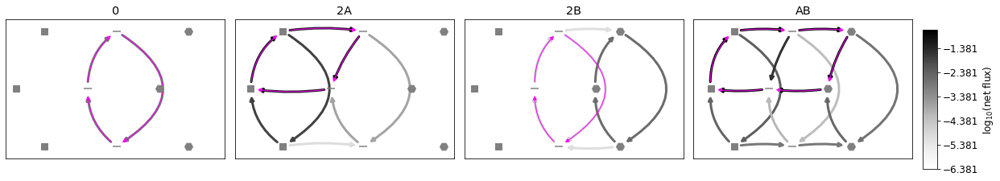

5226
[1.34147180e+01 8.83751145e+03 1.99336915e+02 7.47548095e+00]
[1.34147180e+01 8.83751145e+03 2.69648584e+00 7.47548095e+00]
[2.49169820e+01 8.83751145e+03 1.99336915e+02 7.47548095e+00]
13.414718042234592,8837.511449529833,199.3369147546412,7.475480950137631,13.414718042234592,8837.511449529833,2.696485843340122,7.475480950137631,24.91698198242364,8837.511449529833,199.3369147546412,7.475480950137631,2651.796275947725,684.3664666610421,2651.796275947725,684.3664666610421,2651.796275947725,684.3664666610421,2651.796275947725,684.3664666610421,2651.796275947725,684.3664666610421,2651.796275947725,684.3664666610421
*****negative SAB
[-1.0610656359453918, 0.4662805437894867, [0.45533132006700977, 2.206929256326264, 0.7656167003354405, 1.0577324499296696]]
0 0 0.45533132006700977
2 0 2.2069292563262644
0 2 0.7656167003354405
1 1 1.0577324499296699


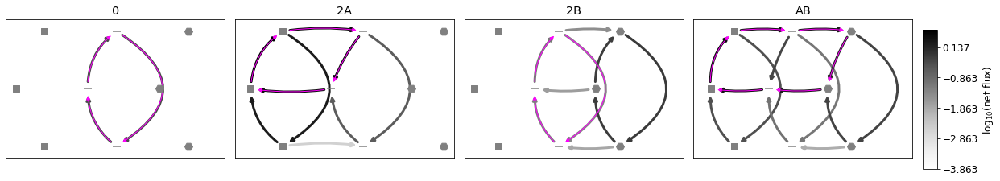

3111
[  8.34461493   1.19570054 761.07861163  10.84466615]
[ 8.34461493  1.19570054 17.12359111 10.84466615]
[  8.8710982    1.19570054 761.07861163  10.84466615]
8.344614930306772,1.1957005441464734,761.0786116286961,10.844666148912108,8.344614930306772,1.1957005441464734,17.12359110887055,10.844666148912108,8.871098200133414,1.1957005441464734,761.0786116286961,10.844666148912108,9617.142334154956,174.32879855445722,9617.142334154956,174.32879855445722,9617.142334154956,174.32879855445722,9617.142334154956,174.32879855445722,9617.142334154956,174.32879855445722,9617.142334154956,174.32879855445722
*****negative SAB
[-1.0781726606406044, 1.6965993815976097, [0.10572397564881633, 0.7640908785703433, 0.11164914443385734, 0.3618951008666179]]
0 0 0.10572397564881633
2 0 0.7640908785703433
0 2 0.11164914443385733
1 1 0.3618951008666179


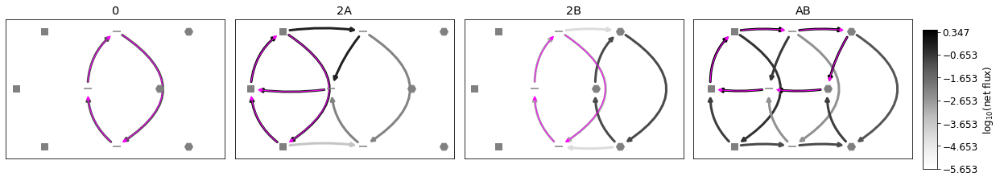

5741
[2.38757242e+01 4.96900503e+01 1.24600644e+03 1.15710282e+00]
[23.87572422 49.6900503  77.05848621  1.15710282]
[2.74530426e+01 4.96900503e+01 1.24600644e+03 1.15710282e+00]
23.875724218273994,49.69005030021378,1246.00644348074,1.1571028204845974,23.875724218273994,49.69005030021378,77.05848620510784,1.1571028204845974,27.45304263116189,49.69005030021378,1246.00644348074,1.1571028204845974,4017.647268184709,318.3024295412814,4017.647268184709,318.3024295412814,4017.647268184709,318.3024295412814,4017.647268184709,318.3024295412814,4017.647268184709,318.3024295412814,4017.647268184709,318.3024295412814
*****negative SAB
[-1.375548558512122, 1.5972788117527752, [0.021725991682934563, 0.19460784672491502, 0.024788493687086494, 0.07500305801289965]]
0 0 0.021725991682934567
2 0 0.19460784672491502
0 2 0.02478849368708649
1 1 0.07500305801289964


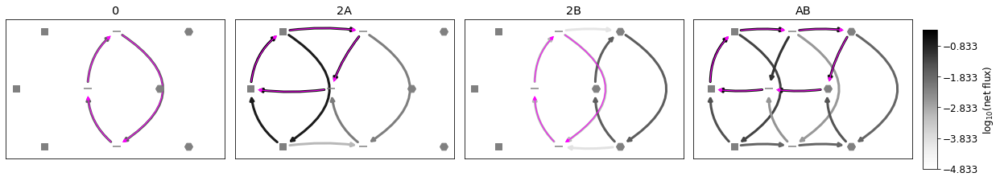

6022
[  3.99906811  40.96685769 152.99010161   8.50423531]
[ 3.99906811 40.96685769  3.50003987  8.50423531]
[  5.26464848  40.96685769 152.99010161   8.50423531]
3.9990681060476168,40.96685769004684,152.99010160648035,8.504235312073806,3.9990681060476168,40.96685769004684,3.5000398674378457,8.504235312073806,5.264648477393177,40.96685769004684,152.99010160648035,8.504235312073806,4918.55190768932,216.06075589838417,4918.55190768932,216.06075589838417,4918.55190768932,216.06075589838417,4918.55190768932,216.06075589838417,4918.55190768932,216.06075589838417,4918.55190768932,216.06075589838417
*****negative SAB
[-1.7627432070688804, 0.9168691938659543, [0.20447503244310014, 1.7004244225188139, 0.26540776481256895, 0.5010934823313368]]
0 0 0.20447503244310014
2 0 1.7004244225188139
0 2 0.26540776481256895
1 1 0.5010934823313368


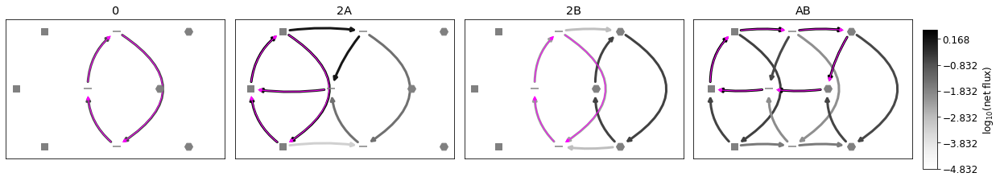

2994
[   4.78023281 1683.04665792  191.63738062   10.79085293]
[   4.78023281 1683.04665792   11.62131423   10.79085293]
[  11.06470758 1683.04665792  191.63738062   10.79085293]
4.780232806768388,1683.0466579223078,191.63738061889612,10.790852930707564,4.780232806768388,1683.0466579223078,11.621314227802095,10.790852930707564,11.064707584829272,1683.0466579223078,191.63738061889612,10.790852930707564,815.3645212760918,104.8618406677609,815.3645212760918,104.8618406677609,815.3645212760918,104.8618406677609,815.3645212760918,104.8618406677609,815.3645212760918,104.8618406677609,815.3645212760918,104.8618406677609
*****negative SAB
[-0.8126763373056168, 0.5477975898260905, [0.2489046975419494, 1.3886072441372586, 0.5407991074774419, 0.790568438609669]]
0 0 0.24890469754194938
2 0 1.3886072441372586
0 2 0.540799107477442
1 1 0.790568438609669


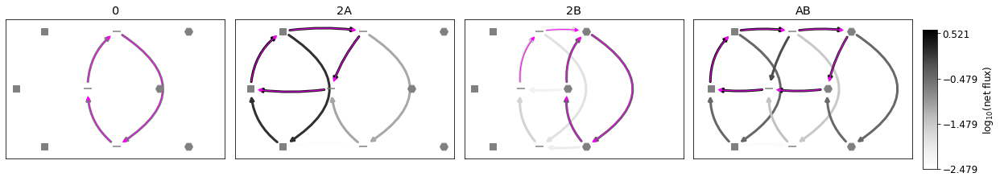

6158
[1.08000512e+00 4.60856561e+03 7.76486727e+01 4.46411334e+00]
[1.08000512e+00 4.60856561e+03 2.14013271e+00 4.46411334e+00]
[1.12246162e+00 4.60856561e+03 7.76486727e+01 4.46411334e+00]
1.0800051192344096,4608.565607612827,77.64867273021646,4.464113340235836,1.0800051192344096,4608.565607612827,2.140132707135157,4.464113340235836,1.1224616229855848,4608.565607612827,77.64867273021646,4.464113340235836,2666.757666058013,266.85172773029143,2666.757666058013,266.85172773029143,2666.757666058013,266.85172773029143,2666.757666058013,266.85172773029143,2666.757666058013,266.85172773029143,2666.757666058013,266.85172773029143
*****negative SAB
[-1.9088494633034547, 0.9269629871989747, [0.05795219230519786, 0.42902786552025174, 0.06009258563235378, 0.11425219568156865]]
0 0 0.05795219230519785
2 0 0.4290278655202517
0 2 0.06009258563235378
1 1 0.11425219568156865


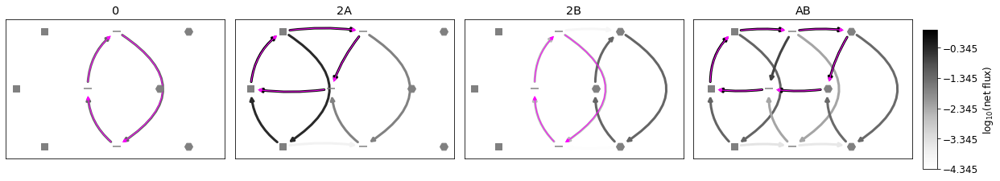

3298
[3.66301132e+00 1.73304550e+03 1.29930124e+03 1.06741094e+00]
[3.66301132e+00 1.73304550e+03 8.75720094e+00 1.06741094e+00]
[1.07380239e+01 1.73304550e+03 1.29930124e+03 1.06741094e+00]
3.663011316507242,1733.0455016555193,1299.3012364446015,1.0674109392823787,3.663011316507242,1733.0455016555193,8.75720093923201,1.0674109392823787,10.738023865444152,1733.0455016555193,1299.3012364446015,1.0674109392823787,9882.772107480689,2713.794581696353,9882.772107480689,2713.794581696353,9882.772107480689,2713.794581696353,9882.772107480689,2713.794581696353,9882.772107480689,2713.794581696353,9882.772107480689,2713.794581696353
*****negative SAB
[-1.1994966042431632, 0.3859913252887611, [0.0029983409983079857, 0.02416421332458587, 0.008051804777532135, 0.010521755448465366]]
0 0 0.002998340998307986
2 0 0.02416421332458587
0 2 0.008051804777532135
1 1 0.010521755448465366


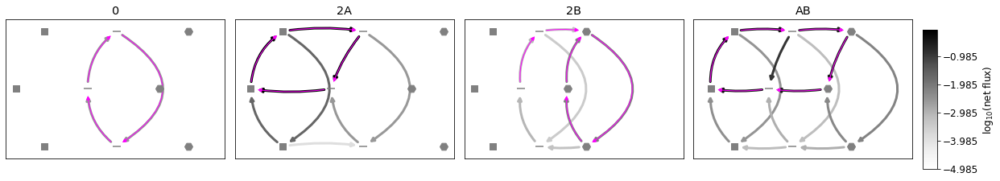

4161
[  26.61355625 3013.55305993  321.16904319    7.70852975]
[  26.61355625 3013.55305993   37.85229059    7.70852975]
[  50.96718196 3013.55305993  321.16904319    7.70852975]
26.61355625225588,3013.5530599307413,321.1690431885096,7.708529749168497,26.61355625225588,3013.5530599307413,37.85229058657326,7.708529749168497,50.96718195808399,3013.5530599307413,321.1690431885096,7.708529749168497,5521.023836647368,398.13125037812455,5521.023836647368,398.13125037812455,5521.023836647368,398.13125037812455,5521.023836647368,398.13125037812455,5521.023836647368,398.13125037812455,5521.023836647368,398.13125037812455
*****negative SAB
[-0.8294530041512743, 0.4685821654222946, [0.5769823617648052, 2.5057138628732565, 1.0190229245376772, 1.4100718462844357]]
0 0 0.5769823617648053
2 0 2.505713862873256
0 2 1.019022924537677
1 1 1.4100718462844357


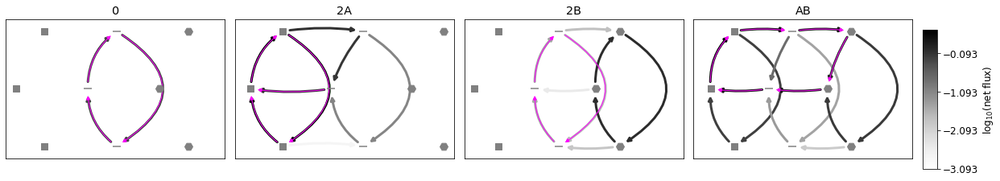

4943
[  6.18787485   2.17742502 309.22043961   1.1555927 ]
[6.18787485 2.17742502 1.50809615 1.1555927 ]
[ 12.23093995   2.17742502 309.22043961   1.1555927 ]
6.1878748465373,2.177425017830227,309.22043961223306,1.155592701630714,6.1878748465373,2.177425017830227,1.5080961482195805,1.155592701630714,12.230939950042565,2.177425017830227,309.22043961223306,1.155592701630714,867.7232653401968,174.94645684459792,867.7232653401968,174.94645684459792,867.7232653401968,174.94645684459792,867.7232653401968,174.94645684459792,867.7232653401968,174.94645684459792,867.7232653401968,174.94645684459792
*****negative SAB
[-1.348382401466222, 0.8952373516151018, [0.022356447732982995, 0.19466993958711454, 0.041105700117226224, 0.07645314328329882]]
0 0 0.022356447732982995
2 0 0.1946699395871145
0 2 0.04110570011722622
1 1 0.07645314328329882


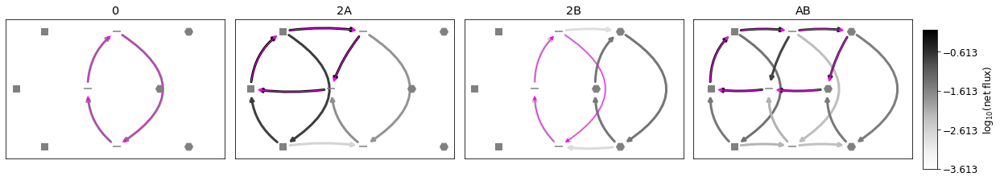

5151
[  3.331808    16.07447309 146.04121207   7.05532738]
[ 3.331808   16.07447309  1.93975846  7.05532738]
[  5.9267598   16.07447309 146.04121207   7.05532738]
3.331808004405438,16.074473086462373,146.04121207449484,7.055327376200622,3.331808004405438,16.074473086462373,1.9397584606954987,7.055327376200622,5.926759802070981,16.074473086462373,146.04121207449484,7.055327376200622,4003.4985739760095,726.3250484254438,4003.4985739760095,726.3250484254438,4003.4985739760095,726.3250484254438,4003.4985739760095,726.3250484254438,4003.4985739760095,726.3250484254438,4003.4985739760095,726.3250484254438
*****negative SAB
[-1.3652520354747484, 0.5132523675975234, [0.14888142279147643, 0.9184062335412806, 0.24977481757857045, 0.35649464324892083]]
0 0 0.14888142279147643
2 0 0.9184062335412805
0 2 0.24977481757857048
1 1 0.3564946432489209


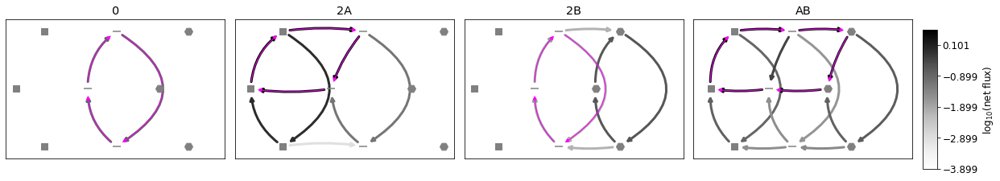

5926
[   3.97710588   10.12693718 1562.2244057    24.37296446]
[  3.97710588  10.12693718 116.04675652  24.37296446]
[   4.21371327   10.12693718 1562.2244057    24.37296446]
3.977105877309772,10.126937175564295,1562.224405702604,24.372964460182796,3.977105877309772,10.126937175564295,116.04675652372325,24.372964460182796,4.213713273455596,10.126937175564295,1562.224405702604,24.372964460182796,2412.1341244448686,33.03851316973549,2412.1341244448686,33.03851316973549,2412.1341244448686,33.03851316973549,2412.1341244448686,33.03851316973549,2412.1341244448686,33.03851316973549,2412.1341244448686,33.03851316973549
*****negative SAB
[-0.9078938241475201, 2.317614296369739, [0.06057812126997732, 0.5997982353061407, 0.06412545920543469, 0.3196700211072219]]
0 0 0.0605781212699773
2 0 0.5997982353061407
0 2 0.0641254592054347
1 1 0.31967002110722187


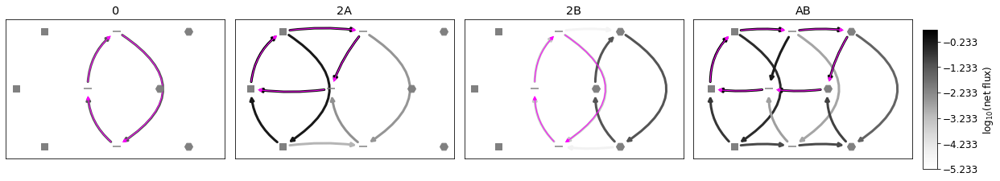

5560
[  52.31939904   88.64981862 1137.85156053   19.20880704]
[52.31939904 88.64981862  3.14873234 19.20880704]
[  53.01830374   88.64981862 1137.85156053   19.20880704]
52.319399037391854,88.64981861962538,1137.8515605278278,19.20880703972171,52.319399037391854,88.64981861962538,3.148732337971384,19.20880703972171,53.01830374008907,88.64981861962538,1137.8515605278278,19.20880703972171,8435.366220706954,2114.476199504232,8435.366220706954,2114.476199504232,8435.366220706954,2114.476199504232,8435.366220706954,2114.476199504232,8435.366220706954,2114.476199504232,8435.366220706954,2114.476199504232
*****negative SAB
[-1.560841680117351, 0.9897493746729538, [0.8232814886723331, 4.877631497812937, 0.8325389718810191, 1.6532891755288799]]
0 0 0.8232814886723332
2 0 4.877631497812936
0 2 0.8325389718810192
1 1 1.6532891755288799


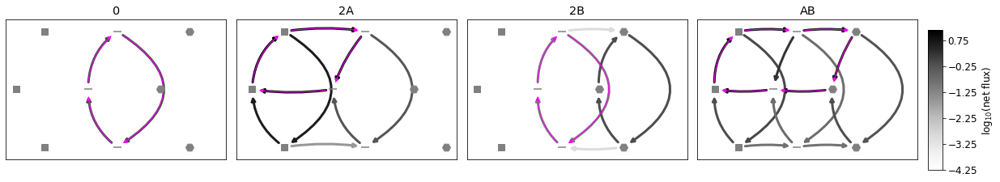

5934
[  1.53911797  17.73285095 260.98935697   1.31462319]
[ 1.53911797 17.73285095  5.0152908   1.31462319]
[  2.73049944  17.73285095 260.98935697   1.31462319]
1.5391179727323787,17.73285095148143,260.9893569746556,1.3146231880589705,1.5391179727323787,17.73285095148143,5.0152908013948725,1.3146231880589705,2.730499436921477,17.73285095148143,260.9893569746556,1.3146231880589705,5977.090992012741,1307.566292432006,5977.090992012741,1307.566292432006,5977.090992012741,1307.566292432006,5977.090992012741,1307.566292432006,5977.090992012741,1307.566292432006,5977.090992012741,1307.566292432006
*****negative SAB
[-1.6823022082321692, 0.569347915752699, [0.007665485814746421, 0.06170659339068539, 0.012957384434624956, 0.019226850291692334]]
0 0 0.007665485814746421
2 0 0.06170659339068539
0 2 0.012957384434624956
1 1 0.019226850291692334


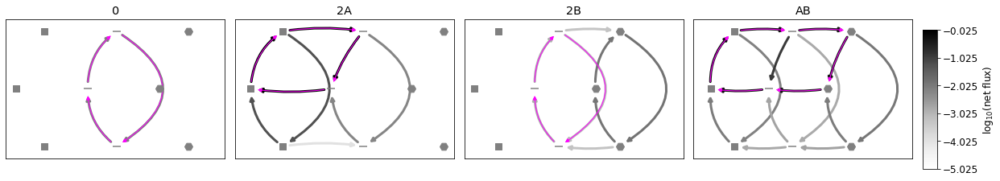

3915
[ 1.65168141  6.22971999 35.39893079  2.38085682]
[1.65168141 6.22971999 1.04663407 2.38085682]
[ 1.81244414  6.22971999 35.39893079  2.38085682]
1.6516814084372309,6.229719990464047,35.39893079139119,2.3808568214037424,1.6516814084372309,6.229719990464047,1.0466340718230316,2.3808568214037424,1.812444140409086,6.229719990464047,35.39893079139119,2.3808568214037424,5837.463187333123,544.6286041932193,5837.463187333123,544.6286041932193,5837.463187333123,544.6286041932193,5837.463187333123,544.6286041932193,5837.463187333123,544.6286041932193,5837.463187333123,544.6286041932193
*****negative SAB
[-1.6203438460227588, 0.7277116046085658, [0.09815655357401616, 0.5433467924215885, 0.10671905858254534, 0.17672785513713463]]
0 0 0.09815655357401618
2 0 0.5433467924215885
0 2 0.10671905858254535
1 1 0.17672785513713463


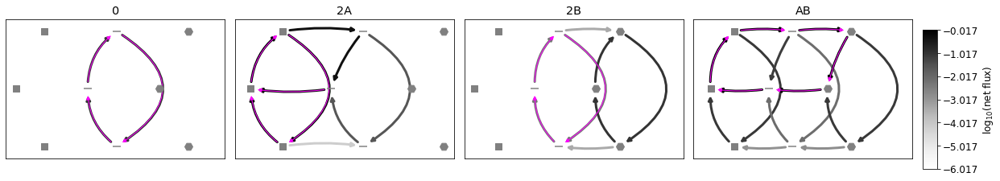

4354
[ 11.66142775  23.96987127 162.02600055   4.04499079]
[11.66142775 23.96987127  1.47403654  4.04499079]
[ 13.97805476  23.96987127 162.02600055   4.04499079]
11.66142775375588,23.969871272093773,162.02600055035796,4.044990789416458,11.66142775375588,23.969871272093773,1.4740365427046214,4.044990789416458,13.978054757477386,23.969871272093773,162.02600055035796,4.044990789416458,3253.5907431287465,3212.9483648556543,3253.5907431287465,3212.9483648556543,3253.5907431287465,3212.9483648556543,3253.5907431287465,3212.9483648556543,3253.5907431287465,3212.9483648556543,3253.5907431287465,3212.9483648556543
*****negative SAB
[-0.7165287012382068, 0.44460600917523047, [0.26249462135744356, 0.6584477476575795, 0.29443195292139707, 0.40070492895338444]]
0 0 0.26249462135744356
2 0 0.6584477476575795
0 2 0.29443195292139707
1 1 0.4007049289533845


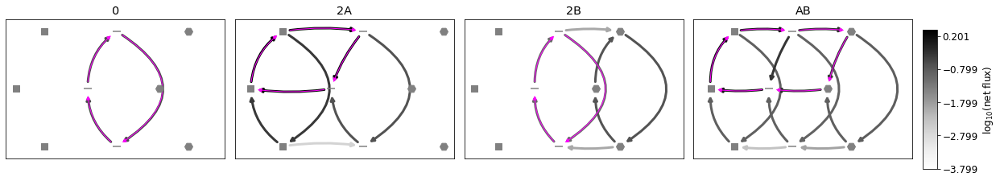

3476
[  70.75414209  127.81906889 3306.05038925    6.78705559]
[ 70.75414209 127.81906889   3.80486871   6.78705559]
[ 125.72398127  127.81906889 3306.05038925    6.78705559]
70.75414209331335,127.81906888943809,3306.050389245999,6.78705558849389,70.75414209331335,127.81906888943809,3.804868713137442,6.78705558849389,125.723981273526,127.81906888943809,3306.050389245999,6.78705558849389,7203.656422478532,3050.722698408307,7203.656422478532,3050.722698408307,7203.656422478532,3050.722698408307,7203.656422478532,3050.722698408307,7203.656422478532,3050.722698408307,7203.656422478532,3050.722698408307
*****negative SAB
[-1.1103804069578325, 0.7301129518453152, [0.1417664251425552, 0.8215007665071933, 0.22938460395623628, 0.38049605986732443]]
0 0 0.14176642514255516
2 0 0.8215007665071932
0 2 0.22938460395623628
1 1 0.3804960598673245


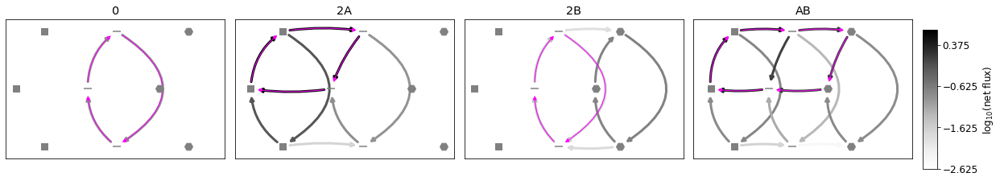

2964
[  3.98070131   6.51648569 116.59585909   4.91415417]
[3.98070131 6.51648569 6.40420446 4.91415417]
[  7.3770741    6.51648569 116.59585909   4.91415417]
3.980701314713823,6.516485690847404,116.59585909186409,4.914154174997494,3.980701314713823,6.516485690847404,6.404204460874007,4.914154174997494,7.377074100540725,6.516485690847404,116.59585909186409,4.914154174997494,8673.035308705677,12.501258132001643,8673.035308705677,12.501258132001643,8673.035308705677,12.501258132001643,8673.035308705677,12.501258132001643,8673.035308705677,12.501258132001643,8673.035308705677,12.501258132001643
*****negative SAB
[-0.848444083478138, 1.132840749832058, [0.15224051135873698, 1.0643081336676494, 0.26955116696390774, 0.5910990513630155]]
0 0 0.15224051135873695
2 0 1.0643081336676494
0 2 0.26955116696390774
1 1 0.5910990513630155


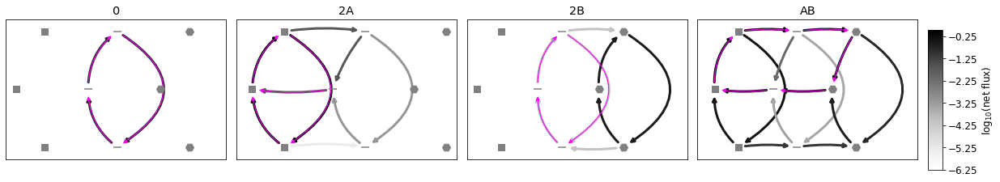

5088
[ 2.01798032  3.1925559  95.45766326  1.03352914]
[2.01798032 3.1925559  6.61003406 1.03352914]
[ 2.24316411  3.1925559  95.45766326  1.03352914]
2.0179803245375862,3.192555895103276,95.45766326383846,1.0335291370982471,2.0179803245375862,3.192555895103276,6.610034059200047,1.0335291370982471,2.2431641105774363,3.192555895103276,95.45766326383846,1.0335291370982471,2268.5038737704235,134.3058800600024,2268.5038737704235,134.3058800600024,2268.5038737704235,134.3058800600024,2268.5038737704235,134.3058800600024,2268.5038737704235,134.3058800600024,2268.5038737704235,134.3058800600024
*****negative SAB
[-1.781716522381508, 1.0250895520767938, [0.021032571803745157, 0.16264767757932092, 0.023244223679854317, 0.047303987304260754]]
0 0 0.021032571803745154
2 0 0.16264767757932094
0 2 0.02324422367985432
1 1 0.047303987304260754


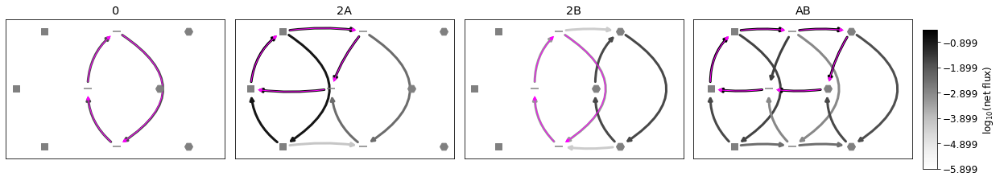

1827
[1.69765557e+00 4.83905924e+03 2.88397300e+02 2.96180239e+00]
[1.69765557e+00 4.83905924e+03 4.69161300e+00 2.96180239e+00]
[3.26687205e+00 4.83905924e+03 2.88397300e+02 2.96180239e+00]
1.6976555673844929,4839.059240226813,288.3972999383912,2.961802394229758,1.6976555673844929,4839.059240226813,4.691613001101583,2.961802394229758,3.266872054005145,4839.059240226813,288.3972999383912,2.961802394229758,488.1399842943323,175.68725126186106,488.1399842943323,175.68725126186106,488.1399842943323,175.68725126186106,488.1399842943323,175.68725126186106,488.1399842943323,175.68725126186106,488.1399842943323,175.68725126186106
*****negative SAB
[-1.0795284184021174, 0.7893386570814036, [0.01715743575515551, 0.11124494890485417, 0.030457570157531755, 0.05263927095927966]]
0 0 0.017157435755155513
2 0 0.11124494890485419
0 2 0.03045757015753175
1 1 0.05263927095927966


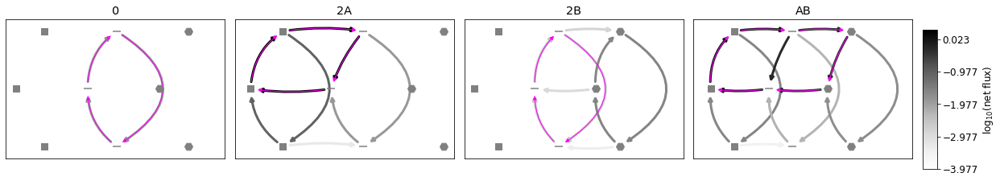

5062
[  10.08073289 2426.85896732  975.19945694   48.67316478]
[1.00807329e+01 2.42685897e+03 2.26447930e+00 4.86731648e+01]
[  15.94356267 2426.85896732  975.19945694   48.67316478]
10.080732886592358,2426.858967315337,975.1994569384912,48.67316478050954,10.080732886592358,2426.858967315337,2.2644792972912686,48.67316478050954,15.94356267196771,2426.858967315337,975.1994569384912,48.67316478050954,4110.235698788693,1033.7371016595516,4110.235698788693,1033.7371016595516,4110.235698788693,1033.7371016595516,4110.235698788693,1033.7371016595516,4110.235698788693,1033.7371016595516,4110.235698788693,1033.7371016595516
*****negative SAB
[-1.2991211839594219, 0.7936795771790212, [0.4744558789349673, 3.053756146378917, 0.7158772317657086, 1.2409660767726918]]
0 0 0.4744558789349673
2 0 3.053756146378917
0 2 0.7158772317657086
1 1 1.2409660767726916


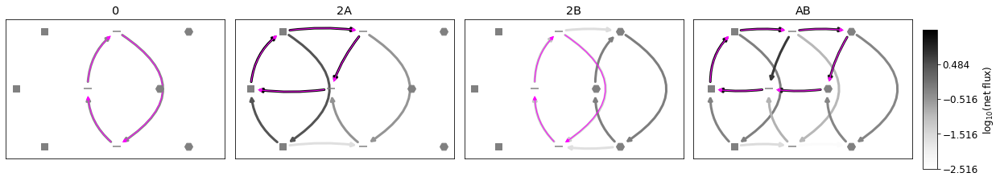

3575
[   1.71964975    3.38519509 1307.21052235    4.30938318]
[ 1.71964975  3.38519509 60.2130769   4.30938318]
[   8.58377467    3.38519509 1307.21052235    4.30938318]
1.719649751094115,3.3851950861033697,1307.2105223460048,4.3093831801172575,1.719649751094115,3.3851950861033697,60.21307690464047,4.3093831801172575,8.583774674234503,3.3851950861033697,1307.2105223460048,4.3093831801172575,4127.357381667568,977.8471094813688,4127.357381667568,977.8471094813688,4127.357381667568,977.8471094813688,4127.357381667568,977.8471094813688,4127.357381667568,977.8471094813688,4127.357381667568,977.8471094813688
*****negative SAB
[-0.46509679397773895, 0.17771260696943147, [0.00563362331991397, 0.03976423757700975, 0.025467584084192984, 0.02880610729672767]]
0 0 0.00563362331991397
2 0 0.03976423757700975
0 2 0.025467584084192984
1 1 0.02880610729672767


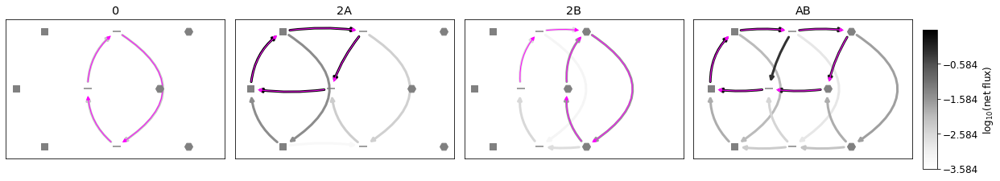

4956
[ 39.86037303 370.42665841 937.07798346   1.51458361]
[ 39.86037303 370.42665841   3.80231203   1.51458361]
[ 92.86381671 370.42665841 937.07798346   1.51458361]
39.86037302774885,370.4266584137233,937.0779834576804,1.5145836069627046,39.86037302774885,370.4266584137233,3.802312032117647,1.5145836069627046,92.86381670980852,370.4266584137233,937.0779834576804,1.5145836069627046,5930.443060431771,2542.204207251649,5930.443060431771,2542.204207251649,5930.443060431771,2542.204207251649,5930.443060431771,2542.204207251649,5930.443060431771,2542.204207251649,5930.443060431771,2542.204207251649
*****negative SAB
[-0.89483159323937, 0.38001912903236845, [0.061691074466053264, 0.29924479810737603, 0.12366827477295844, 0.16093683603750325]]
0 0 0.06169107446605325
2 0 0.29924479810737603
0 2 0.12366827477295844
1 1 0.16093683603750325


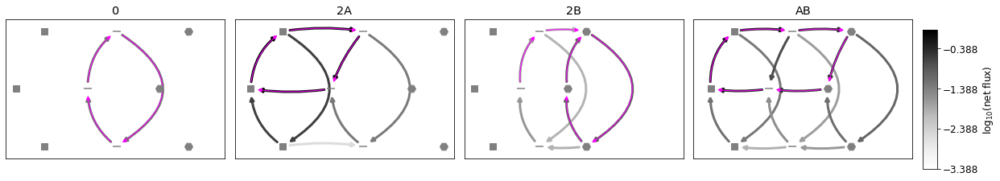

4118
[   3.98882693  346.86623603 2005.42645385   10.60761253]
[  3.98882693 346.86623603   2.77387653  10.60761253]
[   4.02602328  346.86623603 2005.42645385   10.60761253]
3.9888269321923584,346.86623603336807,2005.4264538458392,10.607612533315448,3.9888269321923584,346.86623603336807,2.7738765290971634,10.607612533315448,4.026023284794242,346.86623603336807,2005.4264538458392,10.607612533315448,8192.55412963469,3033.929950743636,8192.55412963469,3033.929950743636,8192.55412963469,3033.929950743636,8192.55412963469,3033.929950743636,8192.55412963469,3033.929950743636,8192.55412963469,3033.929950743636
*****negative SAB
[-1.6435052151447116, 1.0711316730363623, [0.020944998077347392, 0.13856841663174105, 0.021109460000687745, 0.04435268200054108]]
0 0 0.02094499807734739
2 0 0.13856841663174105
0 2 0.02110946000068774
1 1 0.04435268200054108


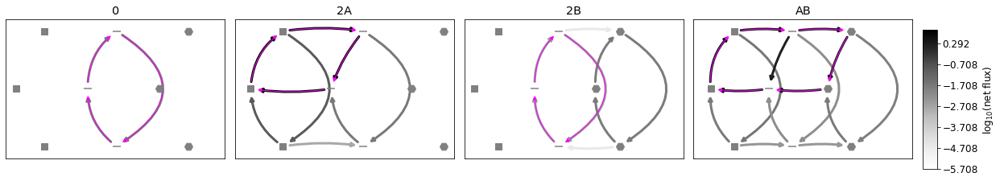

5894
[  2.52455882  14.65181965 361.17459981  11.80717091]
[ 2.52455882 14.65181965  8.50805383 11.80717091]
[  2.53367978  14.65181965 361.17459981  11.80717091]
2.524558816092017,14.651819650724407,361.174599808894,11.807170908573248,2.524558816092017,14.651819650724407,8.508053833981206,11.807170908573248,2.5336797773570643,14.651819650724407,361.174599808894,11.807170908573248,7613.903571174564,889.9046384831066,7613.903571174564,889.9046384831066,7613.903571174564,889.9046384831066,7613.903571174564,889.9046384831066,7613.903571174564,889.9046384831066,7613.903571174564,889.9046384831066
*****negative SAB
[-2.06240966836814, 1.0353623476335403, [0.07895279584294311, 0.6781906727302671, 0.07921902920573004, 0.1623695694328246]]
0 0 0.07895279584294312
2 0 0.6781906727302671
0 2 0.07921902920573004
1 1 0.1623695694328246


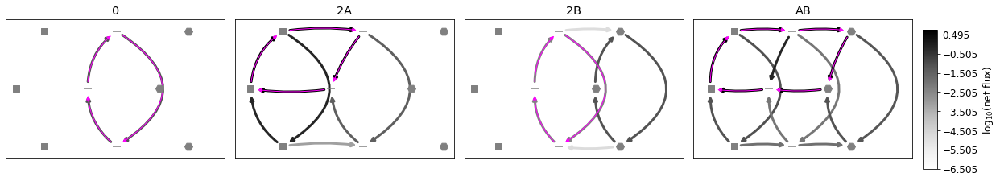

1565
[ 1.44461074  1.0580959  12.6190596   3.62719846]
[1.44461074 1.0580959  2.17221351 3.62719846]
[ 1.83248768  1.0580959  12.6190596   3.62719846]
1.444610740511289,1.058095903915292,12.61905959568922,3.627198464149328,1.444610740511289,1.058095903915292,2.172213511228486,3.627198464149328,1.8324876809482389,1.058095903915292,12.61905959568922,3.627198464149328,2611.808373111136,49.587462225497,2611.808373111136,49.587462225497,2611.808373111136,49.587462225497,2611.808373111136,49.587462225497,2611.808373111136,49.587462225497,2611.808373111136,49.587462225497
*****negative SAB
[-0.3681532507509544, 0.27720648382298085, [0.23141265337415715, 0.42620629692201883, 0.2724879011475835, 0.33021339809322864]]
0 0 0.23141265337415712
2 0 0.42620629692201883
0 2 0.27248790114758353
1 1 0.33021339809322864


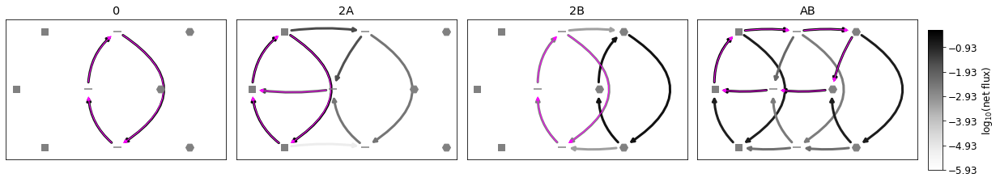

5858
[   8.24161725  120.52019344 1298.98214396    8.31152347]
[  8.24161725 120.52019344  29.08844782   8.31152347]
[  17.08421942  120.52019344 1298.98214396    8.31152347]
8.241617248752917,120.5201934374823,1298.9821439560617,8.31152347422071,8.241617248752917,120.5201934374823,29.08844782016997,8.31152347422071,17.084219419103224,120.5201934374823,1298.9821439560617,8.31152347422071,8744.386522566852,1820.304480142604,8744.386522566852,1820.304480142604,8744.386522566852,1820.304480142604,8744.386522566852,1820.304480142604,8744.386522566852,1820.304480142604,8744.386522566852,1820.304480142604
*****negative SAB
[-1.4545186413583577, 0.6226385735820242, [0.052047872400672074, 0.4302514429710793, 0.10196138077810257, 0.15698877304963565]]
0 0 0.052047872400672074
2 0 0.4302514429710793
0 2 0.10196138077810256
1 1 0.15698877304963565


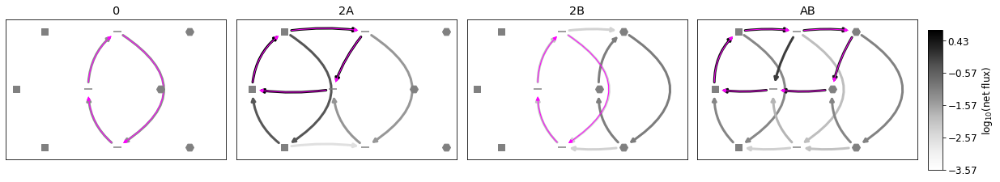

5713
[  1.22147234 139.75528674 555.88440943  20.852351  ]
[  1.22147234 139.75528674  21.9155197   20.852351  ]
[  1.61166247 139.75528674 555.88440943  20.852351  ]
1.2214723436446293,139.75528673649222,555.8844094298144,20.852350996361025,1.2214723436446293,139.75528673649222,21.915519698522825,20.852350996361025,1.611662468802358,139.75528673649222,555.8844094298144,20.852350996361025,1809.452098128296,110.1486010996792,1809.452098128296,110.1486010996792,1809.452098128296,110.1486010996792,1809.452098128296,110.1486010996792,1809.452098128296,110.1486010996792,1809.452098128296,110.1486010996792
*****negative SAB
[-1.3240502971887478, 1.603779230856349, [0.044056022278032535, 0.43885019109798834, 0.057670243041374136, 0.1752820470696697]]
0 0 0.044056022278032535
2 0 0.4388501910979883
0 2 0.05767024304137413
1 1 0.17528204706966977


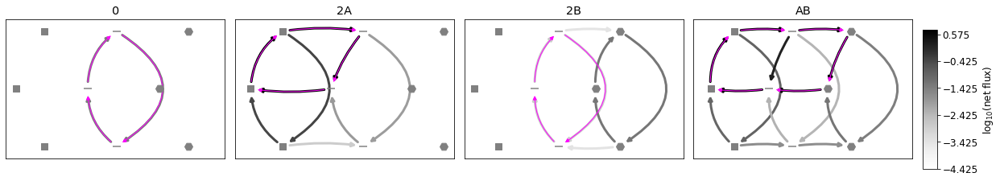

4881
[  29.05486683 1595.03463436  412.35336462    1.74441886]
[  29.05486683 1595.03463436   22.5508613     1.74441886]
[  54.30865345 1595.03463436  412.35336462    1.74441886]
29.05486683201277,1595.034634359767,412.3533646243108,1.744418856063476,29.05486683201277,1595.034634359767,22.55086130277016,1.744418856063476,54.30865344987346,1595.034634359767,412.3533646243108,1.744418856063476,7690.755069216355,167.2365882237855,7690.755069216355,167.2365882237855,7690.755069216355,167.2365882237855,7690.755069216355,167.2365882237855,7690.755069216355,167.2365882237855,7690.755069216355,167.2365882237855
*****negative SAB
[-1.2179272142254463, 0.9130547217238717, [0.11436290300462068, 0.8818667536330628, 0.2013323149157213, 0.3791144570364922]]
0 0 0.11436290300462068
2 0 0.8818667536330628
0 2 0.2013323149157213
1 1 0.3791144570364922


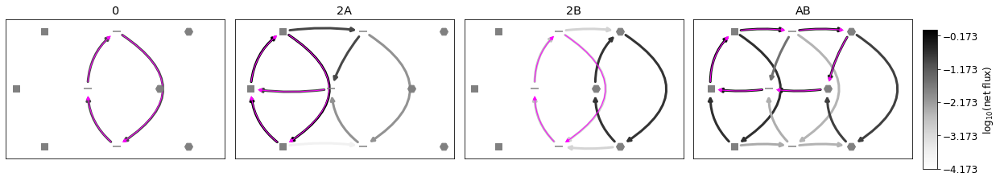

1141
[  1.90052392 653.09658498 437.40584448  20.01723602]
[  1.90052392 653.09658498   1.17119895  20.01723602]
[  1.90481873 653.09658498 437.40584448  20.01723602]
1.9005239205631643,653.0965849768745,437.405844484493,20.01723601578489,1.9005239205631643,653.0965849768745,1.1711989496749098,20.01723601578489,1.90481873481264,653.0965849768745,437.405844484493,20.01723601578489,7539.587096820857,893.8414396106352,7539.587096820857,893.8414396106352,7539.587096820857,893.8414396106352,7539.587096820857,893.8414396106352,7539.587096820857,893.8414396106352,7539.587096820857,893.8414396106352
*****negative SAB
[-2.1851740026947826, 1.10238547477915, [0.08281397155727271, 0.810362231927234, 0.08298988765385998, 0.1781871047696764]]
0 0 0.08281397155727271
2 0 0.810362231927234
0 2 0.08298988765385998
1 1 0.17818710476967636


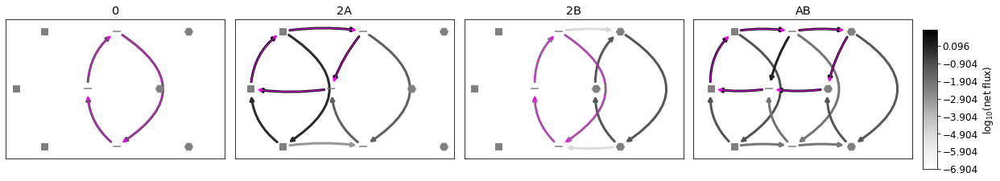

5155
[3.30514135e+00 1.85038007e+00 3.71523135e+03 1.21199879e+00]
[3.30514135 1.85038007 6.94692096 1.21199879]
[3.44143448e+00 1.85038007e+00 3.71523135e+03 1.21199879e+00]
3.305141346482766,1.8503800735624096,3715.2313479513314,1.2119987942249917,3.305141346482766,1.8503800735624096,6.946920955953649,1.2119987942249917,3.441434476958059,1.8503800735624096,3715.2313479513314,1.2119987942249917,9033.324539393268,4557.9716366367,9033.324539393268,4557.9716366367,9033.324539393268,4557.9716366367,9033.324539393268,4557.9716366367,9033.324539393268,4557.9716366367,9033.324539393268,4557.9716366367
*****negative SAB
[-1.3821208169427146, 1.0358376417021704, [0.0010762817250620433, 0.005940916977725433, 0.001111668907560381, 0.002279258902482381]]
0 0 0.0010762817250620433
2 0 0.005940916977725433
0 2 0.0011116689075603811
1 1 0.002279258902482381


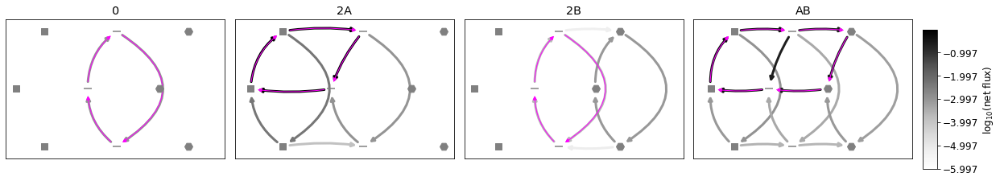

6179
[  4.92524911 122.78951195 519.3467709   34.65254811]
[  4.92524911 122.78951195   4.7738865   34.65254811]
[  5.58531239 122.78951195 519.3467709   34.65254811]
4.925249111921495,122.78951194520091,519.3467708950196,34.65254810997595,4.925249111921495,122.78951194520091,4.773886501113464,34.65254810997595,5.5853123881315705,122.78951194520091,519.3467708950196,34.65254810997595,6320.978882991887,419.70742001866887,6320.978882991887,419.70742001866887,6320.978882991887,419.70742001866887,6320.978882991887,419.70742001866887,6320.978882991887,419.70742001866887,6320.978882991887,419.70742001866887
*****negative SAB
[-1.791634216409414, 1.218094785755685, [0.30460111853979743, 2.76746805067847, 0.3436085068975928, 0.7993683987995728]]
0 0 0.3046011185397974
2 0 2.7674680506784695
0 2 0.34360850689759276
1 1 0.7993683987995728


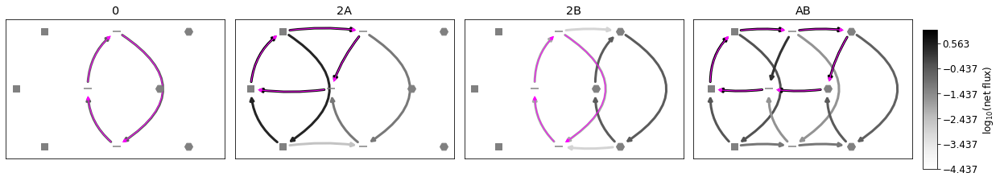

4650
[   2.12446431  828.86533358 1569.09485832   28.9757664 ]
[  2.12446431 828.86533358   7.52248121  28.9757664 ]
[   6.45569044  828.86533358 1569.09485832   28.9757664 ]
2.124464309375228,828.865333576096,1569.094858317415,28.975766400020365,2.124464309375228,828.865333576096,7.522481208007624,28.975766400020365,6.455690441812771,828.865333576096,1569.094858317415,28.975766400020365,3345.5704578983764,939.5556248814912,3345.5704578983764,939.5556248814912,3345.5704578983764,939.5556248814912,3345.5704578983764,939.5556248814912,3345.5704578983764,939.5556248814912,3345.5704578983764,939.5556248814912
*****negative SAB
[-0.9762800155919452, 0.5352439945391609, [0.03846726258433201, 0.3049801970220086, 0.10696891098823116, 0.15501797942123646]]
0 0 0.03846726258433201
2 0 0.3049801970220086
0 2 0.10696891098823116
1 1 0.1550179794212365


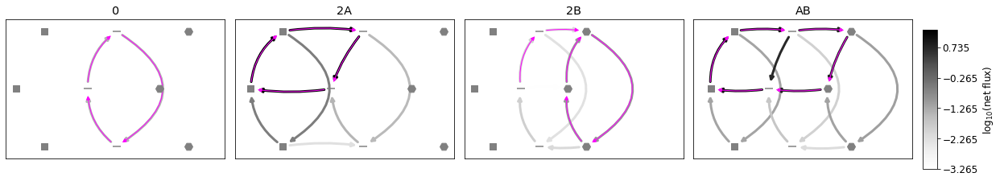

5306
[7.48635626e+00 9.76148389e+03 1.76851426e+02 1.24563722e+00]
[7.48635626e+00 9.76148389e+03 1.95883044e+00 1.24563722e+00]
[3.23742461e+01 9.76148389e+03 1.76851426e+02 1.24563722e+00]
7.486356261073079,9761.483885591791,176.85142611508334,1.2456372234688138,7.486356261073079,9761.483885591791,1.958830436854468,1.2456372234688138,32.37424613815726,9761.483885591791,176.85142611508334,1.2456372234688138,5466.855517271255,532.536907942025,5466.855517271255,532.536907942025,5466.855517271255,532.536907942025,5466.855517271255,532.536907942025,5466.855517271255,532.536907942025,5466.855517271255,532.536907942025
*****negative SAB
[-1.1819571584074173, 0.24281669940764602, [0.05024821745511873, 0.4987281983693493, 0.18576515570592741, 0.21981603298217373]]
0 0 0.050248217455118725
2 0 0.49872819836934934
0 2 0.1857651557059274
1 1 0.21981603298217375


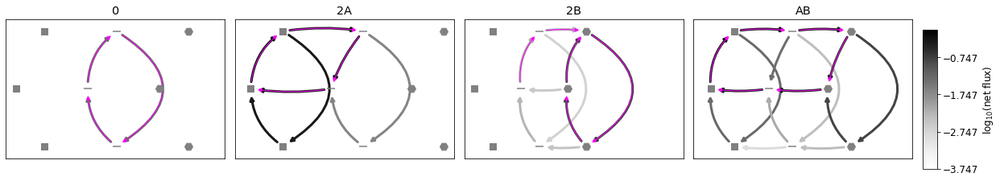

4618
[  63.08446417 2674.66489932 1269.83251261   18.37914723]
[  63.08446417 2674.66489932    4.10095062   18.37914723]
[ 100.51463907 2674.66489932 1269.83251261   18.37914723]
63.08446417342952,2674.6648993232902,1269.8325126149912,18.379147233482936,63.08446417342952,2674.6648993232902,4.100950616907445,18.379147233482936,100.51463907187237,2674.6648993232902,1269.8325126149912,18.379147233482936,2802.2301675598337,455.7501677407507,2802.2301675598337,455.7501677407507,2802.2301675598337,455.7501677407507,2802.2301675598337,455.7501677407507,2802.2301675598337,455.7501677407507,2802.2301675598337,455.7501677407507
*****negative SAB
[-1.2548074775112787, 1.176956694597344, [0.8577445102549681, 6.986386185443049, 1.2948475226370306, 2.927641527826765]]
0 0 0.8577445102549682
2 0 6.98638618544305
0 2 1.2948475226370308
1 1 2.9276415278267645


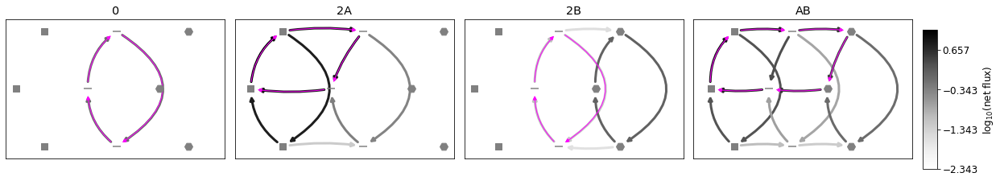

5656
[  3.49632803  10.51274387 282.76233954   2.72121074]
[ 3.49632803 10.51274387 34.45215446  2.72121074]
[  4.07530557  10.51274387 282.76233954   2.72121074]
3.4963280335666025,10.512743870074743,282.7623395429141,2.721210738926658,3.4963280335666025,10.512743870074743,34.452154464871434,2.721210738926658,4.075305572128306,10.512743870074743,282.7623395429141,2.721210738926658,8488.448583986736,1374.0809906089737,8488.448583986736,1374.0809906089737,8488.448583986736,1374.0809906089737,8488.448583986736,1374.0809906089737,8488.448583986736,1374.0809906089737,8488.448583986736,1374.0809906089737
*****negative SAB
[-1.3712790783955582, 0.7003657425415653, [0.03282076935018699, 0.15873407001965098, 0.03776095074734806, 0.061358398671861394]]
0 0 0.03282076935018699
2 0 0.15873407001965098
0 2 0.03776095074734807
1 1 0.061358398671861394


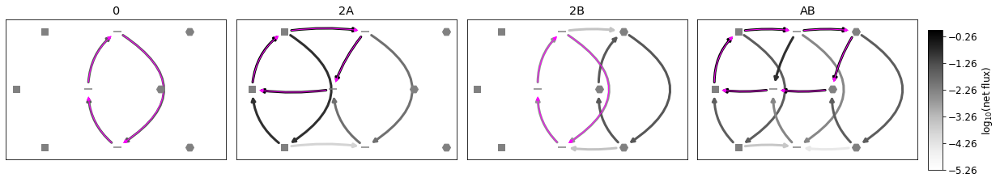

4446
[  54.72625279    9.42509575 1873.64271371   27.13381258]
[54.72625279  9.42509575 11.7682605  27.13381258]
[ 108.40091296    9.42509575 1873.64271371   27.13381258]
54.72625278793205,9.42509574730962,1873.6427137052417,27.133812579523195,54.72625278793205,9.42509574730962,11.76826050271164,27.133812579523195,108.40091296042183,9.42509574730962,1873.6427137052417,27.133812579523195,7370.50475895715,477.89648603307614,7370.50475895715,477.89648603307614,7370.50475895715,477.89648603307614,7370.50475895715,477.89648603307614,7370.50475895715,477.89648603307614,7370.50475895715,477.89648603307614
*****negative SAB
[-0.9297185442505149, 1.038012506675175, [0.7027421656098878, 4.892938595087807, 1.250903177787432, 2.5686006977017963]]
0 0 0.7027421656098879
2 0 4.892938595087806
0 2 1.2509031777874318
1 1 2.5686006977017963


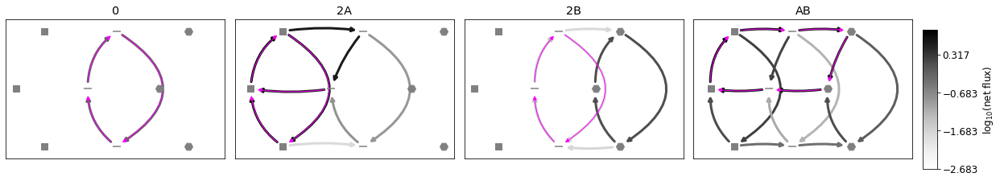

4019
[1.60280815e+00 9.80325200e+03 1.01346937e+03 4.14674043e+01]
[1.60280815e+00 9.80325200e+03 6.05297560e+00 4.14674043e+01]
[2.79684197e+00 9.80325200e+03 1.01346937e+03 4.14674043e+01]
1.6028081499302558,9803.252004631797,1013.469373879535,41.46740431508241,1.6028081499302558,9803.252004631797,6.052975600151594,41.46740431508241,2.796841966152739,9803.252004631797,1013.469373879535,41.46740431508241,4561.725901386824,1277.3490849256905,4561.725901386824,1277.3490849256905,4561.725901386824,1277.3490849256905,4561.725901386824,1277.3490849256905,4561.725901386824,1277.3490849256905,4561.725901386824,1277.3490849256905
*****negative SAB
[-1.27606678891523, 0.6944621084187622, [0.06290712430717348, 0.40724039280920277, 0.10391124355446135, 0.1681575873806373]]
0 0 0.06290712430717348
2 0 0.4072403928092027
0 2 0.10391124355446134
1 1 0.16815758738063735


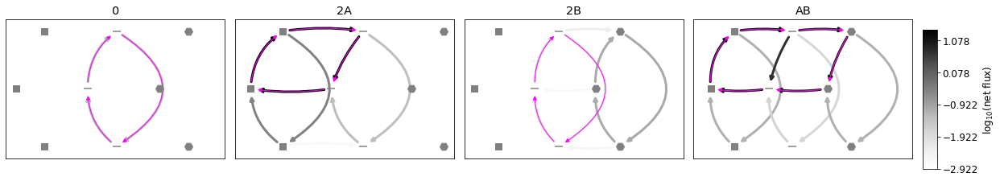

2464
[2.67021818e+00 9.76131579e+03 6.23711756e+02 7.49950048e+00]
[2.67021818e+00 9.76131579e+03 2.55434143e+01 7.49950048e+00]
[5.92967828e+00 9.76131579e+03 6.23711756e+02 7.49950048e+00]
2.6702181819454545,9761.315786303196,623.7117562078431,7.499500479993599,2.6702181819454545,9761.315786303196,25.543414256579563,7.499500479993599,5.929678276615891,9761.315786303196,623.7117562078431,7.499500479993599,6144.225691747674,3193.99637224468,6144.225691747674,3193.99637224468,6144.225691747674,3193.99637224468,6144.225691747674,3193.99637224468,6144.225691747674,3193.99637224468,6144.225691747674,3193.99637224468
*****negative SAB
[-0.7447155199362439, 0.31158283803605114, [0.03159145443010726, 0.12881921099790783, 0.06194455604376501, 0.07687744213988246]]
0 0 0.03159145443010726
2 0 0.12881921099790783
0 2 0.061944556043765
1 1 0.07687744213988247


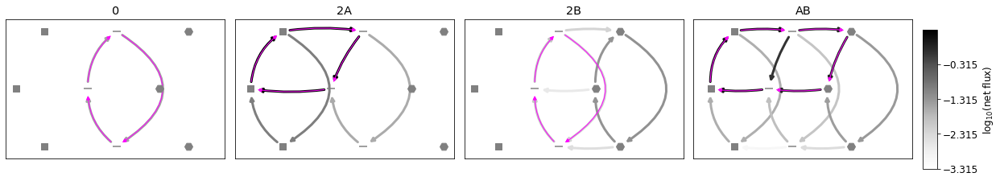

4589
[2.23232284e+00 6.20743154e+03 1.10851999e+02 7.83018147e+00]
[2.23232284e+00 6.20743154e+03 1.49061127e+00 7.83018147e+00]
[   6.59409293 6207.43154299  110.85199919    7.83018147]
2.232322840117906,6207.431542990948,110.85199919489683,7.830181466270933,2.232322840117906,6207.431542990948,1.4906112716331783,7.830181466270933,6.594092932021499,6207.431542990948,110.85199919489683,7.830181466270933,7455.769275542802,90.60825211269822,7455.769275542802,90.60825211269822,7455.769275542802,90.60825211269822,7455.769275542802,90.60825211269822,7455.769275542802,90.60825211269822,7455.769275542802,90.60825211269822
*****negative SAB
[-1.2910416718142856, 0.5106767413736393, [0.14455739687489524, 1.4313735370593668, 0.4105647863318206, 0.584939184013721]]
0 0 0.14455739687489524
2 0 1.431373537059367
0 2 0.41056478633182064
1 1 0.5849391840137209


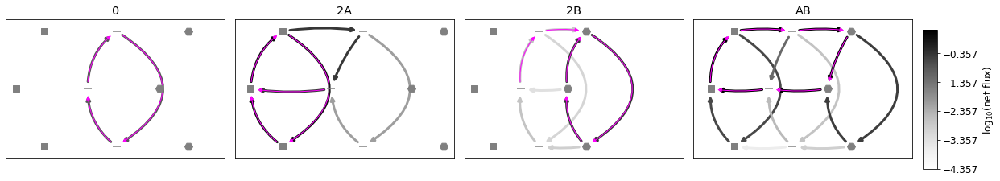

3220
[ 15.58657616 311.66052217 184.32008803  29.33241294]
[ 15.58657616 311.66052217   6.21097614  29.33241294]
[ 29.97824842 311.66052217 184.32008803  29.33241294]
15.586576164599183,311.66052217286546,184.32008803098563,29.332412939371345,15.586576164599183,311.66052217286546,6.210976144635303,29.332412939371345,29.97824841836105,311.66052217286546,184.32008803098563,29.332412939371345,5623.357802140682,136.59754362349776,5623.357802140682,136.59754362349776,5623.357802140682,136.59754362349776,5623.357802140682,136.59754362349776,5623.357802140682,136.59754362349776,5623.357802140682,136.59754362349776
*****negative SAB
[-0.7292924556676005, 0.5059805332811339, [1.9817075635338868, 8.357894548370608, 3.550116988973684, 5.041479233074339]]
0 0 1.9817075635338868
2 0 8.357894548370608
0 2 3.5501169889736834
1 1 5.041479233074339


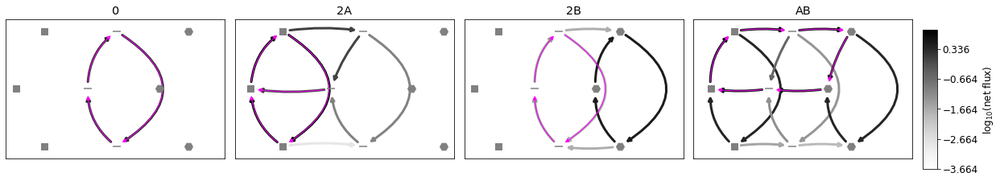

2767
[1.23404660e+00 2.05291635e+03 3.21835079e+03 3.01053621e+00]
[1.23404660e+00 2.05291635e+03 2.39098024e+02 3.01053621e+00]
[3.86956602e+00 2.05291635e+03 3.21835079e+03 3.01053621e+00]
1.234046596069985,2052.916346604252,3218.350788575483,3.010536208445365,1.234046596069985,2052.916346604252,239.0980241274688,3.010536208445365,3.869566020458693,2052.916346604252,3218.350788575483,3.010536208445365,3888.4892403341146,352.3866072090877,3888.4892403341146,352.3866072090877,3888.4892403341146,352.3866072090877,3888.4892403341146,352.3866072090877,3888.4892403341146,352.3866072090877,3888.4892403341146,352.3866072090877
*****negative SAB
[-0.781055837565783, 0.8604746548826069, [0.0011528409390416051, 0.010936843297824683, 0.003505436243354764, 0.0063645947206464205]]
0 0 0.0011528409390416054
2 0 0.010936843297824685
0 2 0.0035054362433547645
1 1 0.0063645947206464205


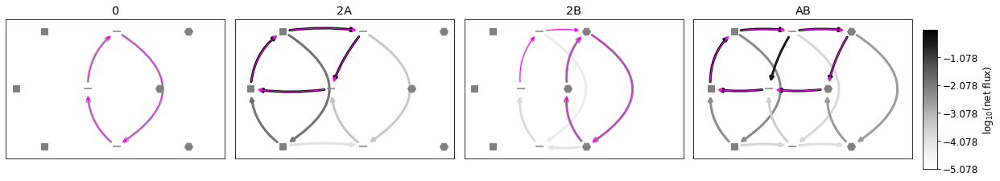

4174
[ 20.49183701 663.35054684 881.80710803 113.11254354]
[ 20.49183701 663.35054684  48.42902154 113.11254354]
[ 20.52683457 663.35054684 881.80710803 113.11254354]
20.49183700818545,663.3505468434807,881.8071080334281,113.11254354292343,20.49183700818545,663.3505468434807,48.42902154207312,113.11254354292343,20.5268345708229,663.3505468434807,881.8071080334281,113.11254354292343,4344.317826042728,222.25671391787597,4344.317826042728,222.25671391787597,4344.317826042728,222.25671391787597,4344.317826042728,222.25671391787597,4344.317826042728,222.25671391787597,4344.317826042728,222.25671391787597
*****negative SAB
[-0.9883302261514232, 1.3254069782019062, [2.274875699487509, 11.328373711028986, 2.2785746789667827, 5.71018953544701]]
0 0 2.274875699487509
2 0 11.328373711028984
0 2 2.2785746789667822
1 1 5.71018953544701


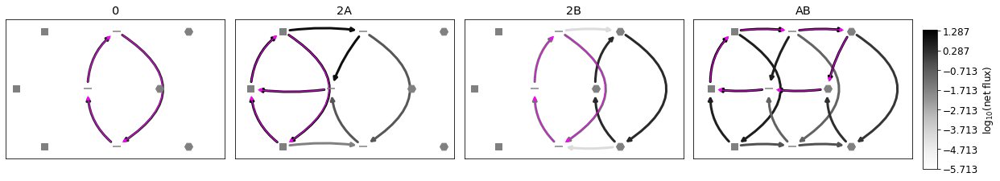

5903
[4.73913174e+01 1.49966285e+02 6.40260360e+03 5.21613591e+00]
[ 47.39131738 149.9662848   64.01623175   5.21613591]
[5.77027437e+01 1.49966285e+02 6.40260360e+03 5.21613591e+00]
47.39131738265274,149.9662847954934,6402.603600821305,5.216135907609804,47.39131738265274,149.9662847954934,64.01623174960406,5.216135907609804,57.702743722838505,149.9662847954934,6402.603600821305,5.216135907609804,9282.57731420431,2197.112316655621,9282.57731420431,2197.112316655621,9282.57731420431,2197.112316655621,9282.57731420431,2197.112316655621,9282.57731420431,2197.112316655621,9282.57731420431,2197.112316655621
*****negative SAB
[-1.4955155132477933, 1.571765757885599, [0.038284797014565886, 0.382765088449275, 0.04566554568665182, 0.13574920377647498]]
0 0 0.038284797014565886
2 0 0.38276508844927504
0 2 0.045665545686651814
1 1 0.13574920377647498


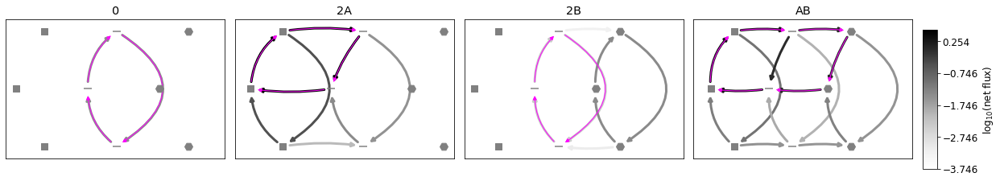

6008
[   2.58342555    1.90774621 1090.14160931   15.25337206]
[ 2.58342555  1.90774621  6.66625988 15.25337206]
[   3.66738618    1.90774621 1090.14160931   15.25337206]
2.583425545783694,1.9077462137915275,1090.1416093130815,15.253372060124448,2.583425545783694,1.9077462137915275,6.666259883845648,15.253372060124448,3.667386176169228,1.9077462137915275,1090.1416093130815,15.253372060124448,7423.598065671692,1508.550593091221,7423.598065671692,1508.550593091221,7423.598065671692,1508.550593091221,7423.598065671692,1508.550593091221,7423.598065671692,1508.550593091221,7423.598065671692,1508.550593091221
*****negative SAB
[-1.6787101875530994, 0.8839238198345074, [0.03491472448524921, 0.28261931812681873, 0.04783790368737336, 0.08827947134544971]]
0 0 0.03491472448524921
2 0 0.28261931812681873
0 2 0.047837903687373354
1 1 0.0882794713454497


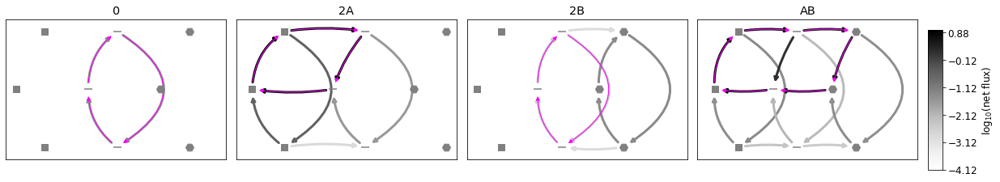

4248
[  1.90065914 513.07332399 198.29452429   1.84290776]
[  1.90065914 513.07332399  32.07102248   1.84290776]
[  2.81208241 513.07332399 198.29452429   1.84290776]
1.9006591445628636,513.0733239886522,198.29452428861973,1.8429077555414568,1.9006591445628636,513.0733239886522,32.07102247584081,1.8429077555414568,2.8120824144238457,513.0733239886522,198.29452428861973,1.8429077555414568,1583.9804557277962,30.61122079824036,1583.9804557277962,30.61122079824036,1583.9804557277962,30.61122079824036,1583.9804557277962,30.61122079824036,1583.9804557277962,30.61122079824036,1583.9804557277962,30.61122079824036
*****negative SAB
[-0.8431073201001031, 1.0387599957791418, [0.017336439391625283, 0.0938187630570272, 0.0254560604024298, 0.0522984851886044]]
0 0 0.017336439391625283
2 0 0.09381876305702722
0 2 0.0254560604024298
1 1 0.0522984851886044


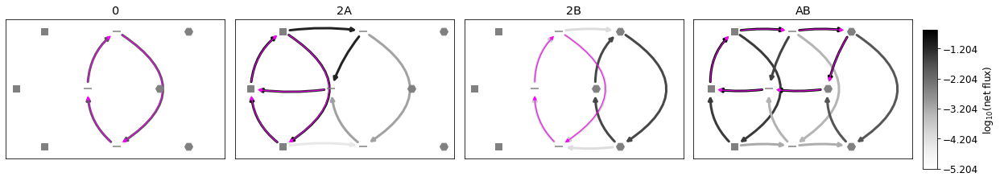

4628
[ 12.89737896 688.76393132 184.84813467   4.29016583]
[ 12.89737896 688.76393132  10.55070612   4.29016583]
[ 19.64858196 688.76393132 184.84813467   4.29016583]
12.897378957376487,688.7639313219003,184.8481346687137,4.290165829193119,12.897378957376487,688.7639313219003,10.550706123155052,4.290165829193119,19.648581961522737,688.7639313219003,184.8481346687137,4.290165829193119,2466.1687104653224,126.81782462767664,2466.1687104653224,126.81782462767664,2466.1687104653224,126.81782462767664,2466.1687104653224,126.81782462767664,2466.1687104653224,126.81782462767664,2466.1687104653224,126.81782462767664
*****negative SAB
[-1.238636347976877, 0.8699731366801386, [0.27376303961217135, 1.7266145331573204, 0.4003507883967609, 0.731692658706517]]
0 0 0.27376303961217135
2 0 1.7266145331573204
0 2 0.4003507883967609
1 1 0.731692658706517


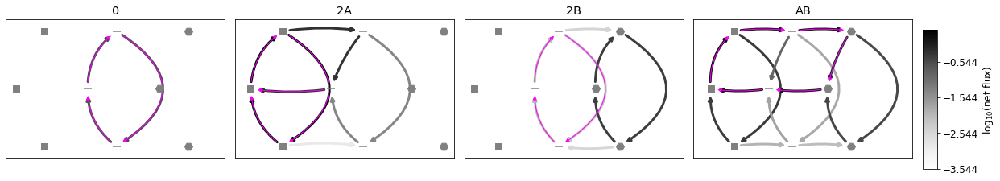

5714
[  1.72360751  36.39797713 283.8830306    3.64286056]
[ 1.72360751 36.39797713 23.42546133  3.64286056]
[  2.03186042  36.39797713 283.8830306    3.64286056]
1.7236075133974234,36.39797712802383,283.8830306000432,3.6428605627565176,1.7236075133974234,36.39797712802383,23.425461334505236,3.6428605627565176,2.0318604236976023,36.39797712802383,283.8830306000432,3.6428605627565176,4106.640774311332,821.8187397239318,4106.640774311332,821.8187397239318,4106.640774311332,821.8187397239318,4106.640774311332,821.8187397239318,4106.640774311332,821.8187397239318,4106.640774311332,821.8187397239318
*****negative SAB
[-1.478119208519887, 0.7812387408146875, [0.02169448673325518, 0.12062635513050368, 0.025194612988852023, 0.04329961016809044]]
0 0 0.021694486733255178
2 0 0.12062635513050368
0 2 0.025194612988852026
1 1 0.04329961016809044


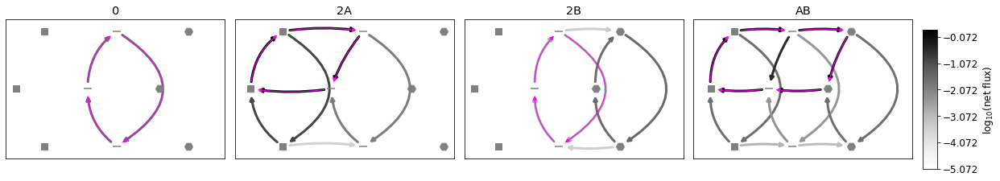

3888
[1.21012202e+00 5.50455343e+03 9.19439497e+01 6.12227796e+00]
[1.21012202e+00 5.50455343e+03 1.02135923e+00 6.12227796e+00]
[2.08397105e+00 5.50455343e+03 9.19439497e+01 6.12227796e+00]
1.210122024817146,5504.553431738409,91.94394965988282,6.122277962246232,1.210122024817146,5504.553431738409,1.0213592335335102,6.122277962246232,2.0839710535671774,5504.553431738409,91.94394965988282,6.122277962246232,5724.79070293694,1852.463113948814,5724.79070293694,1852.463113948814,5724.79070293694,1852.463113948814,5724.79070293694,1852.463113948814,5724.79070293694,1852.463113948814,5724.79070293694,1852.463113948814
*****negative SAB
[-1.1253936829003348, 0.43312966547393866, [0.07462606138928311, 0.3537537133957183, 0.12009881729533044, 0.16215253848758912]]
0 0 0.0746260613892831
2 0 0.3537537133957183
0 2 0.12009881729533042
1 1 0.16215253848758912


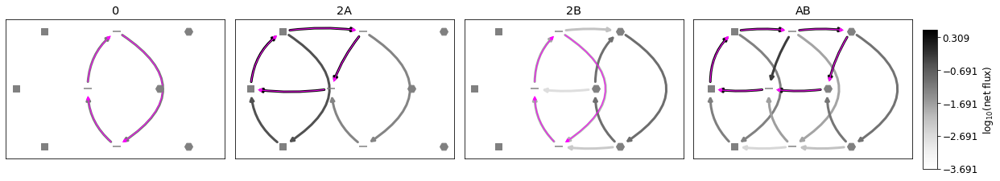

5034
[1.17846362e+00 4.97565255e+00 2.17057548e+03 1.16743333e+00]
[  1.17846362   4.97565255 243.56440762   1.16743333]
[1.21101017e+00 4.97565255e+00 2.17057548e+03 1.16743333e+00]
1.1784636235921742,4.975652548163662,2170.5754831891527,1.167433334174112,1.1784636235921742,4.975652548163662,243.56440762390076,1.167433334174112,1.2110101734003988,4.975652548163662,2170.5754831891527,1.167433334174112,5768.44953219841,193.044839119412,5768.44953219841,193.044839119412,5768.44953219841,193.044839119412,5768.44953219841,193.044839119412,5768.44953219841,193.044839119412,5768.44953219841,193.044839119412
*****negative SAB
[-1.056545501615645, 1.8946673472526803, [0.0006330660123572313, 0.005029029333621468, 0.0006502503246662258, 0.002417866293847494]]
0 0 0.0006330660123572313
2 0 0.005029029333621469
0 2 0.0006502503246662258
1 1 0.0024178662938474935


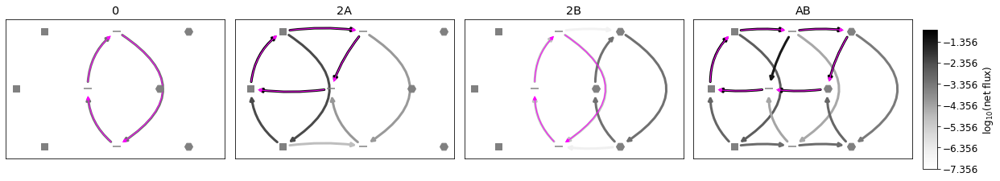

6213
[  14.86059245 3152.16894941 2405.77954273   19.38040721]
[  14.86059245 3152.16894941   26.39620012   19.38040721]
[  21.09217463 3152.16894941 2405.77954273   19.38040721]
14.860592449073192,3152.1689494129087,2405.7795427297933,19.380407211152363,14.860592449073192,3152.1689494129087,26.396200123996355,19.380407211152363,21.092174632229483,3152.1689494129087,2405.7795427297933,19.380407211152363,3503.403801538132,976.9682699187026,3503.403801538132,976.9682699187026,3503.403801538132,976.9682699187026,3503.403801538132,976.9682699187026,3503.403801538132,976.9682699187026,3503.403801538132,976.9682699187026
*****negative SAB
[-1.3405645910056911, 1.274089412389825, [0.11802914938019853, 0.9866996179131016, 0.16110005056117674, 0.38961422698819387]]
0 0 0.11802914938019853
2 0 0.9866996179131017
0 2 0.16110005056117677
1 1 0.38961422698819387


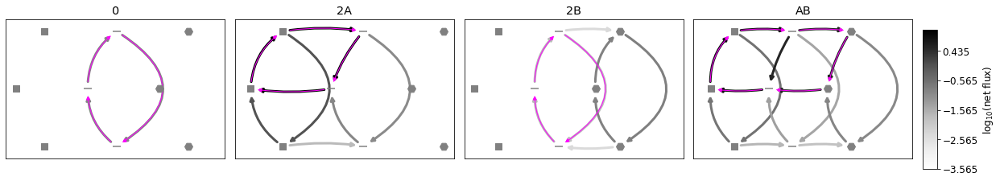

5870
[1.28812435e+00 2.69168485e+03 2.20805109e+02 1.53381476e+00]
[1.28812435e+00 2.69168485e+03 4.96831096e+00 1.53381476e+00]
[5.69512826e+00 2.69168485e+03 2.20805109e+02 1.53381476e+00]
1.2881243524418844,2691.684853954398,220.80510901017303,1.53381475694574,1.2881243524418844,2691.684853954398,4.968310955702985,1.53381475694574,5.69512826472202,2691.684853954398,220.80510901017303,1.53381475694574,8607.984922079178,1915.2721892519687,8607.984922079178,1915.2721892519687,8607.984922079178,1915.2721892519687,8607.984922079178,1915.2721892519687,8607.984922079178,1915.2721892519687,8607.984922079178,1915.2721892519687
*****negative SAB
[-0.7795562768665564, 0.15567469226668557, [0.00883496729106964, 0.06770463200363905, 0.03540672903117662, 0.039441058268157726]]
0 0 0.00883496729106964
2 0 0.06770463200363905
0 2 0.03540672903117662
1 1 0.03944105826815772


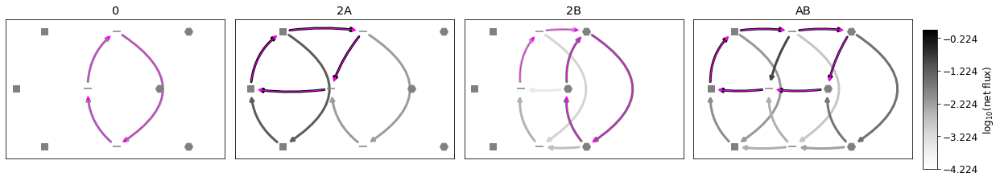

4356
[ 26.59204011  63.81020836 420.03584678  17.89044102]
[26.59204011 63.81020836  6.28717244 17.89044102]
[ 37.34526885  63.81020836 420.03584678  17.89044102]
26.59204010554177,63.81020836149641,420.03584677954495,17.89044102481136,26.59204010554177,63.81020836149641,6.287172444432283,17.89044102481136,37.34526884813302,63.81020836149641,420.03584677954495,17.89044102481136,3625.782406184657,179.54913709885722,3625.782406184657,179.54913709885722,3625.782406184657,179.54913709885722,3625.782406184657,179.54913709885722,3625.782406184657,179.54913709885722,3625.782406184657,179.54913709885722
*****negative SAB
[-1.243486396773185, 1.118421184766583, [1.0079864545885087, 7.0261567106255605, 1.3668246516026807, 2.9675027315630094]]
0 0 1.0079864545885087
2 0 7.0261567106255605
0 2 1.3668246516026807
1 1 2.967502731563009


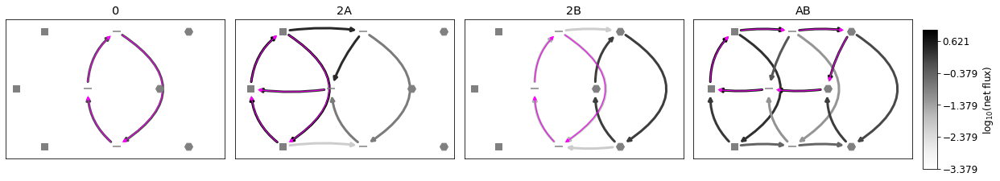

2371
[  26.58283387  939.26442559 1599.08205122    7.02339674]
[ 26.58283387 939.26442559 141.73989825   7.02339674]
[  46.34699527  939.26442559 1599.08205122    7.02339674]
26.582833868036097,939.2644255915084,1599.0820512184987,7.023396738568134,26.582833868036097,939.2644255915084,141.73989825377117,7.023396738568134,46.34699526942442,939.2644255915084,1599.0820512184987,7.023396738568134,4816.149150522134,234.74886180891065,4816.149150522134,234.74886180891065,4816.149150522134,234.74886180891065,4816.149150522134,234.74886180891065,4816.149150522134,234.74886180891065,4816.149150522134,234.74886180891065
*****negative SAB
[-0.998408099478573, 1.2187273038453366, [0.11433845835868066, 0.906695794098711, 0.19500122531613093, 0.45384840688747646]]
0 0 0.11433845835868067
2 0 0.9066957940987109
0 2 0.19500122531613096
1 1 0.4538484068874764


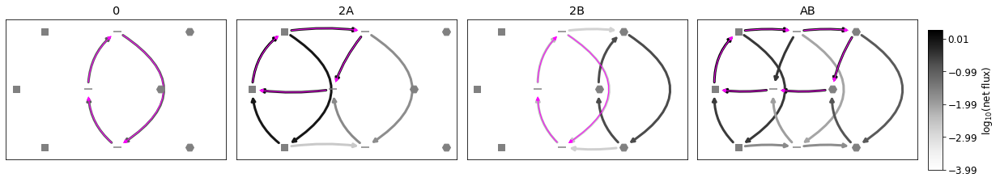

2266
[ 1.55097501  8.00040749 56.10591406  4.78022034]
[1.55097501 8.00040749 4.7101255  4.78022034]
[ 1.99957618  8.00040749 56.10591406  4.78022034]
1.5509750076760618,8.000407485647056,56.10591406498395,4.780220344482681,1.5509750076760618,8.000407485647056,4.710125499817694,4.780220344482681,1.9995761755510495,8.000407485647056,56.10591406498395,4.780220344482681,3903.221361703602,754.0580485656352,3903.221361703602,754.0580485656352,3903.221361703602,754.0580485656352,3903.221361703602,754.0580485656352,3903.221361703602,754.0580485656352,3903.221361703602,754.0580485656352
*****negative SAB
[-1.0876570024700636, 0.5331871302908774, [0.11700688441707553, 0.45013443677054676, 0.14635903485054, 0.21179946386736412]]
0 0 0.11700688441707555
2 0 0.45013443677054676
0 2 0.14635903485053997
1 1 0.2117994638673641


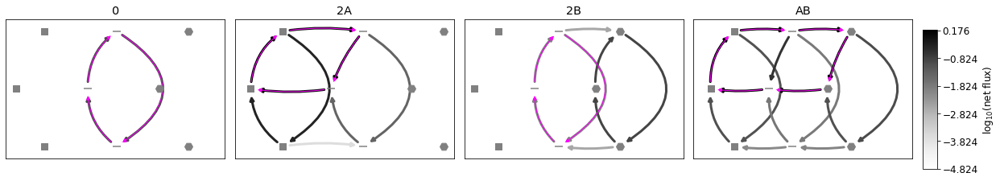

4990
[  2.58600427  16.39842213 269.79961579   3.88753627]
[ 2.58600427 16.39842213  3.21651571  3.88753627]
[  5.60578721  16.39842213 269.79961579   3.88753627]
2.5860042650501702,16.398422125851546,269.7996157948646,3.887536270216695,2.5860042650501702,16.398422125851546,3.2165157124687385,3.887536270216695,5.60578720774155,16.398422125851546,269.7996157948646,3.887536270216695,5261.362392501083,985.0396799023928,5261.362392501083,985.0396799023928,5261.362392501083,985.0396799023928,5261.362392501083,985.0396799023928,5261.362392501083,985.0396799023928,5261.362392501083,985.0396799023928
*****negative SAB
[-1.5624319319959459, 0.4913654328432588, [0.03630800253566201, 0.3079161364381617, 0.07416138587560973, 0.10425420265731561]]
0 0 0.036308002535662
2 0 0.30791613643816174
0 2 0.07416138587560975
1 1 0.10425420265731561


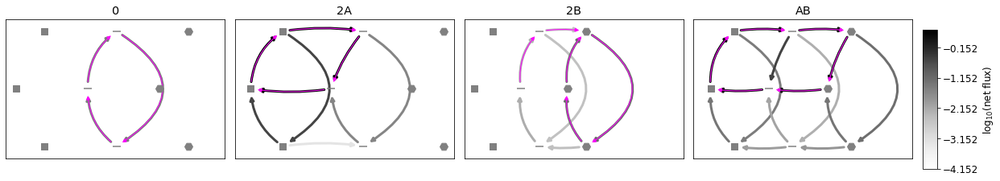

1034
[ 36.23994982 306.47646936 605.98200716   5.72356821]
[ 36.23994982 306.47646936  56.22935507   5.72356821]
[101.34015485 306.47646936 605.98200716   5.72356821]
36.239949822853134,306.476469361589,605.9820071618689,5.723568212100982,36.239949822853134,306.476469361589,56.22935507244599,5.723568212100982,101.34015484680155,306.476469361589,605.9820071618689,5.723568212100982,2991.0142614994343,2437.714248014114,2991.0142614994343,2437.714248014114,2991.0142614994343,2437.714248014114,2991.0142614994343,2437.714248014114,2991.0142614994343,2437.714248014114,2991.0142614994343,2437.714248014114
*****negative SAB
[-0.19206198494172544, 0.09326656913273307, [0.319788293231952, 0.8261923548289756, 0.6779360342430855, 0.7232105508940682]]
0 0 0.319788293231952
2 0 0.8261923548289755
0 2 0.6779360342430854
1 1 0.723210550894068


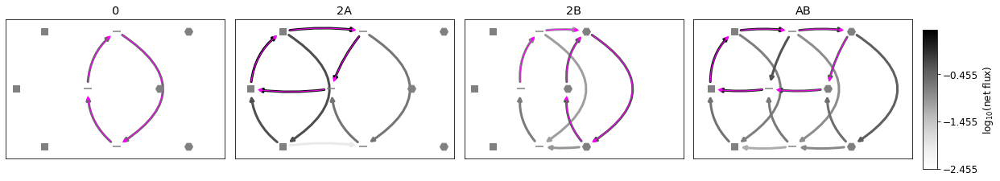

4984
[  81.54321761  624.94793538 2131.35899018    7.31089234]
[ 81.54321761 624.94793538  27.95272669   7.31089234]
[ 172.55165905  624.94793538 2131.35899018    7.31089234]
81.54321760506652,624.9479353757414,2131.3589901765395,7.310892341414715,81.54321760506652,624.9479353757414,27.95272669085848,7.310892341414715,172.55165904869327,624.9479353757414,2131.3589901765395,7.310892341414715,6865.041895755079,1094.6343347359796,6865.041895755079,1094.6343347359796,6865.041895755079,1094.6343347359796,6865.041895755079,1094.6343347359796,6865.041895755079,1094.6343347359796,6865.041895755079,1094.6343347359796
*****negative SAB
[-1.2952362827375503, 0.857149130784027, [0.2683966033365675, 2.3364012843595603, 0.5255509973651051, 0.9520120900516883]]
0 0 0.26839660333656756
2 0 2.3364012843595603
0 2 0.5255509973651051
1 1 0.9520120900516882


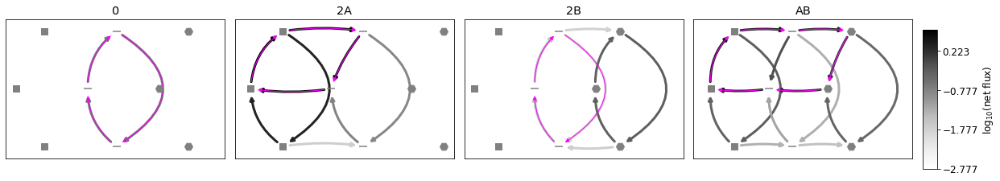

4781
[  6.24442138 145.15845408 587.88548159   1.33483613]
[  6.24442138 145.15845408  51.18309556   1.33483613]
[  7.76782036 145.15845408 587.88548159   1.33483613]
6.244421377133298,145.15845407906033,587.8854815863901,1.3348361294632285,6.244421377133298,145.15845407906033,51.1830955598523,1.3348361294632285,7.767820363845457,145.15845407906033,587.8854815863901,1.3348361294632285,4552.95322677334,23.957743579234197,4552.95322677334,23.957743579234197,4552.95322677334,23.957743579234197,4552.95322677334,23.957743579234197,4552.95322677334,23.957743579234197,4552.95322677334,23.957743579234197
*****negative SAB
[-0.9948432927422005, 2.002171372581794, [0.013996589560003714, 0.1385734777424861, 0.017357565180203142, 0.0695348375505304]]
0 0 0.013996589560003714
2 0 0.1385734777424861
0 2 0.017357565180203146
1 1 0.0695348375505304


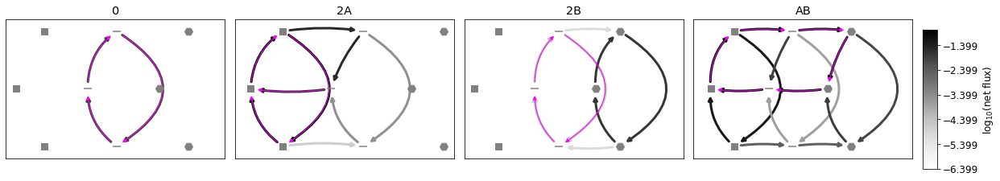

5256
[  5.65003246  85.77538494 247.81938559   3.96690445]
[ 5.65003246 85.77538494  7.48081816  3.96690445]
[ 14.41771207  85.77538494 247.81938559   3.96690445]
5.650032459763551,85.77538493660224,247.8193855896156,3.966904447974605,5.650032459763551,85.77538493660224,7.480818163594969,3.966904447974605,14.41771207321116,85.77538493660224,247.8193855896156,3.966904447974605,1483.8678761368858,340.9032585615585,1483.8678761368858,340.9032585615585,1483.8678761368858,340.9032585615585,1483.8678761368858,340.9032585615585,1483.8678761368858,340.9032585615585,1483.8678761368858,340.9032585615585
*****negative SAB
[-1.0141990289568419, 0.43879039977328843, [0.08697456595597586, 0.5518475420620809, 0.20156991427324455, 0.27322144460133296]]
0 0 0.08697456595597586
2 0 0.551847542062081
0 2 0.20156991427324458
1 1 0.273221444601333


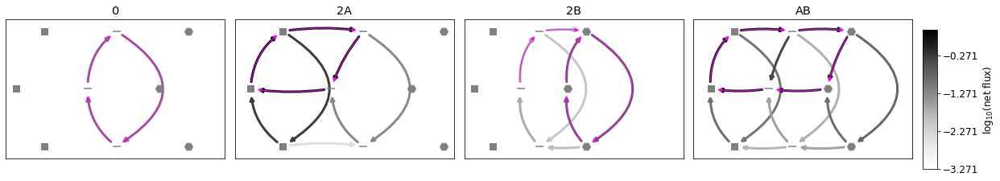

4782
[   6.90676968 6075.18377013  349.66555396    8.89640706]
[   6.90676968 6075.18377013   21.04123017    8.89640706]
[  17.16458582 6075.18377013  349.66555396    8.89640706]
6.906769682450503,6075.183770134303,349.66555395845234,8.896407055611245,6.906769682450503,6075.183770134303,21.041230167926063,8.896407055611245,17.1645858194821,6075.183770134303,349.66555395845234,8.896407055611245,9217.826823247013,762.2127937011569,9217.826823247013,762.2127937011569,9217.826823247013,762.2127937011569,9217.826823247013,762.2127937011569,9217.826823247013,762.2127937011569,9217.826823247013,762.2127937011569
*****negative SAB
[-1.221572033642784, 0.41688447521380506, [0.16812309494156208, 1.2365435347417286, 0.39717769888946364, 0.5302486690565308]]
0 0 0.16812309494156205
2 0 1.2365435347417286
0 2 0.3971776988894636
1 1 0.5302486690565307


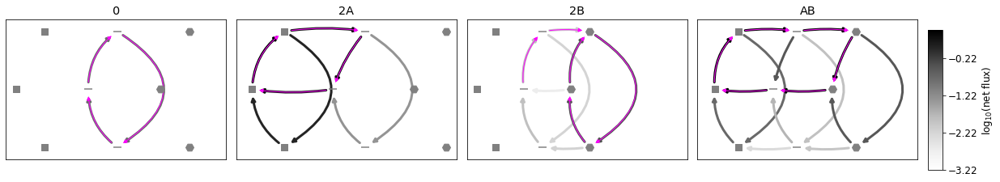

5106
[ 12.60476379  45.78586157 530.79341871   4.11278479]
[12.60476379 45.78586157 17.2142338   4.11278479]
[ 42.39784502  45.78586157 530.79341871   4.11278479]
12.60476378602096,45.78586156721335,530.7934187123872,4.112784788548218,12.60476378602096,45.78586156721335,17.2142337996092,4.112784788548218,42.397845017546594,45.78586156721335,530.7934187123872,4.112784788548218,7344.098245529842,952.1098827691004,7344.098245529842,952.1098827691004,7344.098245529842,952.1098827691004,7344.098245529842,952.1098827691004,7344.098245529842,952.1098827691004,7344.098245529842,952.1098827691004
*****negative SAB
[-1.1258221849731302, 0.33398123649338013, [0.09448887705882392, 0.7927310694831483, 0.2881915628529615, 0.36326171783573596]]
0 0 0.09448887705882392
2 0 0.7927310694831482
0 2 0.2881915628529615
1 1 0.36326171783573596


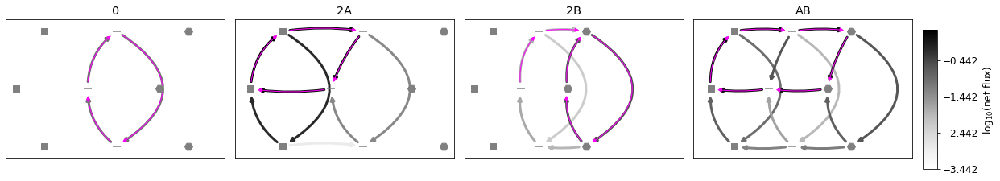

3061
[  4.6012462  355.21549092 492.20270284   3.89416019]
[  4.6012462  355.21549092  21.2474964    3.89416019]
[  4.7065979  355.21549092 492.20270284   3.89416019]
4.601246199993836,355.2154909226273,492.20270284292366,3.894160185679521,4.601246199993836,355.2154909226273,21.247496401472134,3.894160185679521,4.706597897590391,355.2154909226273,492.20270284292366,3.894160185679521,2366.888096217966,475.529200238172,2366.888096217966,475.529200238172,2366.888096217966,475.529200238172,2366.888096217966,475.529200238172,2366.888096217966,475.529200238172,2366.888096217966,475.529200238172
*****negative SAB
[-1.6339827112417629, 1.1848065973206554, [0.03578240953750639, 0.2576731058305311, 0.0365198477975347, 0.08302163533476065]]
0 0 0.03578240953750639
2 0 0.2576731058305311
0 2 0.036519847797534706
1 1 0.08302163533476065


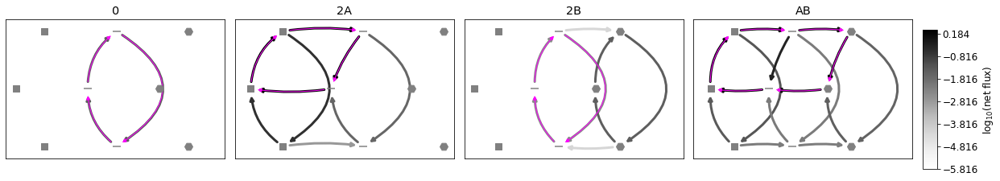

4009
[  15.81533082 3043.50677516 2525.67958499    5.63377051]
[  15.81533082 3043.50677516  310.3269743     5.63377051]
[  22.62690824 3043.50677516 2525.67958499    5.63377051]
15.815330819891203,3043.5067751603133,2525.679584990292,5.633770506163445,15.815330819891203,3043.5067751603133,310.3269742985793,5.633770506163445,22.6269082392848,3043.5067751603133,2525.679584990292,5.633770506163445,7055.6617069177455,277.6614565607599,7055.6617069177455,277.6614565607599,7055.6617069177455,277.6614565607599,7055.6617069177455,277.6614565607599,7055.6617069177455,277.6614565607599,7055.6617069177455,277.6614565607599
*****negative SAB
[-0.9318176012796271, 1.3506346627112111, [0.034980140869443115, 0.24142614240974813, 0.04962467779739496, 0.12655498207698818]]
0 0 0.03498014086944311
2 0 0.24142614240974816
0 2 0.04962467779739497
1 1 0.12655498207698818


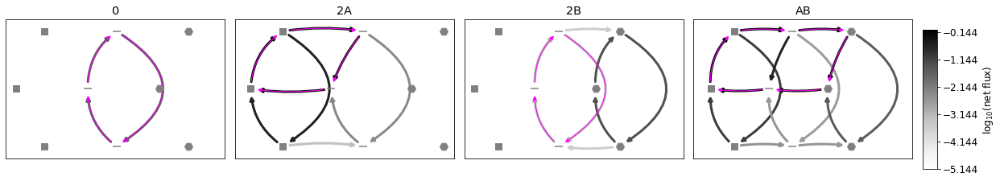

4270
[  4.11071824  48.40382532 305.48724871   1.11067109]
[ 4.11071824 48.40382532 27.96147348  1.11067109]
[  9.06826256  48.40382532 305.48724871   1.11067109]
4.11071824481517,48.40382532164001,305.48724870866783,1.1106710926456145,4.11071824481517,48.40382532164001,27.96147347755013,1.1106710926456145,9.068262556291268,48.40382532164001,305.48724870866783,1.1106710926456145,8663.13729893091,93.46442548884431,8663.13729893091,93.46442548884431,8663.13729893091,93.46442548884431,8663.13729893091,93.46442548884431,8663.13729893091,93.46442548884431,8663.13729893091,93.46442548884431
*****negative SAB
[-1.1822223233509446, 0.8650109880274391, [0.014689872613733206, 0.13141206971564884, 0.03179483829561422, 0.05790964125619487]]
0 0 0.014689872613733206
2 0 0.1314120697156488
0 2 0.03179483829561422
1 1 0.05790964125619487


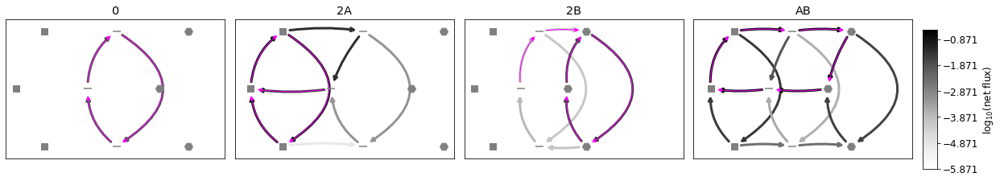

5657
[   9.37213486 3554.87923892  712.07988544    6.44650663]
[   9.37213486 3554.87923892   33.97791075    6.44650663]
[  14.02688232 3554.87923892  712.07988544    6.44650663]
9.37213485510869,3554.879238924063,712.0798854384993,6.446506632808197,9.37213485510869,3554.879238924063,33.97791075390187,6.446506632808197,14.02688231535282,3554.879238924063,712.0798854384993,6.446506632808197,9027.866967914948,1244.7195022211956,9027.866967914948,1244.7195022211956,9027.866967914948,1244.7195022211956,9027.866967914948,1244.7195022211956,9027.866967914948,1244.7195022211956,9027.866967914948,1244.7195022211956
*****negative SAB
[-1.663856315739503, 0.775836821150885, [0.08300074339960303, 0.6555911228520974, 0.12084042662618626, 0.2069009118973636]]
0 0 0.08300074339960303
2 0 0.6555911228520975
0 2 0.12084042662618626
1 1 0.2069009118973636


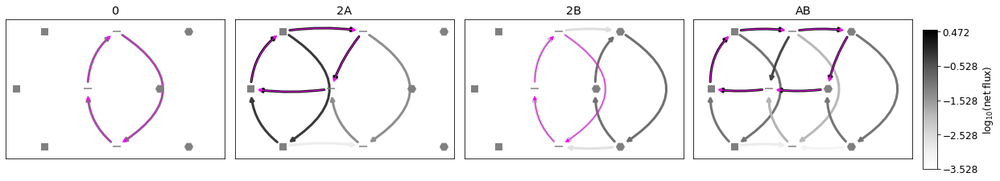

5179
[   8.75147952    4.51790852 1424.02039249    3.39327759]
[ 8.75147952  4.51790852 14.83425675  3.39327759]
[   9.26339289    4.51790852 1424.02039249    3.39327759]
8.75147951574487,4.5179085219447845,1424.0203924882164,3.393277594669642,8.75147951574487,4.5179085219447845,14.834256754310749,3.393277594669642,9.263392893185758,4.5179085219447845,1424.0203924882164,3.393277594669642,3361.859492894107,1669.1948714742075,3361.859492894107,1669.1948714742075,3361.859492894107,1669.1948714742075,3361.859492894107,1669.1948714742075,3361.859492894107,1669.1948714742075,3361.859492894107,1669.1948714742075
*****negative SAB
[-1.2924836882816155, 1.0039830738007673, [0.020583221861907156, 0.10580140893142027, 0.021537042828912376, 0.043193171335392445]]
0 0 0.020583221861907152
2 0 0.10580140893142029
0 2 0.021537042828912376
1 1 0.04319317133539244


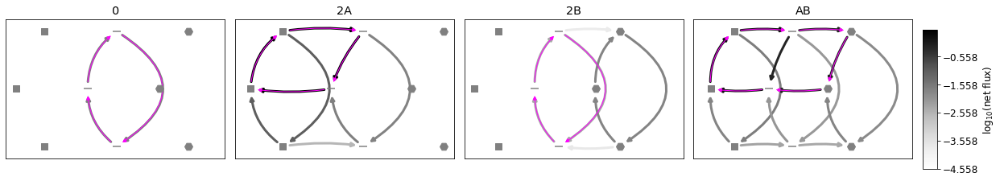

5072
[ 27.12462735 905.29781664 291.95152193   1.76902464]
[ 27.12462735 905.29781664   5.11069751   1.76902464]
[ 30.76936184 905.29781664 291.95152193   1.76902464]
27.12462734950211,905.2978166422926,291.9515219276371,1.7690246394461728,27.12462734950211,905.2978166422926,5.1106975139687565,1.7690246394461728,30.769361837965647,905.2978166422926,291.9515219276371,1.7690246394461728,8061.554810143721,1082.9516504107908,8061.554810143721,1082.9516504107908,8061.554810143721,1082.9516504107908,8061.554810143721,1082.9516504107908,8061.554810143721,1082.9516504107908,8061.554810143721,1082.9516504107908
*****negative SAB
[-1.6561129320109798, 0.818242284836685, [0.14953071554790356, 0.9257270529041683, 0.1665819015456111, 0.29372660578353105]]
0 0 0.14953071554790354
2 0 0.9257270529041682
0 2 0.1665819015456111
1 1 0.29372660578353116


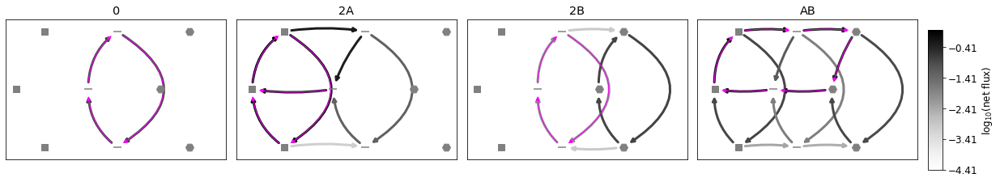

5183
[  1.07044475 162.86631527 265.03956252  30.9432287 ]
[  1.07044475 162.86631527   1.14358456  30.9432287 ]
[  1.73335039 162.86631527 265.03956252  30.9432287 ]
1.070444746565164,162.8663152661865,265.0395625220489,30.94322870083452,1.070444746565164,162.8663152661865,1.143584564725712,30.94322870083452,1.7333503896723148,162.8663152661865,265.0395625220489,30.94322870083452,8743.191366817597,122.9618906521543,8743.191366817597,122.9618906521543,8743.191366817597,122.9618906521543,8743.191366817597,122.9618906521543,8743.191366817597,122.9618906521543,8743.191366817597,122.9618906521543
*****negative SAB
[-1.373894811003114, 1.017436773167634, [0.1114290324510992, 0.9416264711582526, 0.17948002549442416, 0.3633248558910685]]
0 0 0.11142903245109921
2 0 0.9416264711582525
0 2 0.17948002549442418
1 1 0.36332485589106844


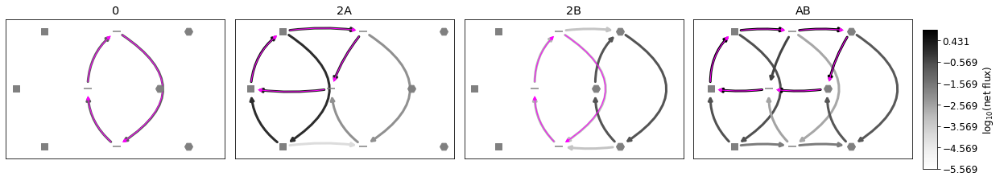

3939
[2.87616157e+01 4.19231342e+03 3.98778114e+02 1.72894304e+00]
[2.87616157e+01 4.19231342e+03 3.64085709e+00 1.72894304e+00]
[3.18391038e+01 4.19231342e+03 3.98778114e+02 1.72894304e+00]
28.76161568392013,4192.313424639945,398.7781137123284,1.7289430382953226,28.76161568392013,4192.313424639945,3.640857092706388,1.7289430382953226,31.83910377751267,4192.313424639945,398.7781137123284,1.7289430382953226,5455.324590694022,623.8934473071411,5455.324590694022,623.8934473071411,5455.324590694022,623.8934473071411,5455.324590694022,623.8934473071411,5455.324590694022,623.8934473071411,5455.324590694022,623.8934473071411
*****negative SAB
[-1.8104099609847841, 1.0286892222389317, [0.11583845824348672, 0.9066528447318076, 0.12670303376848518, 0.25849570161034097]]
0 0 0.11583845824348672
2 0 0.9066528447318076
0 2 0.12670303376848518
1 1 0.25849570161034097


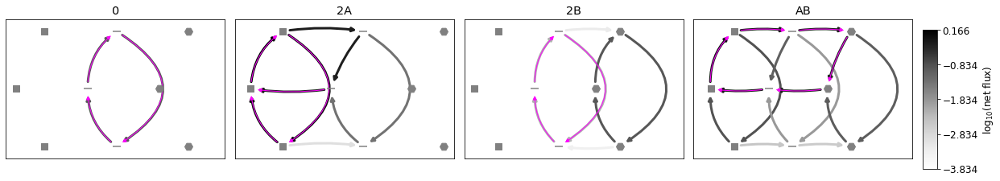

5385
[ 129.4333525   308.81714997 2350.67108726    2.90262378]
[129.4333525  308.81714997   6.17424771   2.90262378]
[ 138.01090239  308.81714997 2350.67108726    2.90262378]
129.43335249686027,308.81714997344216,2350.671087260008,2.902623779939068,129.43335249686027,308.81714997344216,6.1742477117232895,2.902623779939068,138.01090238960157,308.81714997344216,2350.671087260008,2.902623779939068,3837.9004502607777,861.3487074449638,3837.9004502607777,861.3487074449638,3837.9004502607777,861.3487074449638,3837.9004502607777,861.3487074449638,3837.9004502607777,861.3487074449638,3837.9004502607777,861.3487074449638
*****negative SAB
[-1.3194188141409804, 1.513713275318248, [0.1512328932329087, 1.1383575556380916, 0.15974267541239656, 0.45613568991603126]]
0 0 0.15123289323290873
2 0 1.1383575556380918
0 2 0.15974267541239656
1 1 0.45613568991603126


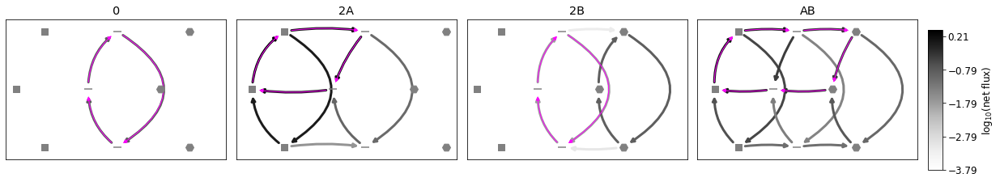

4338
[ 11.88169027 380.23587037 433.19023127   8.41048313]
[ 11.88169027 380.23587037   1.52900317   8.41048313]
[ 14.38340063 380.23587037 433.19023127   8.41048313]
11.881690271215325,380.2358703693325,433.1902312663519,8.410483125519443,11.881690271215325,380.2358703693325,1.5290031694952335,8.410483125519443,14.383400634799706,380.2358703693325,433.1902312663519,8.410483125519443,2027.596573205008,492.6833388584347,2027.596573205008,492.6833388584347,2027.596573205008,492.6833388584347,2027.596573205008,492.6833388584347,2027.596573205008,492.6833388584347,2027.596573205008,492.6833388584347
*****negative SAB
[-1.5489033588894132, 1.008742565204007, [0.22023539144790308, 1.5323464438946899, 0.26027282346742353, 0.5237096705177817]]
0 0 0.22023539144790308
2 0 1.5323464438946899
0 2 0.2602728234674236
1 1 0.5237096705177817


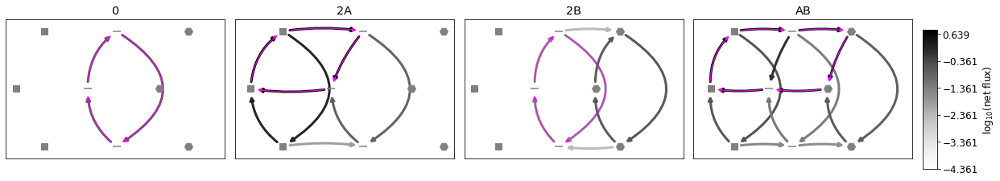

1332
[1.30413306e+00 8.89362111e+03 2.52007460e+03 2.94380578e+02]
[1.30413306e+00 8.89362111e+03 4.42379629e+00 2.94380578e+02]
[1.33377297e+00 8.89362111e+03 2.52007460e+03 2.94380578e+02]
1.3041330556842734,8893.621110553238,2520.0746046540726,294.3805780264915,1.3041330556842734,8893.621110553238,4.423796294521217,294.3805780264915,1.333772971540179,8893.621110553238,2520.0746046540726,294.3805780264915,3668.452531951685,19.224943789733874,3668.452531951685,19.224943789733874,3668.452531951685,19.224943789733874,3668.452531951685,19.224943789733874,3668.452531951685,19.224943789733874,3668.452531951685,19.224943789733874
*****negative SAB
[-0.8714134317283958, 2.3024396957841415, [0.13634175163275541, 1.2582992495140157, 0.13943087229293127, 0.6878002922232218]]
0 0 0.13634175163275541
2 0 1.258299249514016
0 2 0.13943087229293127
1 1 0.6878002922232219


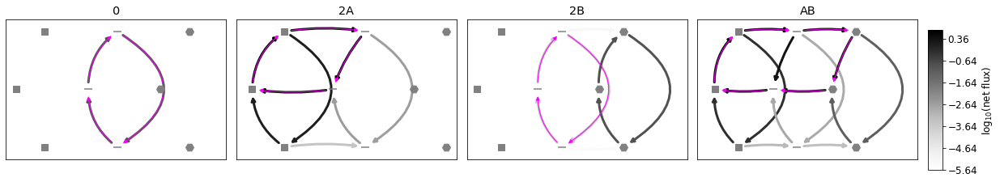

3229
[  79.54632356   30.30380738 2258.11567434   18.57135984]
[ 79.54632356  30.30380738 217.71729964  18.57135984]
[ 142.32677292   30.30380738 2258.11567434   18.57135984]
79.5463235628475,30.30380737972401,2258.115674342941,18.57135983897244,79.5463235628475,30.30380737972401,217.71729964006445,18.57135983897244,142.3267729158334,30.30380737972401,2258.115674342941,18.57135983897244,9265.557441170526,5570.1507192348645,9265.557441170526,5570.1507192348645,9265.557441170526,5570.1507192348645,9265.557441170526,5570.1507192348645,9265.557441170526,5570.1507192348645,9265.557441170526,5570.1507192348645
*****negative SAB
[-0.5843174270916094, 0.3518734857261163, [0.6142595313867937, 1.8290450488016174, 0.9558788572772863, 1.2199087028988012]]
0 0 0.6142595313867938
2 0 1.8290450488016174
0 2 0.9558788572772865
1 1 1.2199087028988012


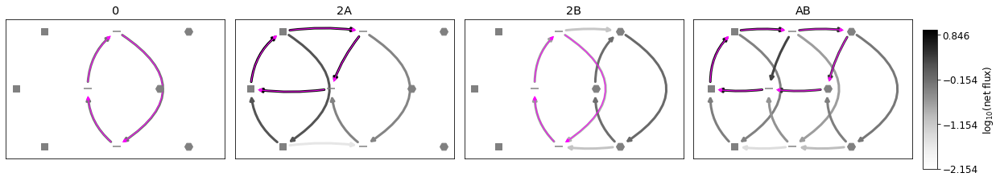

5636
[ 2.22134325 13.90871179 98.57691238  1.28440636]
[ 2.22134325 13.90871179  3.33264286  1.28440636]
[11.55189318 13.90871179 98.57691238  1.28440636]
2.2213432470213523,13.908711794236298,98.57691238283692,1.2844063583280398,2.2213432470213523,13.908711794236298,3.3326428594644675,1.2844063583280398,11.551893179751598,13.908711794236298,98.57691238283692,1.2844063583280398,7799.777702947295,570.8571723474929,7799.777702947295,570.8571723474929,7799.777702947295,570.8571723474929,7799.777702947295,570.8571723474929,7799.777702947295,570.8571723474929,7799.777702947295,570.8571723474929
*****negative SAB
[-0.9420845685566206, 0.1532548346833984, [0.02789294116427954, 0.2746831958591915, 0.1285588787030763, 0.1429671889435671]]
0 0 0.027892941164279535
2 0 0.27468319585919154
0 2 0.1285588787030763
1 1 0.14296718894356708


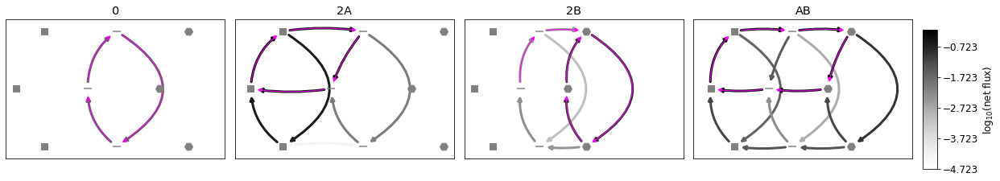

4514
[  6.83768181   6.04395845 489.27173395   2.94596987]
[6.83768181 6.04395845 2.15417844 2.94596987]
[  8.15555924   6.04395845 489.27173395   2.94596987]
6.837681813220891,6.043958445961568,489.27173394505314,2.9459698741702662,6.837681813220891,6.043958445961568,2.1541784429024053,2.9459698741702662,8.155559237145578,6.043958445961568,489.27173394505314,2.9459698741702662,9252.484873823134,1671.9018568418155,9252.484873823134,1671.9018568418155,9252.484873823134,1671.9018568418155,9252.484873823134,1671.9018568418155,9252.484873823134,1671.9018568418155,9252.484873823134,1671.9018568418155
*****negative SAB
[-2.0903982642086554, 0.8775231918021831, [0.04009569336481273, 0.3678492004528175, 0.047014999234645825, 0.08637682491883042]]
0 0 0.04009569336481273
2 0 0.3678492004528175
0 2 0.047014999234645825
1 1 0.0863768249188304


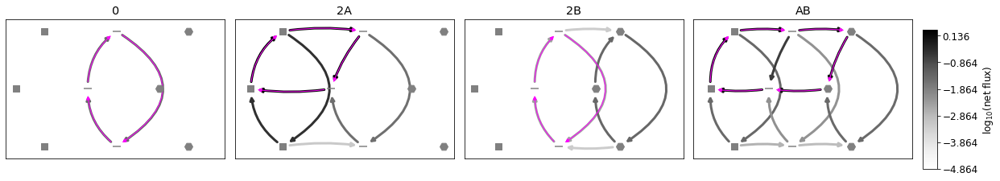

4090
[  4.34435481   1.97319713 150.16406025   1.27709953]
[ 4.34435481  1.97319713 17.31191544  1.27709953]
[  9.13157694   1.97319713 150.16406025   1.27709953]
4.344354813417449,1.973197125790332,150.16406024553004,1.2770995312370887,4.344354813417449,1.973197125790332,17.311915435756788,1.2770995312370887,9.131576938147742,1.973197125790332,150.16406024553004,1.2770995312370887,3033.5619783148004,179.5347037749849,3033.5619783148004,179.5347037749849,3033.5619783148004,179.5347037749849,3033.5619783148004,179.5347037749849,3033.5619783148004,179.5347037749849,3033.5619783148004,179.5347037749849
*****negative SAB
[-0.9647601638651836, 0.48072103174495984, [0.03498277768771132, 0.18816022082657102, 0.06908672662995549, 0.09640644447866477]]
0 0 0.03498277768771132
2 0 0.18816022082657102
0 2 0.06908672662995549
1 1 0.09640644447866478


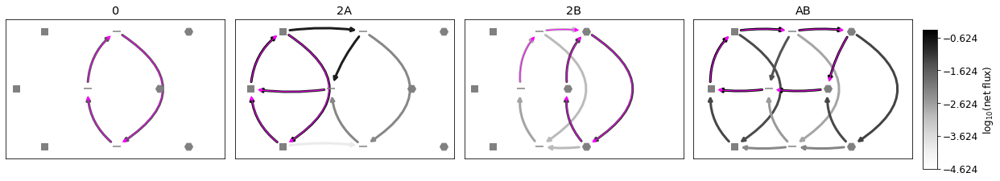

5510
[  5.70604116 228.88948008 114.40471411   2.02923451]
[  5.70604116 228.88948008   1.80504457   2.02923451]
[  6.10433822 228.88948008 114.40471411   2.02923451]
5.706041162764269,228.88948007536175,114.40471411071204,2.029234507178905,5.706041162764269,228.88948007536175,1.8050445674861963,2.029234507178905,6.104338217808331,228.88948007536175,114.40471411071204,2.029234507178905,764.5689504260836,72.93549003119044,764.5689504260836,72.93549003119044,764.5689504260836,72.93549003119044,764.5689504260836,72.93549003119044,764.5689504260836,72.93549003119044,764.5689504260836,72.93549003119044
*****negative SAB
[-1.6653438253474133, 1.3314575810939446, [0.0947609537956542, 0.8042793854198862, 0.10075806603745097, 0.2535645246922229]]
0 0 0.0947609537956542
2 0 0.8042793854198861
0 2 0.10075806603745097
1 1 0.2535645246922229


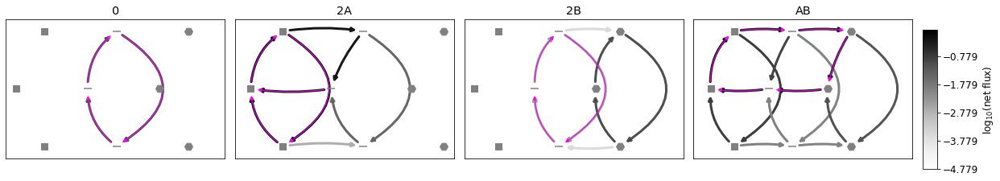

4561
[  6.67714025  94.72046575 370.65051702  10.67371241]
[ 6.67714025 94.72046575 31.66996352 10.67371241]
[ 10.30495021  94.72046575 370.65051702  10.67371241]
6.677140246849406,94.72046574988867,370.6505170206383,10.67371240538618,6.677140246849406,94.72046574988867,31.66996352029725,10.67371240538618,10.304950212568118,94.72046574988867,370.6505170206383,10.67371240538618,6573.853883920912,59.48159322983324,6573.853883920912,59.48159322983324,6573.853883920912,59.48159322983324,6573.853883920912,59.48159322983324,6573.853883920912,59.48159322983324,6573.853883920912,59.48159322983324
*****negative SAB
[-1.0540573938304494, 1.25992791782947, [0.18332907869800236, 1.3903057061675308, 0.27959623365788283, 0.669587615581666]]
0 0 0.18332907869800238
2 0 1.390305706167531
0 2 0.2795962336578828
1 1 0.669587615581666


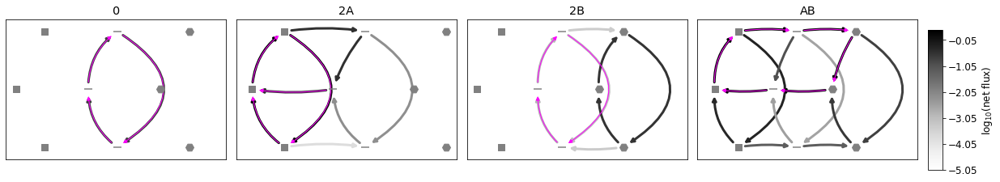

4092
[  1.25816564 187.58443532 320.15229574   8.44180575]
[  1.25816564 187.58443532  26.0243357    8.44180575]
[  1.8287812  187.58443532 320.15229574   8.44180575]
1.258165642549789,187.5844353187663,320.15229574347,8.441805746214028,1.258165642549789,187.5844353187663,26.024335699194133,8.441805746214028,1.8287811956765312,187.5844353187663,320.15229574347,8.441805746214028,2103.177255589464,38.52755371664962,2103.177255589464,38.52755371664962,2103.177255589464,38.52755371664962,2103.177255589464,38.52755371664962,2103.177255589464,38.52755371664962,2103.177255589464,38.52755371664962
*****negative SAB
[-1.084221830680727, 1.4902838577730935, [0.03219431284790427, 0.27745820533262316, 0.046579426449364074, 0.13086221887442848]]
0 0 0.03219431284790427
2 0 0.2774582053326232
0 2 0.046579426449364074
1 1 0.1308622188744285


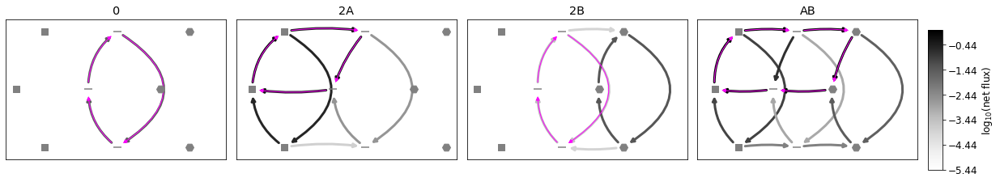

3708
[ 15.01790796  69.59719042 451.34005385   1.32555614]
[15.01790796 69.59719042 39.20004381  1.32555614]
[ 28.0781523   69.59719042 451.34005385   1.32555614]
15.017907964257724,69.59719042037125,451.3400538512471,1.325556141499295,15.017907964257724,69.59719042037125,39.20004380766717,1.325556141499295,28.07815229561609,69.59719042037125,451.3400538512471,1.325556141499295,4186.994966790405,613.3334359096639,4186.994966790405,613.3334359096639,4186.994966790405,613.3334359096639,4186.994966790405,613.3334359096639,4186.994966790405,613.3334359096639,4186.994966790405,613.3334359096639
*****negative SAB
[-1.1108743230461438, 0.5692272469812266, [0.04253926372292557, 0.24039466820889563, 0.07501772037271329, 0.11130593916276003]]
0 0 0.04253926372292556
2 0 0.24039466820889566
0 2 0.07501772037271327
1 1 0.11130593916276005


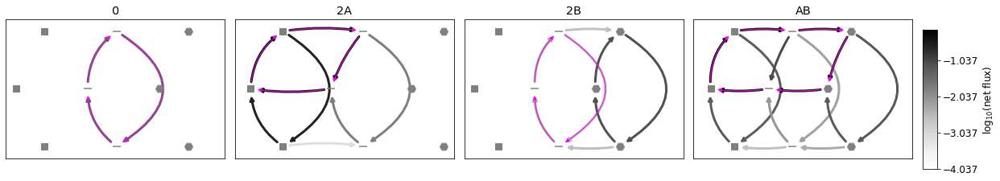

3953
[   3.72173531 2732.06837372  191.48060094    7.11573365]
[   3.72173531 2732.06837372    3.84681958    7.11573365]
[   7.35262044 2732.06837372  191.48060094    7.11573365]
3.7217353142196017,2732.068373723568,191.4806009400324,7.115733654975625,3.7217353142196017,2732.068373723568,3.846819580864876,7.115733654975625,7.352620440085341,2732.068373723568,191.4806009400324,7.115733654975625,390.8341457247489,133.30226410370577,390.8341457247489,133.30226410370577,390.8341457247489,133.30226410370577,390.8341457247489,133.30226410370577,390.8341457247489,133.30226410370577,390.8341457247489,133.30226410370577
*****negative SAB
[-0.9091441423016178, 0.6508378618602115, [0.13089097019880097, 0.6967326692873372, 0.23630058609681862, 0.37101077059819476]]
0 0 0.13089097019880097
2 0 0.6967326692873372
0 2 0.23630058609681864
1 1 0.37101077059819476


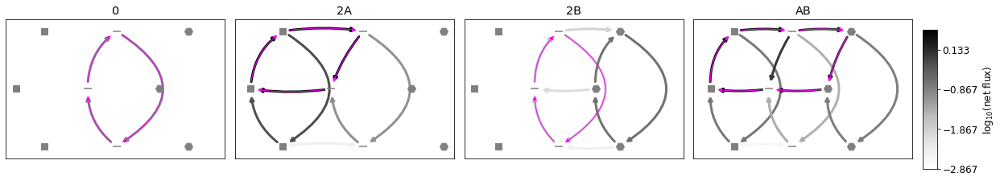

3893
[ 11.97788299  15.27115608 263.09577837   3.12299582]
[11.97788299 15.27115608  1.42867986  3.12299582]
[ 14.83813081  15.27115608 263.09577837   3.12299582]
11.977882986488742,15.271156082621964,263.0957783655539,3.122995816927445,11.977882986488742,15.271156082621964,1.4286798610830918,3.122995816927445,14.838130808113805,15.271156082621964,263.0957783655539,3.122995816927445,604.0058609848413,109.4611959664696,604.0058609848413,109.4611959664696,604.0058609848413,109.4611959664696,604.0058609848413,109.4611959664696,604.0058609848413,109.4611959664696,604.0058609848413,109.4611959664696
*****negative SAB
[-1.3166693243801473, 1.3213026000907324, [0.13328839865272465, 1.0000376836590386, 0.16065997258212256, 0.40147582987366787]]
0 0 0.13328839865272465
2 0 1.0000376836590386
0 2 0.16065997258212256
1 1 0.4014758298736678


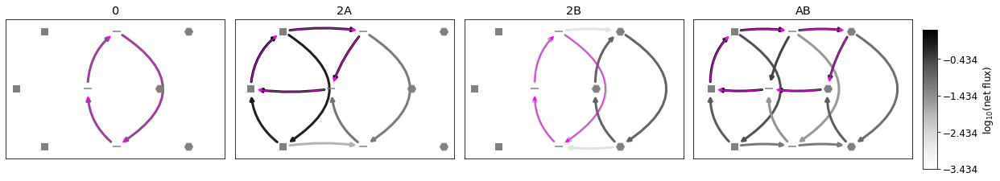

5065
[ 10.39792751   5.83273894 767.43504957   1.83955061]
[10.39792751  5.83273894 11.83822608  1.83955061]
[ 12.19573127   5.83273894 767.43504957   1.83955061]
10.397927507786267,5.832738935791902,767.4350495685321,1.839550614664213,10.397927507786267,5.832738935791902,11.838226080939108,1.839550614664213,12.19573126621406,5.832738935791902,767.4350495685321,1.839550614664213,7783.501759683011,3693.817633540517,7783.501759683011,3693.817633540517,7783.501759683011,3693.817633540517,7783.501759683011,3693.817633540517,7783.501759683011,3693.817633540517,7783.501759683011,3693.817633540517
*****negative SAB
[-1.330585077415525, 0.7062838542023194, [0.024429999865821724, 0.1139800226542953, 0.027776024930765388, 0.04531925050848245]]
0 0 0.024429999865821728
2 0 0.11398002265429531
0 2 0.027776024930765388
1 1 0.04531925050848244


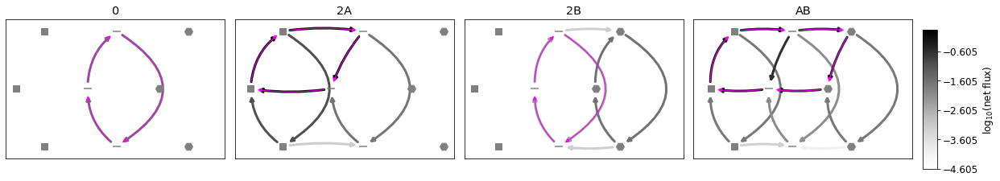

6160
[   6.48950576  377.76314926 1376.41693314   10.50248356]
[  6.48950576 377.76314926  21.77360284  10.50248356]
[   6.75378703  377.76314926 1376.41693314   10.50248356]
6.489505755447718,377.76314926483474,1376.4169331379962,10.502483557593768,6.489505755447718,377.76314926483474,21.77360283985361,10.502483557593768,6.753787034206216,377.76314926483474,1376.4169331379962,10.502483557593768,6719.168473920159,1202.671770368146,6719.168473920159,1202.671770368146,6719.168473920159,1202.671770368146,6719.168473920159,1202.671770368146,6719.168473920159,1202.671770368146,6719.168473920159,1202.671770368146
*****negative SAB
[-1.9370440329086718, 1.3098673420383693, [0.048906751386718086, 0.4815554845105601, 0.050725766280126566, 0.12575868185545164]]
0 0 0.048906751386718086
2 0 0.4815554845105601
0 2 0.050725766280126566
1 1 0.12575868185545164


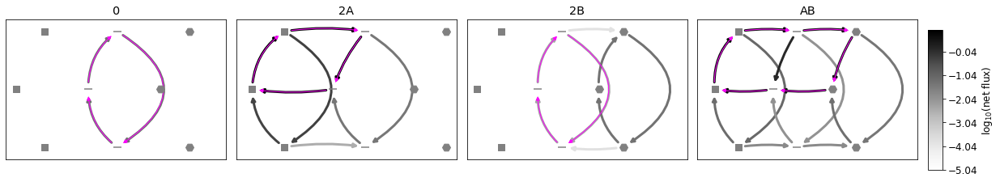

5189
[2.47926121e+00 9.74934199e+03 4.91044867e+02 9.03864786e+00]
[2.47926121e+00 9.74934199e+03 2.90948277e+01 9.03864786e+00]
[3.78610510e+00 9.74934199e+03 4.91044867e+02 9.03864786e+00]
2.4792612143832025,9749.34199023444,491.0448671731715,9.038647857675285,2.4792612143832025,9749.34199023444,29.09482773685317,9.038647857675285,3.786105100479245,9749.34199023444,491.0448671731715,9.038647857675285,3422.427649538581,396.0594512815885,3422.427649538581,396.0594512815885,3422.427649538581,396.0594512815885,3422.427649538581,396.0594512815885,3422.427649538581,396.0594512815885,3422.427649538581,396.0594512815885
*****negative SAB
[-1.4743574449561327, 0.908878862586268, [0.044589586878794635, 0.34768271603159656, 0.06664345226197935, 0.125128801931478]]
0 0 0.044589586878794635
2 0 0.34768271603159656
0 2 0.06664345226197935
1 1 0.12512880193147802


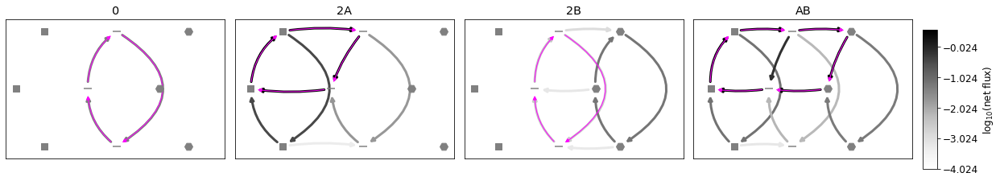

5274
[ 10.57710898 130.78165879 440.98960861   5.18627883]
[ 10.57710898 130.78165879  25.06371026   5.18627883]
[ 14.24386921 130.78165879 440.98960861   5.18627883]
10.577108975521709,130.78165879448062,440.9896086095577,5.186278829779496,10.577108975521709,130.78165879448062,25.063710258720317,5.186278829779496,14.243869213858328,130.78165879448062,440.9896086095577,5.186278829779496,5438.492606137726,219.57381845142928,5438.492606137726,219.57381845142928,5438.492606137726,219.57381845142928,5438.492606137726,219.57381845142928,5438.492606137726,219.57381845142928,5438.492606137726,219.57381845142928
*****negative SAB
[-1.60118008067414, 1.2049549333286007, [0.1199893766058038, 1.1152718396303432, 0.15945932648024042, 0.3676016937461737]]
0 0 0.11998937660580379
2 0 1.115271839630343
0 2 0.15945932648024042
1 1 0.3676016937461737


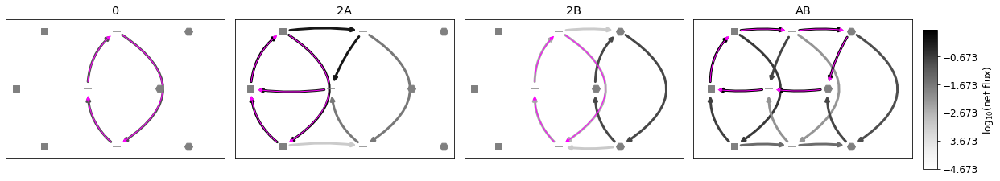

6139
[  40.86488385 1557.59117755 1062.57697961   16.59357695]
[4.08648839e+01 1.55759118e+03 1.37567631e+00 1.65935769e+01]
[  51.24677656 1557.59117755 1062.57697961   16.59357695]
40.86488385315098,1557.591177550744,1062.5769796143436,16.593576949350574,40.86488385315098,1557.591177550744,1.3756763141537818,16.593576949350574,51.24677655616118,1557.591177550744,1062.5769796143436,16.593576949350574,3121.250900018268,499.91722913132935,3121.250900018268,499.91722913132935,3121.250900018268,499.91722913132935,3121.250900018268,499.91722913132935,3121.250900018268,499.91722913132935,3121.250900018268,499.91722913132935
*****negative SAB
[-1.5068079649999127, 1.3305645675419586, [0.6051872138048383, 5.296762155800087, 0.7410990060145898, 1.8638719681492206]]
0 0 0.6051872138048384
2 0 5.296762155800087
0 2 0.7410990060145898
1 1 1.8638719681492208


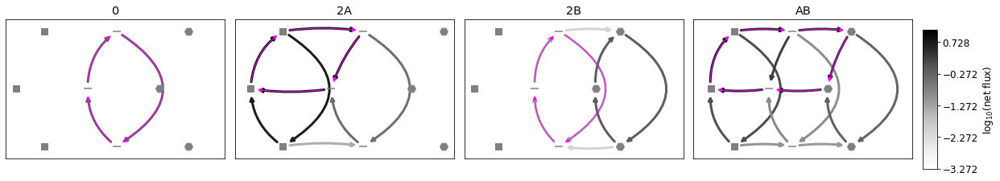

4932
[   3.91858121   98.50298946 2271.24492956   13.66410779]
[ 3.91858121 98.50298946  3.15580388 13.66410779]
[   6.34314014   98.50298946 2271.24492956   13.66410779]
3.918581211913607,98.50298945548536,2271.244929558588,13.664107786905983,3.918581211913607,98.50298945548536,3.1558038751849757,13.664107786905983,6.34314014051434,98.50298945548536,2271.244929558588,13.664107786905983,3761.7042118508775,1045.6503521816844,3761.7042118508775,1045.6503521816844,3761.7042118508775,1045.6503521816844,3761.7042118508775,1045.6503521816844,3761.7042118508775,1045.6503521816844,3761.7042118508775,1045.6503521816844
*****negative SAB
[-1.4291445244746048, 1.1648833888520131, [0.023388044789570083, 0.2176915761363354, 0.036054660647638084, 0.08083999049143463]]
0 0 0.023388044789570083
2 0 0.2176915761363354
0 2 0.036054660647638084
1 1 0.08083999049143464


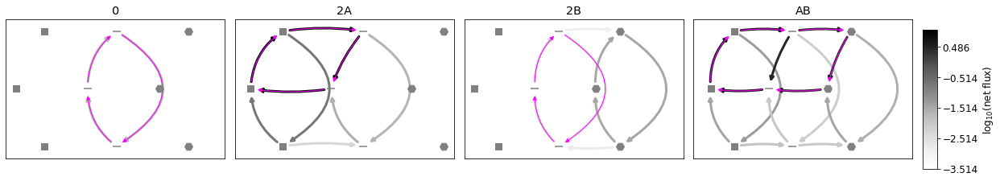

5518
[ 2.29494162  4.76477659 53.83463836  1.154928  ]
[2.29494162 4.76477659 1.32722254 1.154928  ]
[ 5.64458595  4.76477659 53.83463836  1.154928  ]
2.294941623179791,4.76477659245497,53.83463835939541,1.1549280010818384,2.294941623179791,4.76477659245497,1.3272225408393643,1.1549280010818384,5.64458595476205,4.76477659245497,53.83463835939541,1.1549280010818384,1128.59062149447,253.9712864534492,1128.59062149447,253.9712864534492,1128.59062149447,253.9712864534492,1128.59062149447,253.9712864534492,1128.59062149447,253.9712864534492,1128.59062149447,253.9712864534492
*****negative SAB
[-1.0004972284982299, 0.33627830616453763, [0.045823941679024295, 0.25132596671415963, 0.0995010877097842, 0.12561968075433658]]
0 0 0.0458239416790243
2 0 0.25132596671415963
0 2 0.09950108770978422
1 1 0.12561968075433658


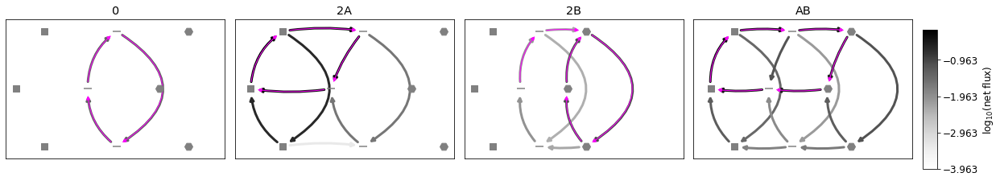

4390
[  4.83128217 874.2984498   93.79598595   1.12350615]
[  4.83128217 874.2984498    2.94091112   1.12350615]
[  7.86505026 874.2984498   93.79598595   1.12350615]
4.831282170529935,874.2984497968044,93.79598595089638,1.123506145878305,4.831282170529935,874.2984497968044,2.940911122675677,1.123506145878305,7.865050263994124,874.2984497968044,93.79598595089638,1.123506145878305,5221.156213951629,204.0796100431935,5221.156213951629,204.0796100431935,5221.156213951629,204.0796100431935,5221.156213951629,204.0796100431935,5221.156213951629,204.0796100431935,5221.156213951629,204.0796100431935
*****negative SAB
[-1.8614119291070117, 0.7191103251934062, [0.05441198267158356, 0.5106733643266886, 0.08537458458650925, 0.14054078713630752]]
0 0 0.05441198267158356
2 0 0.5106733643266888
0 2 0.08537458458650926
1 1 0.14054078713630752


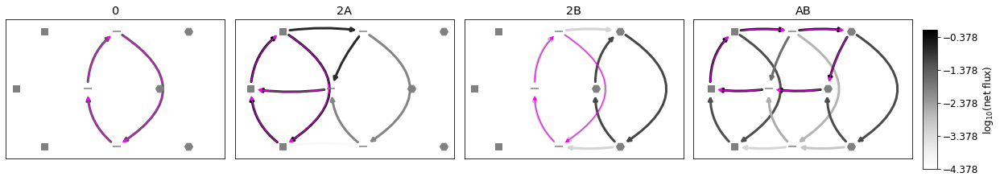

#path
[1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1]
['0-2.AB' '1-4.AB' '2-8.AB' '3-0.AB' '4-3.AB' '7-1.AB' '8-7.AB']
713
[5.65784155e+00 1.02391891e+02 5.97788723e+02 7.11708983e+03]
[5.65784155e+00 1.02391891e+02 2.07519690e+00 7.11708983e+03]
[ 404.93085275  102.39189065  597.78872298 7117.08982896]
5.657841550547762,102.39189064696872,597.788722982509,7117.0898289646975,5.657841550547762,102.39189064696872,2.075196895082567,7117.0898289646975,404.9308527468332,102.39189064696872,597.788722982509,7117.0898289646975,583.8987642523288,8252.625339738912,583.8987642523288,8252.625339738912,583.8987642523288,8252.625339738912,583.8987642523288,8252.625339738912,583.8987642523288,8252.625339738912,583.8987642523288,8252.625339738912
[2.0969065078928733, -0.6282312774028853, [4.96282247406433, 5.009850782520328, 33.12630577792104, 21.43169636057427]]
0 0 4.96282247406433
2 0 5.009850782520327
0 2 33.12630577792105
1 1 21.431696360574268


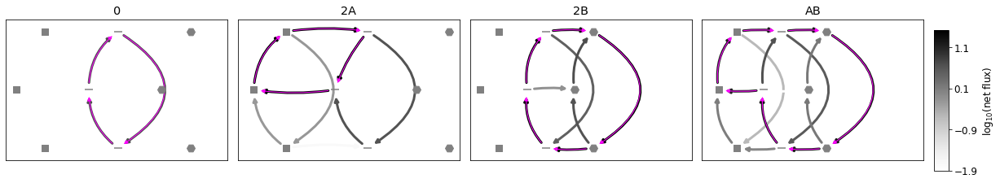

3478
[   5.05234381   13.37823321 2508.08552777 2332.75717586]
[   5.05234381   13.37823321   47.23774531 2332.75717586]
[4375.51596159   13.37823321 2508.08552777 2332.75717586]
5.052343812113977,13.3782332101682,2508.0855277681258,2332.7571758559643,5.052343812113977,13.3782332101682,47.23774531053483,2332.7571758559643,4375.515961589882,13.3782332101682,2508.0855277681258,2332.7571758559643,205.11404023469777,1380.4859496194922,205.11404023469777,1380.4859496194922,205.11404023469777,1380.4859496194922,205.11404023469777,1380.4859496194922,205.11404023469777,1380.4859496194922,205.11404023469777,1380.4859496194922
[2.296824593812257, -0.09892619949681247, [2.0579986684171523, 2.3868799948791963, 12.560977435949626, 11.728532673657723]]
0 0 2.057998668417152
2 0 2.3868799948791963
0 2 12.560977435949628
1 1 11.728532673657725


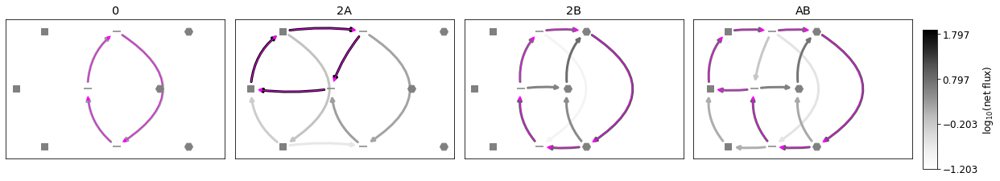

877
[ 21.87860226   3.22557711 159.69590257   1.33470473]
[21.87860226  3.22557711  7.35833112  1.33470473]
[344.10278189   3.22557711 159.69590257   1.33470473]
21.878602255836977,3.225577106746245,159.6959025747923,1.3347047331241522,21.878602255836977,3.225577106746245,7.3583311249771475,1.3347047331241522,344.1027818860533,3.225577106746245,159.6959025747923,1.3347047331241522,361.9962674840845,1045.3458670322443,361.9962674840845,1045.3458670322443,361.9962674840845,1045.3458670322443,361.9962674840845,1045.3458670322443,361.9962674840845,1045.3458670322443,361.9962674840845,1045.3458670322443
[0.9137539474754649, -0.26987265221807755, [0.15212087186651332, 0.2306321500472813, 0.5238741363389988, 0.434497412534979]]
0 0 0.15212087186651332
2 0 0.2306321500472813
0 2 0.5238741363389988
1 1 0.4344974125349789


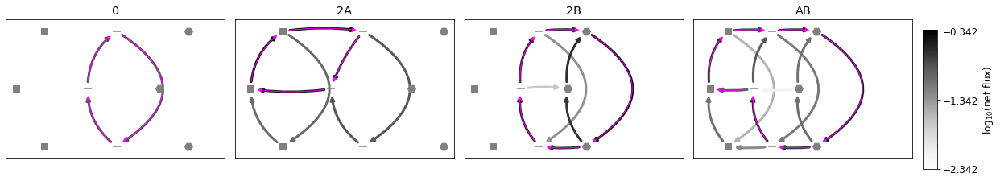

3811
[  1.22547583   8.76322007 377.64811628 286.12791867]
[  1.22547583   8.76322007   1.93480352 286.12791867]
[944.48232631   8.76322007 377.64811628 286.12791867]
1.2254758257907932,8.763220071095107,377.6481162823994,286.1279186651328,1.2254758257907932,8.763220071095107,1.9348035173241116,286.1279186651328,944.482326306766,8.763220071095107,377.6481162823994,286.1279186651328,4.738926622720046,45.01855851856262,4.738926622720046,45.01855851856262,4.738926622720046,45.01855851856262,4.738926622720046,45.01855851856262,4.738926622720046,45.01855851856262,4.738926622720046,45.01855851856262
[2.398608241291445, -0.5996364463174848, [0.49735549422852493, 0.5935412773828406, 4.742556487085331, 3.129708976435537]]
0 0 0.49735549422852493
2 0 0.5935412773828406
0 2 4.742556487085331
1 1 3.129708976435537


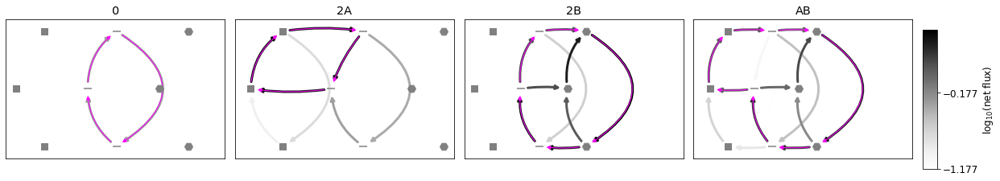

578
[ 21.60078391   4.85527432 423.15107048 133.47139825]
[ 21.60078391   4.85527432  14.47171336 133.47139825]
[808.83326556   4.85527432 423.15107048 133.47139825]
21.600783911008023,4.855274323947569,423.15107048473,133.47139825319923,21.600783911008023,4.855274323947569,14.47171335825028,133.47139825319923,808.8332655586861,4.855274323947569,423.15107048473,133.47139825319923,91.69125340196688,431.81236611727263,91.69125340196688,431.81236611727263,91.69125340196688,431.81236611727263,91.69125340196688,431.81236611727263,91.69125340196688,431.81236611727263,91.69125340196688,431.81236611727263
[0.4493317732363751, -0.11282460617915621, [2.459912113920973, 2.849308221505032, 4.206930754771146, 3.8904673323887042]]
0 0 2.4599121139209723
2 0 2.849308221505032
0 2 4.206930754771146
1 1 3.8904673323887042


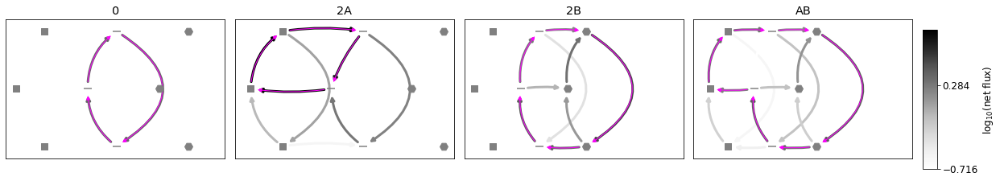

1587
[ 11.89700923   3.97082992 851.8561477  103.88653046]
[ 11.89700923   3.97082992   1.01803735 103.88653046]
[1399.24916338    3.97082992  851.8561477   103.88653046]
11.897009229550504,3.970829923914116,851.8561477006668,103.88653045729254,11.897009229550504,3.970829923914116,1.0180373471077224,103.88653045729254,1399.2491633849022,3.970829923914116,851.8561477006668,103.88653045729254,703.6883887572045,8051.305543304279,703.6883887572045,8051.305543304279,703.6883887572045,8051.305543304279,703.6883887572045,8051.305543304279,703.6883887572045,8051.305543304279,703.6883887572045,8051.305543304279
[1.4207262565955026, -0.16466331046135124, [0.9664121893459839, 1.0814570147390394, 3.2453315845332065, 2.8952794033834626]]
0 0 0.966412189345984
2 0 1.0814570147390394
0 2 3.245331584533206
1 1 2.8952794033834626


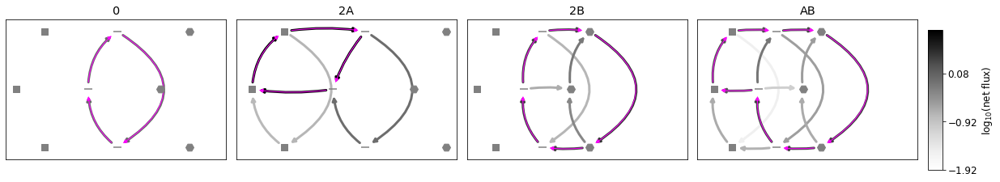

554
[  8.74499922  23.5127869  986.52371175 109.00046669]
[  8.74499922  23.5127869   43.9843288  109.00046669]
[1553.61661721   23.5127869   986.52371175  109.00046669]
8.74499922318676,23.512786901943933,986.523711747471,109.00046668689184,8.74499922318676,23.512786901943933,43.98432879922293,109.00046668689184,1553.6166172123055,23.512786901943933,986.523711747471,109.00046668689184,78.60608081059257,915.3467207699314,78.60608081059257,915.3467207699314,78.60608081059257,915.3467207699314,78.60608081059257,915.3467207699314,78.60608081059257,915.3467207699314,78.60608081059257,915.3467207699314
[2.4019670177394534, -0.600790603539556, [0.8326356857639766, 1.029678837978148, 8.253191094774593, 5.442092360308284]]
0 0 0.8326356857639766
2 0 1.029678837978148
0 2 8.253191094774591
1 1 5.442092360308283


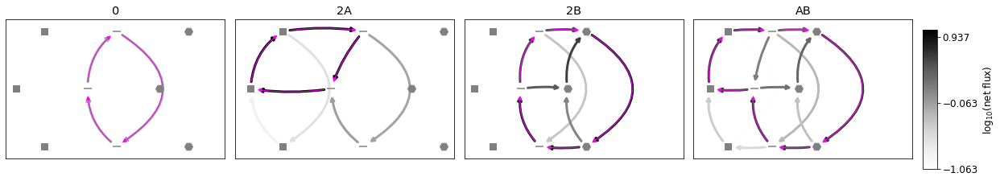

2583
[   6.90029518   95.09266622 1205.68546194 5765.18324534]
[   6.90029518   95.09266622  168.41449174 5765.18324534]
[ 265.89178715   95.09266622 1205.68546194 5765.18324534]
6.900295181691937,95.09266622145384,1205.685461941625,5765.183245338143,6.900295181691937,95.09266622145384,168.41449174072264,5765.183245338143,265.89178714626536,95.09266622145384,1205.685461941625,5765.183245338143,1761.89394822168,3179.483162823612,1761.89394822168,3179.483162823612,1761.89394822168,3179.483162823612,1761.89394822168,3179.483162823612,1761.89394822168,3179.483162823612,1761.89394822168,3179.483162823612
[2.654286665869494, -0.5007685158702725, [5.3786989240887655, 5.824086782148196, 51.87929733425816, 36.66466667500801]]
0 0 5.378698924088766
2 0 5.824086782148196
0 2 51.879297334258155
1 1 36.66466667500801


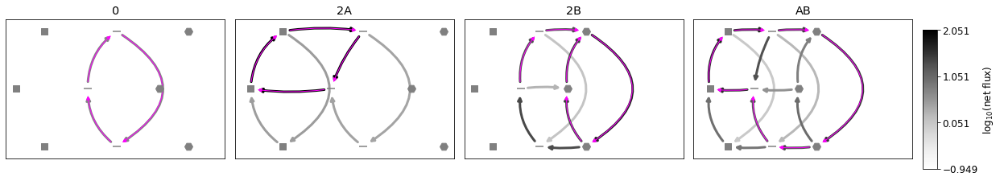

4227
[  8.55653827  45.56315408 248.45977446 184.76153494]
[  8.55653827  45.56315408  62.60209478 184.76153494]
[399.71041833  45.56315408 248.45977446 184.76153494]
8.556538274520417,45.56315408167617,248.45977446067064,184.76153494453663,8.556538274520417,45.56315408167617,62.60209477876496,184.76153494453663,399.71041833147865,45.56315408167617,248.45977446067064,184.76153494453663,1622.9388545473255,3232.561195357419,1622.9388545473255,3232.561195357419,1622.9388545473255,3232.561195357419,1622.9388545473255,3232.561195357419,1622.9388545473255,3232.561195357419,1622.9388545473255,3232.561195357419
[2.3178535711500716, -0.3085101520794062, [3.317946593292493, 4.137551533813638, 25.54804522281273, 20.629412809205228]]
0 0 3.3179465932924934
2 0 4.137551533813637
0 2 25.548045222812732
1 1 20.629412809205228


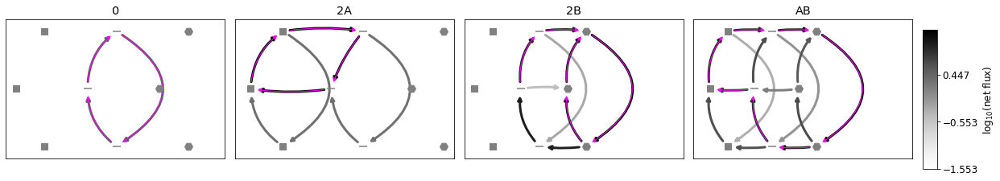

2259
[  6.11199255  17.25807533 310.43951327  46.86257274]
[ 6.11199255 17.25807533  9.02369352 46.86257274]
[210.96415008  17.25807533 310.43951327  46.86257274]
6.111992546430049,17.2580753252424,310.4395132655034,46.862572744221694,6.111992546430049,17.2580753252424,9.023693519990626,46.862572744221694,210.96415008280167,17.2580753252424,310.4395132655034,46.862572744221694,486.8924116878794,4154.01308075605,486.8924116878794,4154.01308075605,486.8924116878794,4154.01308075605,486.8924116878794,4154.01308075605,486.8924116878794,4154.01308075605,486.8924116878794,4154.01308075605
[1.6245553888985669, -0.5180223665380957, [0.7537255786486551, 0.8947745951498628, 3.9508798023767504, 2.7590117280434483]]
0 0 0.7537255786486551
2 0 0.8947745951498629
0 2 3.9508798023767504
1 1 2.7590117280434487


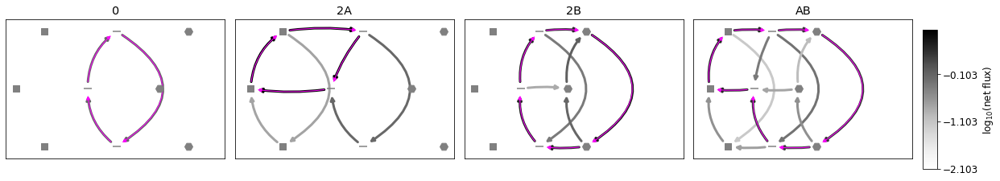

1677
[ 10.15258946 757.7338415   67.01760346   3.37314703]
[ 10.15258946 757.7338415   10.86419491   3.37314703]
[111.8530623  757.7338415   67.01760346   3.37314703]
10.15258946432327,757.7338415020994,67.01760345902288,3.3731470300507125,10.15258946432327,757.7338415020994,10.86419490679424,3.3731470300507125,111.85306230073266,757.7338415020994,67.01760345902288,3.3731470300507125,9065.811591644033,8203.453604031904,9065.811591644033,8203.453604031904,9065.811591644033,8203.453604031904,9065.811591644033,8203.453604031904,9065.811591644033,8203.453604031904,9065.811591644033,8203.453604031904
[0.9477697760048972, -0.18407710943959857, [0.4249509784066448, 0.8173027071086431, 1.7910297526713836, 1.5764858207822356]]
0 0 0.4249509784066449
2 0 0.817302707108643
0 2 1.7910297526713832
1 1 1.5764858207822354


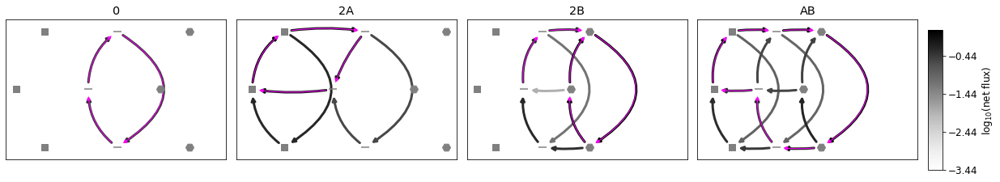

197
[  1.8167393  314.76110207 111.21211665  13.9088966 ]
[  1.8167393  314.76110207  25.0276615   13.9088966 ]
[ 43.19546317 314.76110207 111.21211665  13.9088966 ]
1.8167392955440764,314.76110207069206,111.2121166532608,13.90889660275996,1.8167392955440764,314.76110207069206,25.02766150276147,13.90889660275996,43.19546316521783,314.76110207069206,111.2121166532608,13.90889660275996,101.73604601163078,1732.2389334012237,101.73604601163078,1732.2389334012237,101.73604601163078,1732.2389334012237,101.73604601163078,1732.2389334012237,101.73604601163078,1732.2389334012237,101.73604601163078,1732.2389334012237
[1.0341231992413877, -0.5498896513867069, [0.19893899018494338, 0.21485853467200994, 0.6441514534882973, 0.4400020619718729]]
0 0 0.1989389901849434
2 0 0.2148585346720099
0 2 0.6441514534882973
1 1 0.44000206197187297


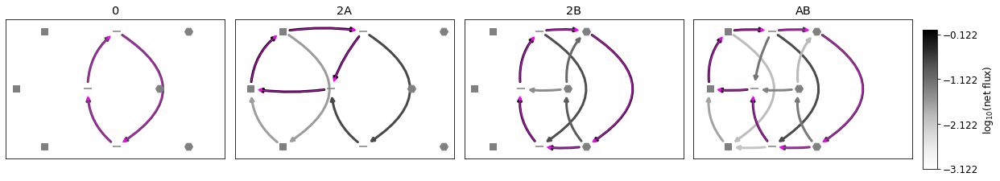

783
[ 30.65519809   4.59509732 253.23220131   4.94851257]
[30.65519809  4.59509732  1.1630695   4.94851257]
[2320.86077587    4.59509732  253.23220131    4.94851257]
30.655198092969933,4.595097317159472,253.23220131452308,4.948512567353887,30.655198092969933,4.595097317159472,1.163069495462992,4.948512567353887,2320.860775874968,4.595097317159472,253.23220131452308,4.948512567353887,138.19359874061857,190.4865785125617,138.19359874061857,190.4865785125617,138.19359874061857,190.4865785125617,138.19359874061857,190.4865785125617,138.19359874061857,190.4865785125617,138.19359874061857,190.4865785125617
[0.7312409997099089, -0.23819688481995668, [0.4713319189678973, 1.0172209394679392, 1.9917974577228734, 1.6886543632557158]]
0 0 0.4713319189678973
2 0 1.017220939467939
0 2 1.9917974577228734
1 1 1.6886543632557156


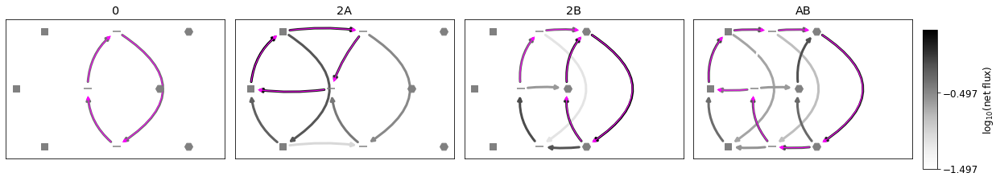

372
[5.23727324e+00 1.47546845e+02 7.31204735e+03 5.25129470e+03]
[5.23727324e+00 1.47546845e+02 9.45337017e+01 5.25129470e+03]
[4017.29803029  147.54684466 7312.04735101 5251.29469837]
5.237273241743433,147.5468446608848,7312.04735100792,5251.294698365615,5.237273241743433,147.5468446608848,94.53370173845376,5251.294698365615,4017.298030293531,147.5468446608848,7312.04735100792,5251.294698365615,8.213502326063953,813.9135980853115,8.213502326063953,813.9135980853115,8.213502326063953,813.9135980853115,8.213502326063953,813.9135980853115,8.213502326063953,813.9135980853115,8.213502326063953,813.9135980853115
[1.7680854020623695, -0.7397648605927694, [2.156214322986672, 2.2084720012559327, 12.561168788003206, 7.522091961787979]]
0 0 2.156214322986672
2 0 2.2084720012559322
0 2 12.561168788003208
1 1 7.522091961787979


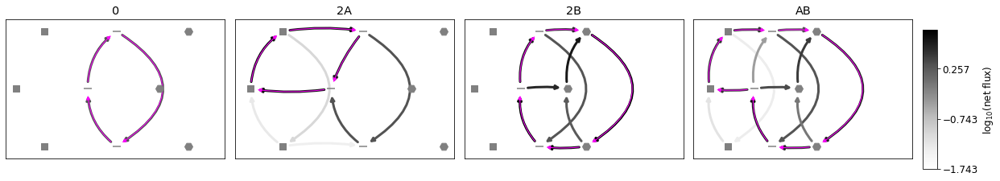

1021
[7.15115859e+00 3.09667578e+00 3.32909685e+03 1.09477343e+03]
[   7.15115859    3.09667578   70.10544572 1094.77342985]
[6.63872860e+03 3.09667578e+00 3.32909685e+03 1.09477343e+03]
7.151158593103821,3.096675776846692,3329.0968525495164,1094.7734298526948,7.151158593103821,3.096675776846692,70.10544572074784,1094.7734298526948,6638.7285987277655,3.096675776846692,3329.0968525495164,1094.7734298526948,1470.8553796096596,4322.930601615148,1470.8553796096596,4322.930601615148,1470.8553796096596,4322.930601615148,1470.8553796096596,4322.930601615148,1470.8553796096596,4322.930601615148,1470.8553796096596,4322.930601615148
[1.0645901739626562, -0.010862188232662431, [1.1249736902693575, 1.4559398101563972, 3.068222434746278, 3.0452082428371567]]
0 0 1.1249736902693575
2 0 1.4559398101563972
0 2 3.0682224347462785
1 1 3.0452082428371563


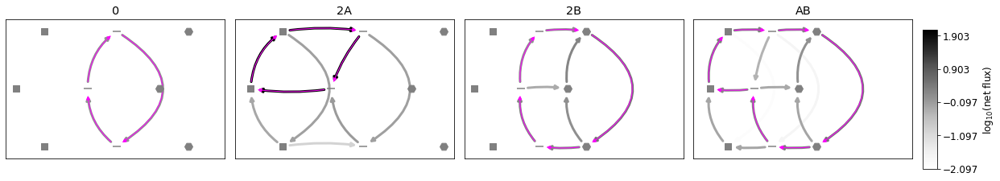

4355
[  2.96387782  10.79568547 203.90420633  40.80471605]
[ 2.96387782 10.79568547 37.80197584 40.80471605]
[264.94928482  10.79568547 203.90420633  40.80471605]
2.9638778217418094,10.795685468265534,203.90420632786152,40.804716052921,2.9638778217418094,10.795685468265534,37.80197583694801,40.804716052921,264.9492848171031,10.795685468265534,203.90420632786152,40.804716052921,1123.954399029565,9056.866184636345,1123.954399029565,9056.866184636345,1123.954399029565,9056.866184636345,1123.954399029565,9056.866184636345,1123.954399029565,9056.866184636345,1123.954399029565,9056.866184636345
[2.568812945375843, -0.4630785342213197, [0.4671752259876102, 0.5364110367473476, 4.387205564140004, 3.1826395455927976]]
0 0 0.46717522598761013
2 0 0.5364110367473476
0 2 4.387205564140005
1 1 3.182639545592798


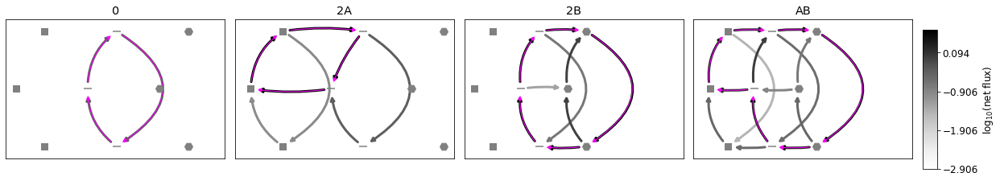

2918
[  1.18806617   5.9772995   83.77318968 131.42417387]
[  1.18806617   5.9772995    6.82975762 131.42417387]
[ 54.75717005   5.9772995   83.77318968 131.42417387]
1.18806616609058,5.977299496873438,83.77318967590675,131.42417386626755,1.18806616609058,5.977299496873438,6.829757618521287,131.42417386626755,54.757170053507394,5.977299496873438,83.77318967590675,131.42417386626755,1305.0462319556302,1372.7853334097956,1305.0462319556302,1372.7853334097956,1305.0462319556302,1372.7853334097956,1305.0462319556302,1372.7853334097956,1305.0462319556302,1372.7853334097956,1305.0462319556302,1372.7853334097956
[2.2694942648904775, -0.2099543247504769, [0.6438583863139163, 0.81423309404276, 4.54084992008375, 3.925858107100074]]
0 0 0.6438583863139163
2 0 0.8142330940427601
0 2 4.54084992008375
1 1 3.9258581071000735


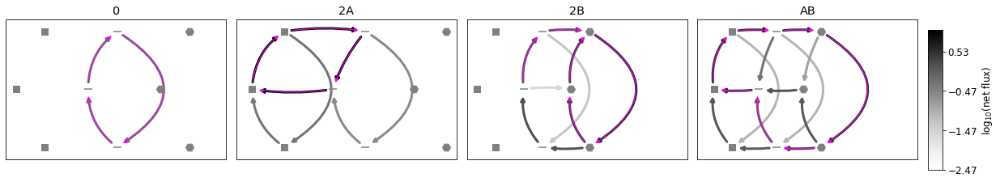

1131
[  19.6917751   171.93106509 2288.1532087  3910.56232975]
[  19.6917751   171.93106509   24.06363669 3910.56232975]
[5693.85391205  171.93106509 2288.1532087  3910.56232975]
19.69177510035449,171.93106509162587,2288.153208697063,3910.5623297526663,19.69177510035449,171.93106509162587,24.06363669177964,3910.5623297526663,5693.85391205489,171.93106509162587,2288.153208697063,3910.5623297526663,190.37851337311088,2122.664033438097,190.37851337311088,2122.664033438097,190.37851337311088,2122.664033438097,190.37851337311088,2122.664033438097,190.37851337311088,2122.664033438097,190.37851337311088,2122.664033438097
[2.476468276322342, -0.5136598158663234, [11.55153000705608, 12.370104695362864, 98.28599123118804, 68.84376442248775]]
0 0 11.55153000705608
2 0 12.370104695362862
0 2 98.28599123118804
1 1 68.84376442248775


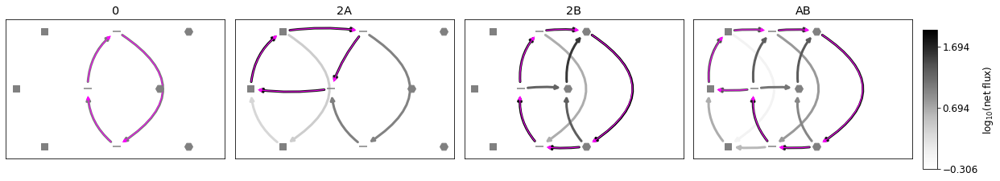

617
[  26.58901806  225.63450686 6329.10936579 8464.2438025 ]
[  26.58901806  225.63450686 2358.01329777 8464.2438025 ]
[2285.18031836  225.63450686 6329.10936579 8464.2438025 ]
26.58901805972073,225.63450685867247,6329.109365786811,8464.243802498131,26.58901805972073,225.63450685867247,2358.013297769969,8464.243802498131,2285.180318364615,225.63450685867247,6329.109365786811,8464.243802498131,1720.5638835855596,7165.497051814829,1720.5638835855596,7165.497051814829,1720.5638835855596,7165.497051814829,1720.5638835855596,7165.497051814829,1720.5638835855596,7165.497051814829,1720.5638835855596,7165.497051814829
[2.7329194470669846, -0.43904018563222436, [14.228396877369665, 15.653670148577858, 141.08185869407734, 104.06553170064417]]
0 0 14.228396877369667
2 0 15.653670148577858
0 2 141.08185869407737
1 1 104.06553170064417


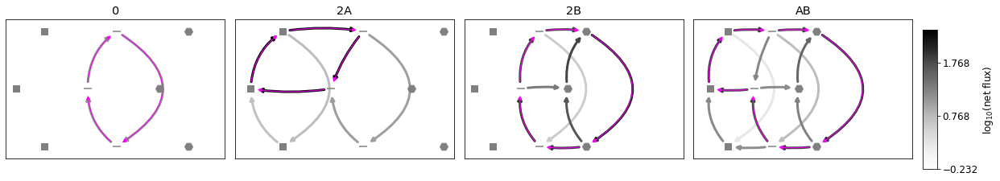

567
[1.64990810e+00 6.52083980e+00 2.73082124e+02 1.96964644e+03]
[1.64990810e+00 6.52083980e+00 1.20245694e+01 1.96964644e+03]
[  94.07033367    6.5208398   273.08212413 1969.64644356]
1.649908096336503,6.520839804251861,273.0821241348767,1969.646443557676,1.649908096336503,6.520839804251861,12.024569412244022,1969.646443557676,94.07033366643674,6.520839804251861,273.0821241348767,1969.646443557676,171.89267388118404,3943.65971784386,171.89267388118404,3943.65971784386,171.89267388118404,3943.65971784386,171.89267388118404,3943.65971784386,171.89267388118404,3943.65971784386,171.89267388118404,3943.65971784386
[1.1826083382688042, -0.39012170522979617, [1.184850048929806, 1.1943129252023865, 3.5526878486827447, 2.710932569873411]]
0 0 1.184850048929806
2 0 1.1943129252023867
0 2 3.5526878486827447
1 1 2.7109325698734104


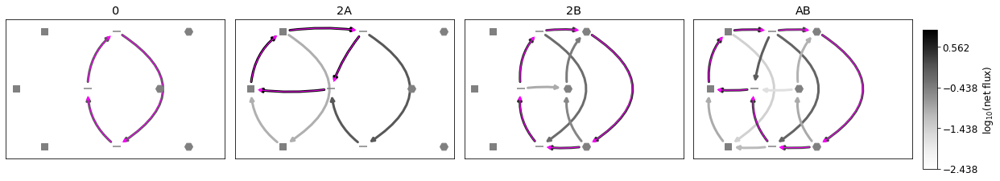

974
[  1.40950604 951.21567824  71.54169639 762.39993046]
[  1.40950604 951.21567824   4.82162632 762.39993046]
[ 30.38218027 951.21567824  71.54169639 762.39993046]
1.4095060441363902,951.2156782439326,71.54169639232714,762.3999304626573,1.4095060441363902,951.2156782439326,4.821626321713008,762.3999304626573,30.382180271493706,951.2156782439326,71.54169639232714,762.3999304626573,1591.1529987149486,3893.745589037284,1591.1529987149486,3893.745589037284,1591.1529987149486,3893.745589037284,1591.1529987149486,3893.745589037284,1591.1529987149486,3893.745589037284,1591.1529987149486,3893.745589037284
[2.4331235430196787, -0.8279588354360611, [1.2846765187762152, 1.3327057662368433, 12.776676272206315, 7.197429944345124]]
0 0 1.2846765187762152
2 0 1.3327057662368431
0 2 12.776676272206316
1 1 7.197429944345123


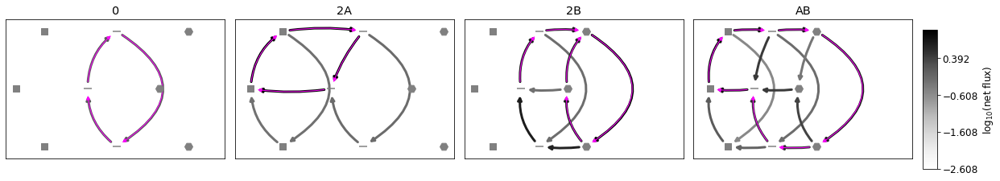

539
[   3.43061052   40.65569722  701.26817218 1715.39131529]
[   3.43061052   40.65569722    7.73781952 1715.39131529]
[ 573.36276912   40.65569722  701.26817218 1715.39131529]
3.4306105179499866,40.65569721535402,701.2681721773332,1715.391315289212,3.4306105179499866,40.65569721535402,7.737819522519541,1715.391315289212,573.3627691166727,40.65569721535402,701.2681721773332,1715.391315289212,45.573017899815206,4891.638264382622,45.573017899815206,4891.638264382622,45.573017899815206,4891.638264382622,45.573017899815206,4891.638264382622,45.573017899815206,4891.638264382622,45.573017899815206,4891.638264382622
[1.133484760557956, -0.5556731200411087, [2.2944290348476217, 2.3069954346573844, 7.439331723783951, 5.061271651593148]]
0 0 2.2944290348476213
2 0 2.306995434657384
0 2 7.43933172378395
1 1 5.061271651593149


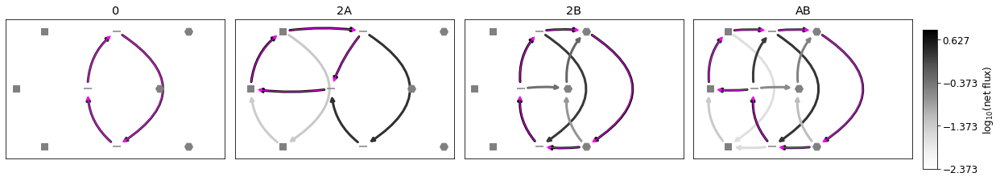

1837
[  7.42770645   6.91752096 723.01906326   1.0747884 ]
[  7.42770645   6.91752096 325.00143451   1.0747884 ]
[134.83445159   6.91752096 723.01906326   1.0747884 ]
7.427706445808625,6.917520964832038,723.0190632574864,1.074788402650903,7.427706445808625,6.917520964832038,325.0014345133826,1.074788402650903,134.83445158848377,6.917520964832038,723.0190632574864,1.074788402650903,1774.4104316200069,2911.41077363114,1774.4104316200069,2911.41077363114,1774.4104316200069,2911.41077363114,1774.4104316200069,2911.41077363114,1774.4104316200069,2911.41077363114,1774.4104316200069,2911.41077363114
[2.0749568806989305, -0.6193242268871235, [0.010895971672635656, 0.015701434536126, 0.10162457982205385, 0.06615514011997367]]
0 0 0.010895971672635656
2 0 0.015701434536126
0 2 0.10162457982205386
1 1 0.06615514011997367


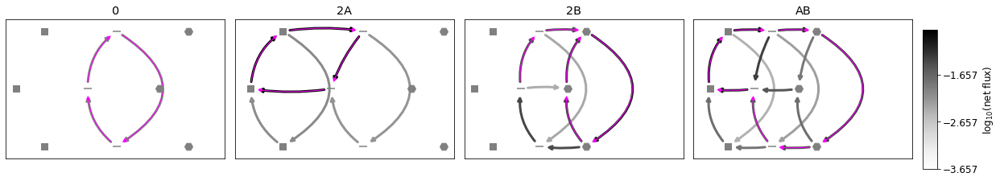

3671
[  10.07682049   40.36459217 1984.39421952 1542.41448842]
[  10.07682049   40.36459217    5.42027392 1542.41448842]
[2333.70696244   40.36459217 1984.39421952 1542.41448842]
10.076820485493654,40.364592167549446,1984.394219516588,1542.414488415748,10.076820485493654,40.364592167549446,5.420273919327321,1542.414488415748,2333.7069624373903,40.364592167549446,1984.394219516588,1542.414488415748,623.2954974022251,4561.393230206715,623.2954974022251,4561.393230206715,623.2954974022251,4561.393230206715,623.2954974022251,4561.393230206715,623.2954974022251,4561.393230206715,623.2954974022251,4561.393230206715
[2.5885353292721374, -0.23580824909312728, [3.962994669902819, 4.554647817833485, 32.260191160187425, 27.395648181250206]]
0 0 3.962994669902819
2 0 4.554647817833485
0 2 32.26019116018743
1 1 27.3956481812502


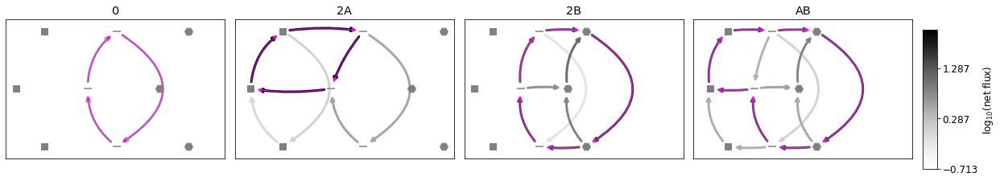

658
[2.16740551e+01 1.08711963e+01 1.93317780e+03 1.08820571e+00]
[21.6740551  10.87119628  2.92956134  1.08820571]
[2.28539949e+03 1.08711963e+01 1.93317780e+03 1.08820571e+00]
21.674055098935693,10.87119627689253,1933.1778004210744,1.088205706590741,21.674055098935693,10.87119627689253,2.9295613409149004,1.088205706590741,2285.3994892086102,10.87119627689253,1933.1778004210744,1.088205706590741,220.22465517623283,5169.208171239583,220.22465517623283,5169.208171239583,220.22465517623283,5169.208171239583,220.22465517623283,5169.208171239583,220.22465517623283,5169.208171239583,220.22465517623283,5169.208171239583
[1.898295195052997, -0.7320300490684089, [0.01204520424054367, 0.013401262194155177, 0.08297600113484169, 0.049956211835631745]]
0 0 0.01204520424054367
2 0 0.013401262194155177
0 2 0.0829760011348417
1 1 0.04995621183563174


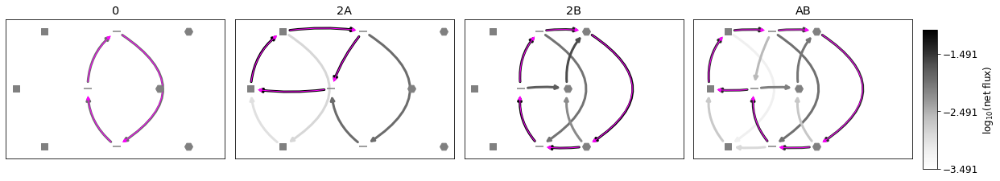

4849
[  1.08077507  12.14047771  62.28847182 913.60872474]
[  1.08077507  12.14047771   4.57854016 913.60872474]
[ 42.85493579  12.14047771  62.28847182 913.60872474]
1.0807750741359987,12.14047770868285,62.28847182318172,913.6087247378722,1.0807750741359987,12.14047770868285,4.5785401621379815,913.6087247378722,42.85493578520928,12.14047770868285,62.28847182318172,913.6087247378722,453.0783223287704,469.4119041373591,453.0783223287704,469.4119041373591,453.0783223287704,469.4119041373591,453.0783223287704,469.4119041373591,453.0783223287704,469.4119041373591,453.0783223287704,469.4119041373591
[2.7073925339572393, -0.38427025509597895, [0.9330024807316329, 0.9680708620968087, 8.252592189107407, 6.3228592058444715]]
0 0 0.9330024807316328
2 0 0.9680708620968088
0 2 8.252592189107407
1 1 6.322859205844471


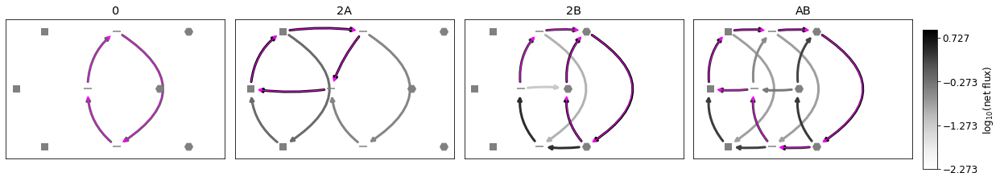

263
[  7.26200566 462.88147674 122.25589901   9.34147046]
[  7.26200566 462.88147674  17.42899893   9.34147046]
[235.68258007 462.88147674 122.25589901   9.34147046]
7.262005663036126,462.8814767417804,122.25589900962214,9.341470455435696,7.262005663036126,462.8814767417804,17.428998926290582,9.341470455435696,235.68258006884392,462.8814767417804,122.25589900962214,9.341470455435696,200.54311278243205,835.4278566658919,200.54311278243205,835.4278566658919,200.54311278243205,835.4278566658919,200.54311278243205,835.4278566658919,200.54311278243205,835.4278566658919,200.54311278243205,835.4278566658919
[1.8324785592403647, -0.5092396723793912, [0.4880209862821099, 0.6576143741535767, 3.333486698908393, 2.342083153309007]]
0 0 0.48802098628210977
2 0 0.6576143741535767
0 2 3.333486698908393
1 1 2.342083153309007


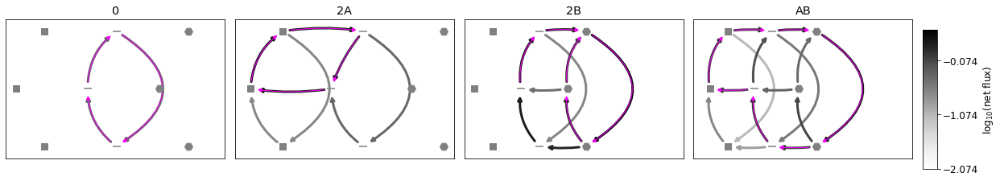

2124
[  1.53827744   6.1784308  450.56941534 422.50916853]
[  1.53827744   6.1784308  101.40285664 422.50916853]
[409.38168671   6.1784308  450.56941534 422.50916853]
1.5382774397796692,6.178430801228402,450.5694153387348,422.5091685292728,1.5382774397796692,6.178430801228402,101.40285664279564,422.5091685292728,409.3816867140605,6.178430801228402,450.5694153387348,422.5091685292728,16.285458311650267,213.3855310436959,16.285458311650267,213.3855310436959,16.285458311650267,213.3855310436959,16.285458311650267,213.3855310436959,16.285458311650267,213.3855310436959,16.285458311650267,213.3855310436959
[2.2384464633373087, -0.3700695517879852, [0.6633280792025281, 0.7091537217602512, 4.324958566219814, 3.346415904454316]]
0 0 0.6633280792025282
2 0 0.709153721760251
0 2 4.324958566219815
1 1 3.3464159044543167


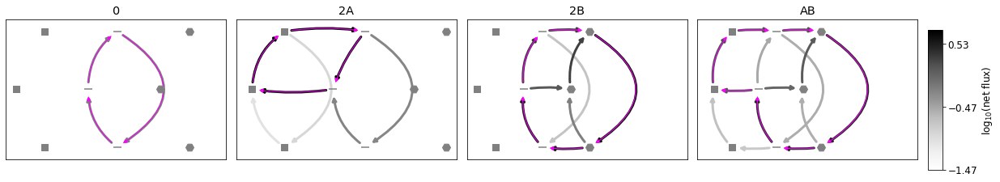

520
[ 18.15339718   3.60756261 795.67889581  17.75912808]
[18.15339718  3.60756261 26.81122451 17.75912808]
[424.44422475   3.60756261 795.67889581  17.75912808]
18.15339717935284,3.60756260904558,795.6788958113236,17.759128082090854,18.15339717935284,3.60756260904558,26.811224508955004,17.759128082090854,424.4442247477622,3.60756260904558,795.6788958113236,17.759128082090854,798.523026799433,3701.414758926111,798.523026799433,3701.414758926111,798.523026799433,3701.414758926111,798.523026799433,3701.414758926111,798.523026799433,3701.414758926111,798.523026799433,3701.414758926111
[1.269093640341851, -0.3524190898767402, [0.35005851201434834, 0.4833770214470894, 1.4873390190197908, 1.1649874699474403]]
0 0 0.35005851201434834
2 0 0.4833770214470893
0 2 1.4873390190197906
1 1 1.1649874699474403


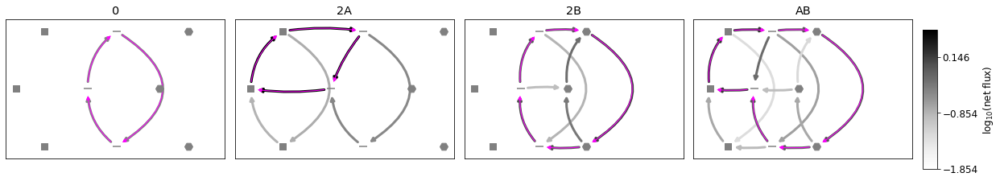

1379
[ 1.94969426  2.32128959 22.25764292 87.78694582]
[ 1.94969426  2.32128959  2.59233433 87.78694582]
[13.10601558  2.32128959 22.25764292 87.78694582]
1.949694261344715,2.3212895864516723,22.257642920698675,87.78694581686796,1.949694261344715,2.3212895864516723,2.5923343272803474,87.78694581686796,13.10601557566626,2.3212895864516723,22.257642920698675,87.78694581686796,5463.317367405837,6013.579915151265,5463.317367405837,6013.579915151265,5463.317367405837,6013.579915151265,5463.317367405837,6013.579915151265,5463.317367405837,6013.579915151265,5463.317367405837,6013.579915151265
[0.6252643806002707, -0.17818156056975157, [0.9215495113908505, 0.989130063430888, 1.7262938769096878, 1.5257266624749295]]
0 0 0.9215495113908506
2 0 0.989130063430888
0 2 1.726293876909688
1 1 1.5257266624749297


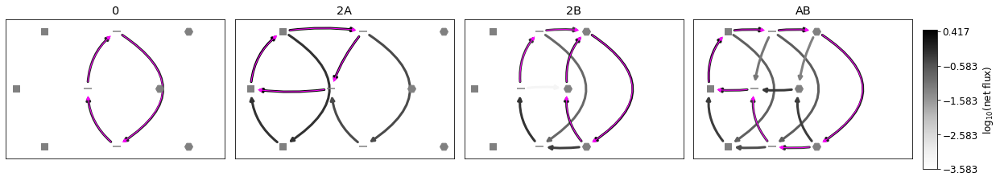

1805
[  1.31338283  25.44788722 109.41068823 523.37857847]
[  1.31338283  25.44788722  42.40488454 523.37857847]
[ 43.1843408   25.44788722 109.41068823 523.37857847]
1.3133828276723034,25.44788722134977,109.41068822511112,523.3785784683752,1.3133828276723034,25.44788722134977,42.40488453973391,523.3785784683752,43.18434079683723,25.44788722134977,109.41068822511112,523.3785784683752,668.2505180108824,2967.0891028214696,668.2505180108824,2967.0891028214696,668.2505180108824,2967.0891028214696,668.2505180108824,2967.0891028214696,668.2505180108824,2967.0891028214696,668.2505180108824,2967.0891028214696
[2.254112244489134, -0.6297411256626381, [1.0397538689322954, 1.0738739152615784, 7.926467091042246, 5.122815236372201]]
0 0 1.0397538689322954
2 0 1.0738739152615784
0 2 7.926467091042246
1 1 5.122815236372201


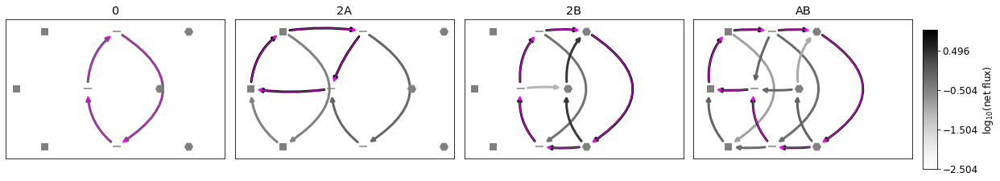

1765
[  17.80764095   46.53173593  350.38196442 2415.62875663]
[  17.80764095   46.53173593   19.15853109 2415.62875663]
[ 267.41173422   46.53173593  350.38196442 2415.62875663]
17.807640950587754,46.53173592740018,350.3819644168133,2415.6287566304877,17.807640950587754,46.53173592740018,19.158531091887237,2415.6287566304877,267.41173422139093,46.53173592740018,350.3819644168133,2415.6287566304877,686.5025807880048,2945.567269312272,686.5025807880048,2945.567269312272,686.5025807880048,2945.567269312272,686.5025807880048,2945.567269312272,686.5025807880048,2945.567269312272,686.5025807880048,2945.567269312272
[0.981578391923561, -0.3158230942063921, [11.600172659648369, 11.95067619238386, 29.373063417508728, 23.598098972485424]]
0 0 11.600172659648369
2 0 11.95067619238386
0 2 29.373063417508728
1 1 23.598098972485428


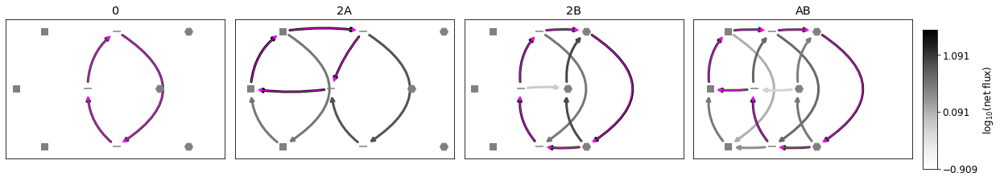

3024
[   7.0551358    11.44015778 5158.69979031 2337.57648975]
[   7.0551358    11.44015778  182.19214395 2337.57648975]
[6115.68343987   11.44015778 5158.69979031 2337.57648975]
7.055135803014365,11.44015777796714,5158.699790305705,2337.5764897506037,7.055135803014365,11.44015777796714,182.19214394966156,2337.5764897506037,6115.683439871719,11.44015777796714,5158.699790305705,2337.5764897506037,71.3051318142689,6175.840771112436,71.3051318142689,6175.840771112436,71.3051318142689,6175.840771112436,71.3051318142689,6175.840771112436,71.3051318142689,6175.840771112436,71.3051318142689,6175.840771112436
[1.8101815493792053, -0.31323251561482957, [1.8437205343936864, 1.8801462805937368, 8.192245654370417, 6.593417612289847]]
0 0 1.8437205343936862
2 0 1.8801462805937368
0 2 8.192245654370415
1 1 6.593417612289848


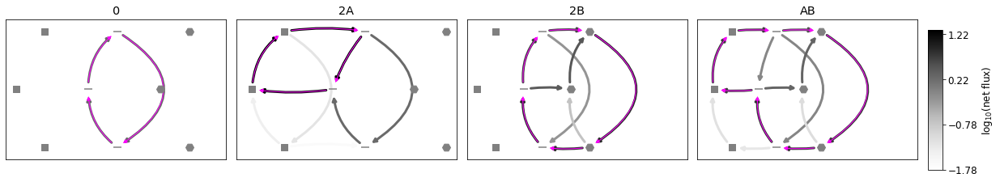

499
[   1.66349306    3.60884937  548.30131423 1018.46569014]
[   1.66349306    3.60884937    2.03357164 1018.46569014]
[ 382.19470008    3.60884937  548.30131423 1018.46569014]
1.6634930591490105,3.60884937047066,548.3013142290512,1018.4656901421416,1.6634930591490105,3.60884937047066,2.033571643680846,1018.4656901421416,382.1947000807231,3.60884937047066,548.3013142290512,1018.4656901421416,941.4817635597176,2636.57294969966,941.4817635597176,2636.57294969966,941.4817635597176,2636.57294969966,941.4817635597176,2636.57294969966,941.4817635597176,2636.57294969966,941.4817635597176,2636.57294969966
[1.8330734894620941, -0.04782105972233297, [0.8313550541388023, 0.9424167190572588, 3.470952418160973, 3.357786562287939]]
0 0 0.8313550541388022
2 0 0.9424167190572589
0 2 3.4709524181609726
1 1 3.357786562287939


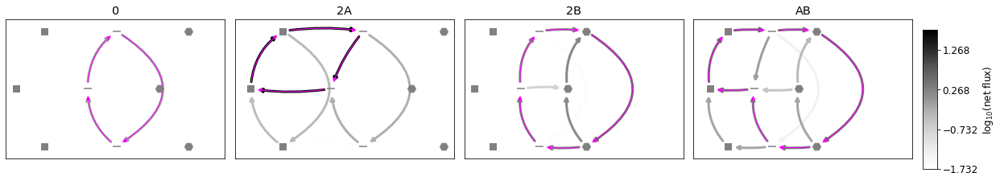

340
[   6.78083451   14.96093839  754.6996551  1103.91666257]
[   6.78083451   14.96093839    1.97213543 1103.91666257]
[ 258.90947944   14.96093839  754.6996551  1103.91666257]
6.780834511588272,14.960938390262202,754.6996550974943,1103.91666257063,6.780834511588272,14.960938390262202,1.972135429879588,1103.91666257063,258.909479440933,14.960938390262202,754.6996550974943,1103.91666257063,20.51099032311808,182.38146968915285,20.51099032311808,182.38146968915285,20.51099032311808,182.38146968915285,20.51099032311808,182.38146968915285,20.51099032311808,182.38146968915285,20.51099032311808,182.38146968915285
[0.9747873326504005, -0.37743909994362995, [3.1641271114167173, 3.4477744167354016, 8.802368786200196, 6.776088496512848]]
0 0 3.1641271114167173
2 0 3.447774416735401
0 2 8.802368786200198
1 1 6.776088496512848


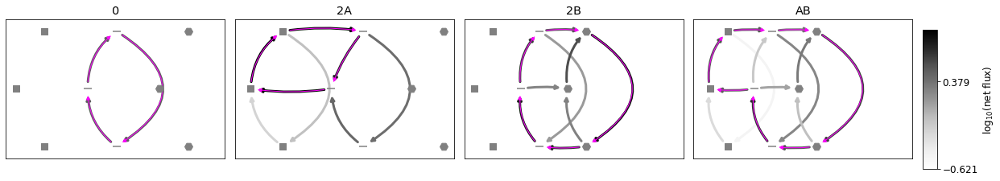

1717
[ 65.42250411  56.81708525 984.09026195   2.14794377]
[ 65.42250411  56.81708525 131.44056313   2.14794377]
[2.17474925e+03 5.68170852e+01 9.84090262e+02 2.14794377e+00]
65.42250410905397,56.81708524558436,984.0902619519652,2.147943771284296,65.42250410905397,56.81708524558436,131.44056312742234,2.147943771284296,2174.749251906335,56.81708524558436,984.0902619519652,2.147943771284296,2532.0960080646564,5866.962359457635,2532.0960080646564,5866.962359457635,2532.0960080646564,5866.962359457635,2532.0960080646564,5866.962359457635,2532.0960080646564,5866.962359457635,2532.0960080646564,5866.962359457635
[1.86293996290655, -0.38745318273065155, [0.13330740038893982, 0.2183970714462151, 1.0391605458013686, 0.7944153358509252]]
0 0 0.1333074003889398
2 0 0.21839707144621506
0 2 1.0391605458013686
1 1 0.7944153358509249


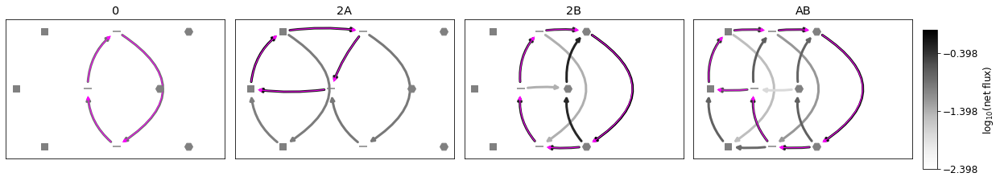

2660
[  2.57224379   2.66985367 822.31888899  35.21149898]
[  2.57224379   2.66985367 289.9560141   35.21149898]
[362.57177939   2.66985367 822.31888899  35.21149898]
2.572243793017799,2.6698536692934685,822.3188889866157,35.21149898006255,2.572243793017799,2.6698536692934685,289.9560141004165,35.21149898006255,362.57177938632447,2.6698536692934685,822.3188889866157,35.21149898006255,497.87014097255127,9382.72116425685,497.87014097255127,9382.72116425685,497.87014097255127,9382.72116425685,497.87014097255127,9382.72116425685,497.87014097255127,9382.72116425685,497.87014097255127,9382.72116425685
[2.509405913436585, -0.5981073227832185, [0.10130855126233067, 0.10773916403295329, 0.9285991835380614, 0.6134512457029848]]
0 0 0.10130855126233067
2 0 0.10773916403295328
0 2 0.9285991835380615
1 1 0.6134512457029848


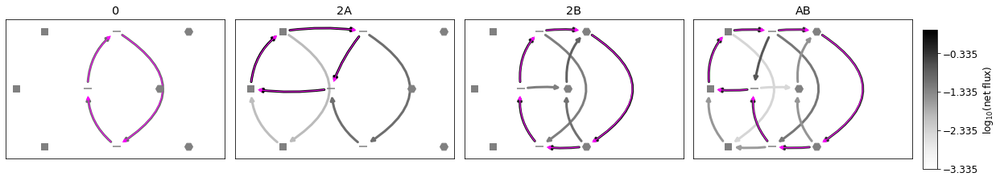

1585
[  99.32011312  517.1049996  2645.08690068 1213.02823562]
[  99.32011312  517.1049996     3.19703684 1213.02823562]
[5810.84009665  517.1049996  2645.08690068 1213.02823562]
99.32011311784515,517.1049995984499,2645.086900682357,1213.0282356175496,99.32011311784515,517.1049995984499,3.1970368406494445,1213.0282356175496,5810.840096654202,517.1049995984499,2645.086900682357,1213.0282356175496,744.9177526122644,6731.386203918963,744.9177526122644,6731.386203918963,744.9177526122644,6731.386203918963,744.9177526122644,6731.386203918963,744.9177526122644,6731.386203918963,744.9177526122644,6731.386203918963
[1.631068392568077, -0.5426098735840925, [28.750834651759593, 33.38820363722539, 150.6383023514505, 103.4173880290275]]
0 0 28.750834651759593
2 0 33.38820363722538
0 2 150.63830235145048
1 1 103.4173880290275


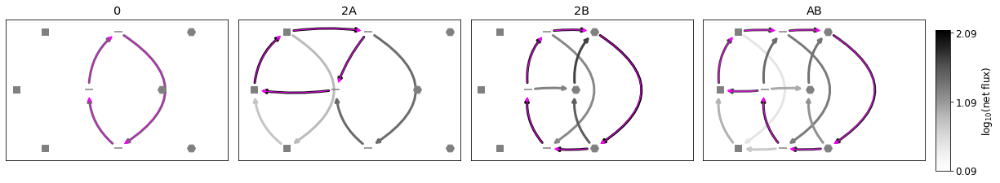

492
[   3.10335267    1.99471859 1863.94514839 1085.86124845]
[   3.10335267    1.99471859    5.12363681 1085.86124845]
[2.82444868e+03 1.99471859e+00 1.86394515e+03 1.08586125e+03]
3.1033526740616004,1.9947185866029584,1863.945148393946,1085.861248448965,3.1033526740616004,1.9947185866029584,5.123636814257347,1085.861248448965,2824.4486819806816,1.9947185866029584,1863.945148393946,1085.861248448965,12.98167723345914,4269.505350360533,12.98167723345914,4269.505350360533,12.98167723345914,4269.505350360533,12.98167723345914,4269.505350360533,12.98167723345914,4269.505350360533,12.98167723345914,4269.505350360533
[0.7628829025303822, -0.23319462180605688, [0.7258961670067543, 0.7282616056940249, 1.4525685175140668, 1.23577114747992]]
0 0 0.7258961670067544
2 0 0.7282616056940249
0 2 1.452568517514067
1 1 1.23577114747992


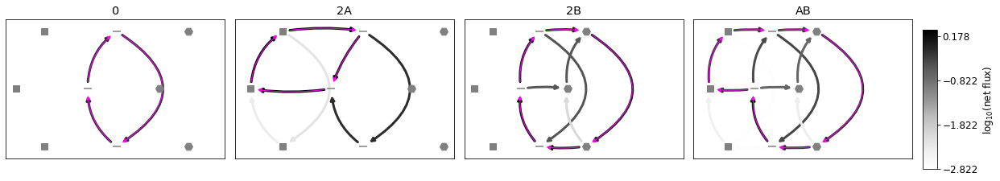

2610
[  30.7885624     6.22333196 1358.99211405   30.64129398]
[ 30.7885624    6.22333196 473.57157078  30.64129398]
[ 925.08770171    6.22333196 1358.99211405   30.64129398]
30.78856239950067,6.2233319613326845,1358.9921140495717,30.641293977485194,30.78856239950067,6.2233319613326845,473.5715707779983,30.641293977485194,925.0877017117232,6.2233319613326845,1358.9921140495717,30.641293977485194,2864.936436574432,5955.067567146757,2864.936436574432,5955.067567146757,2864.936436574432,5955.067567146757,2864.936436574432,5955.067567146757,2864.936436574432,5955.067567146757,2864.936436574432,5955.067567146757
[1.7247124752099705, -0.2964287400368202, [0.6001231432139904, 0.8405573670574078, 3.4118622612227263, 2.778161879227628]]
0 0 0.6001231432139905
2 0 0.8405573670574078
0 2 3.4118622612227263
1 1 2.778161879227628


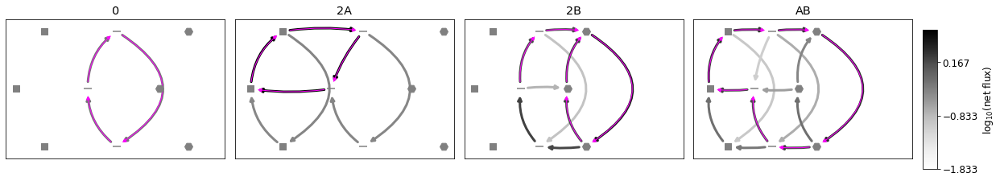

1065
[  1.05153846   4.01968948  19.65542132 588.02118245]
[  1.05153846   4.01968948   2.04192879 588.02118245]
[ 12.25666651   4.01968948  19.65542132 588.02118245]
1.0515384615199774,4.019689481944629,19.655421315065347,588.0211824546396,1.0515384615199774,4.019689481944629,2.0419287894753704,588.0211824546396,12.256666507885678,4.019689481944629,19.655421315065347,588.0211824546396,251.6824678213513,751.3220432419066,251.6824678213513,751.3220432419066,251.6824678213513,751.3220432419066,251.6824678213513,751.3220432419066,251.6824678213513,751.3220432419066,251.6824678213513,751.3220432419066
[1.1132543331388323, -0.36808678121680255, [0.8108644859998725, 0.8184923388946558, 2.285297412946928, 1.770669741622039]]
0 0 0.8108644859998726
2 0 0.8184923388946557
0 2 2.285297412946928
1 1 1.7706697416220385


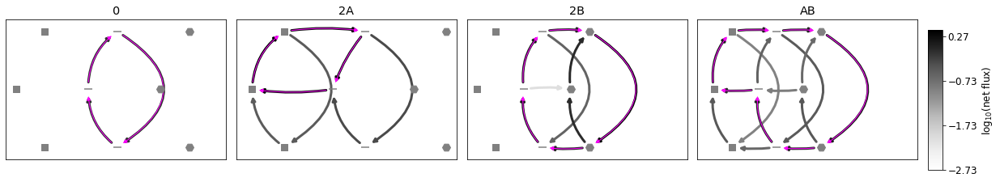

6021
[1.28223229e+00 8.91375433e+00 7.97812582e+02 4.68287519e+03]
[1.28223229e+00 8.91375433e+00 2.28861892e+00 4.68287519e+03]
[1062.3102901     8.91375433  797.81258241 4682.87519083]
1.282232289988791,8.913754332843771,797.8125824086706,4682.875190833468,1.282232289988791,8.913754332843771,2.288618919683429,4682.875190833468,1062.3102900972478,8.913754332843771,797.8125824086706,4682.875190833468,8449.57804601589,9972.795939665248,8449.57804601589,9972.795939665248,8449.57804601589,9972.795939665248,8449.57804601589,9972.795939665248,8449.57804601589,9972.795939665248,8449.57804601589,9972.795939665248
[3.020241714306998, -0.022813260411785774, [0.9754594179434776, 1.0626173874393339, 8.758459856516529, 8.621052068093706]]
0 0 0.9754594179434775
2 0 1.0626173874393339
0 2 8.75845985651653
1 1 8.621052068093706


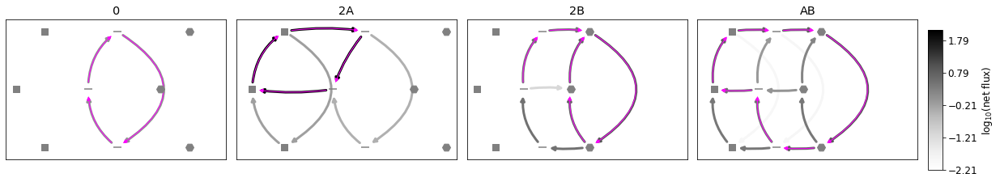

1828
[   7.26352341   14.64792483 5974.98057671 2882.45424263]
[   7.26352341   14.64792483  909.1795737  2882.45424263]
[6612.04252184   14.64792483 5974.98057671 2882.45424263]
7.263523413481174,14.647924827507795,5974.980576714113,2882.454242627249,7.263523413481174,14.647924827507795,909.1795737020908,2882.454242627249,6612.0425218353175,14.647924827507795,5974.980576714113,2882.454242627249,142.98327624175946,2881.017986382636,142.98327624175946,2881.017986382636,142.98327624175946,2881.017986382636,142.98327624175946,2881.017986382636,142.98327624175946,2881.017986382636,142.98327624175946,2881.017986382636
[2.366077530466887, -0.1742226075809556, [2.0338749300305117, 2.191668198006786, 12.749153363917848, 11.298872673507235]]
0 0 2.0338749300305117
2 0 2.191668198006786
0 2 12.749153363917848
1 1 11.298872673507235


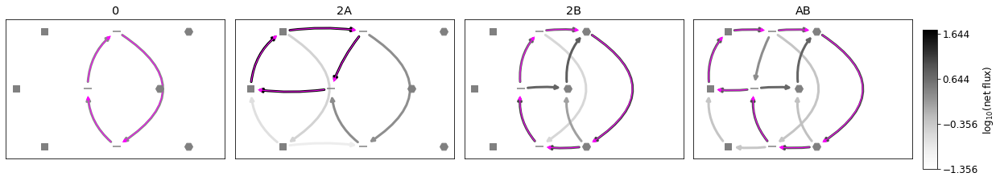

2593
[  3.57653669   1.36340053 295.00140836  14.50470691]
[ 3.57653669  1.36340053 14.26908741 14.50470691]
[143.03691728   1.36340053 295.00140836  14.50470691]
3.5765366905352334,1.3634005275184629,295.0014083596423,14.504706907710052,3.5765366905352334,1.3634005275184629,14.269087410740868,14.504706907710052,143.03691728130187,1.3634005275184629,295.0014083596423,14.504706907710052,2094.2566718781177,4838.965485377457,2094.2566718781177,4838.965485377457,2094.2566718781177,4838.965485377457,2094.2566718781177,4838.965485377457,2094.2566718781177,4838.965485377457,2094.2566718781177,4838.965485377457
[1.7182386545812072, -0.197880881745472, [0.14774103172682684, 0.23715362974450127, 0.8950333786116823, 0.7803171478476638]]
0 0 0.14774103172682687
2 0 0.23715362974450127
0 2 0.8950333786116824
1 1 0.7803171478476639


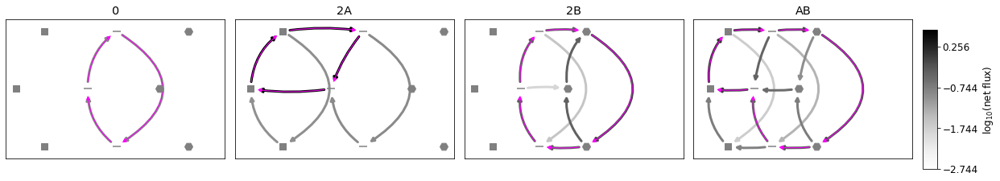

1674
[   4.70723675    6.8791684  2053.06349419  464.93543957]
[  4.70723675   6.8791684    4.33413047 464.93543957]
[2172.64009649    6.8791684  2053.06349419  464.93543957]
4.7072367497488825,6.879168399002682,2053.063494194188,464.9354395669275,4.7072367497488825,6.879168399002682,4.334130470372927,464.9354395669275,2172.6400964863624,6.879168399002682,2053.063494194188,464.9354395669275,112.72731174139729,7064.82808744994,112.72731174139729,7064.82808744994,112.72731174139729,7064.82808744994,112.72731174139729,7064.82808744994,112.72731174139729,7064.82808744994,112.72731174139729,7064.82808744994
[1.9983490118776774, -0.4030713398864367, [0.7703897114996345, 0.7925484656556009, 4.187216219869121, 3.166568038316442]]
0 0 0.7703897114996345
2 0 0.7925484656556007
0 2 4.1872162198691205
1 1 3.1665680383164414


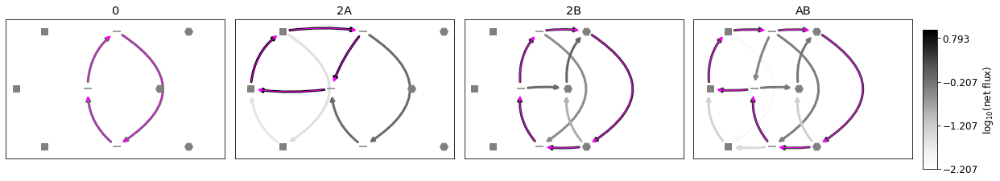

1484
[   2.09244709    9.04688109 1825.91415708 2029.58183668]
[   2.09244709    9.04688109  124.30756479 2029.58183668]
[ 828.74612246    9.04688109 1825.91415708 2029.58183668]
2.092447090644302,9.046881086010858,1825.914157077238,2029.581836675664,2.092447090644302,9.046881086010858,124.30756478925228,2029.581836675664,828.7461224553186,9.046881086010858,1825.914157077238,2029.581836675664,49.84626112800061,5644.363136237614,49.84626112800061,5644.363136237614,49.84626112800061,5644.363136237614,49.84626112800061,5644.363136237614,49.84626112800061,5644.363136237614,49.84626112800061,5644.363136237614
[1.5992857399088574, -0.48697322245222535, [0.9814614531383585, 0.9896401007981985, 4.202462156163637, 2.9985428830714698]]
0 0 0.9814614531383584
2 0 0.9896401007981985
0 2 4.202462156163636
1 1 2.9985428830714698


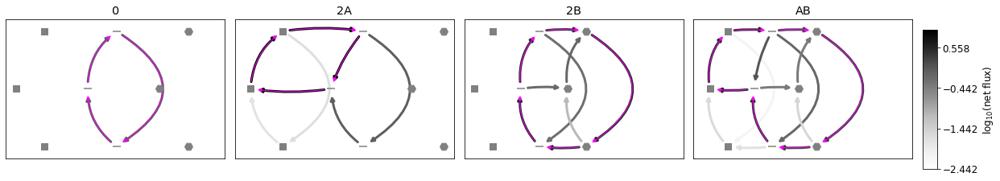

2538
[ 2.75272529 15.44931032 81.61524315 83.89828804]
[ 2.75272529 15.44931032 21.46253591 83.89828804]
[50.06725348 15.44931032 81.61524315 83.89828804]
2.7527252892386747,15.44931031781492,81.615243145801,83.89828803741408,2.7527252892386747,15.44931031781492,21.462535911122192,83.89828803741408,50.06725347717624,15.44931031781492,81.615243145801,83.89828803741408,920.0736486516432,2380.8482312947544,920.0736486516432,2380.8482312947544,920.0736486516432,2380.8482312947544,920.0736486516432,2380.8482312947544,920.0736486516432,2380.8482312947544,920.0736486516432,2380.8482312947544
[1.6408756402381448, -0.4308480325002069, [1.2605345873903204, 1.4730093068125258, 6.192363741776134, 4.59365397064743]]
0 0 1.2605345873903204
2 0 1.4730093068125258
0 2 6.192363741776134
1 1 4.59365397064743


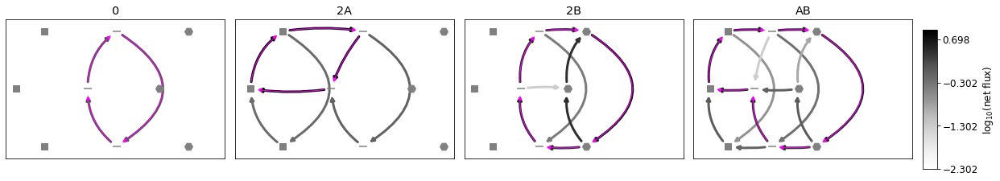

3315
[  8.55911918 799.91076655 501.87214648   9.40830014]
[  8.55911918 799.91076655  26.57511391   9.40830014]
[254.40578121 799.91076655 501.87214648   9.40830014]
8.559119177738138,799.9107665512888,501.8721464777274,9.408300140666462,8.559119177738138,799.9107665512888,26.57511391370626,9.408300140666462,254.4057812149641,799.9107665512888,501.8721464777274,9.408300140666462,2496.123729959937,9769.84099277469,2496.123729959937,9769.84099277469,2496.123729959937,9769.84099277469,2496.123729959937,9769.84099277469,2496.123729959937,9769.84099277469,2496.123729959937,9769.84099277469
[2.0906771317873645, -0.5554527511859471, [0.15487695829099976, 0.22630935486380124, 1.4166643782445052, 0.9639600477157346]]
0 0 0.15487695829099976
2 0 0.22630935486380127
0 2 1.4166643782445054
1 1 0.9639600477157346


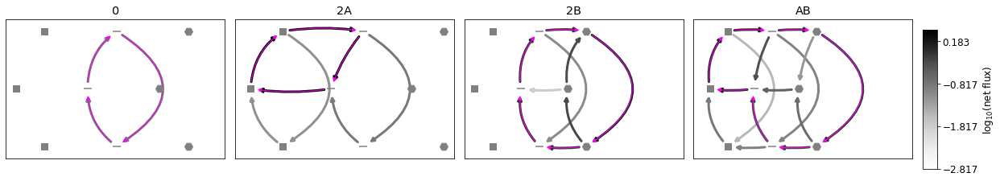

1878
[  5.45625599  74.40497199 372.77204416  37.40032152]
[  5.45625599  74.40497199 128.79385189  37.40032152]
[255.71490109  74.40497199 372.77204416  37.40032152]
5.456255987285126,74.40497198595304,372.7720441633497,37.40032152115274,5.456255987285126,74.40497198595304,128.79385188543583,37.40032152115274,255.71490108890092,74.40497198595304,372.7720441633497,37.40032152115274,726.6450707182831,5188.269879306521,726.6450707182831,5188.269879306521,726.6450707182831,5188.269879306521,726.6450707182831,5188.269879306521,726.6450707182831,5188.269879306521,726.6450707182831,5188.269879306521
[2.2942621700832486, -0.6785102132110835, [0.4877623035952672, 0.5613870650820665, 4.407132010492275, 2.753620796359034]]
0 0 0.48776230359526723
2 0 0.5613870650820666
0 2 4.407132010492276
1 1 2.7536207963590336


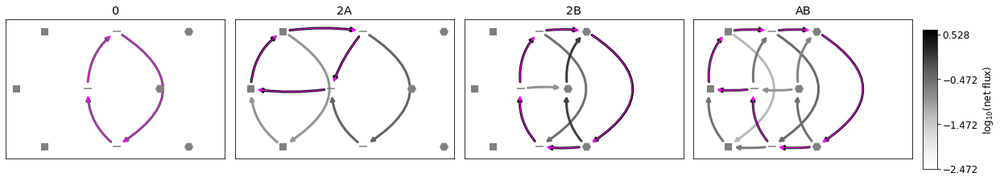

2224
[   5.99165382    7.76106483 4768.24712231 1439.04885038]
[   5.99165382    7.76106483   65.25258837 1439.04885038]
[4722.72884074    7.76106483 4768.24712231 1439.04885038]
5.991653816168074,7.761064833767177,4768.247122310526,1439.048850381356,5.991653816168074,7.761064833767177,65.25258837239997,1439.048850381356,4722.728840741472,7.761064833767177,4768.247122310526,1439.048850381356,36.48937936377586,4592.475142016808,36.48937936377586,4592.475142016808,36.48937936377586,4592.475142016808,36.48937936377586,4592.475142016808,36.48937936377586,4592.475142016808,36.48937936377586,4592.475142016808
[1.6019213551502682, -0.3860089389239241, [1.177223299839317, 1.1981704074445179, 4.752752915580913, 3.637013957559311]]
0 0 1.177223299839317
2 0 1.1981704074445176
0 2 4.7527529155809125
1 1 3.6370139575593115


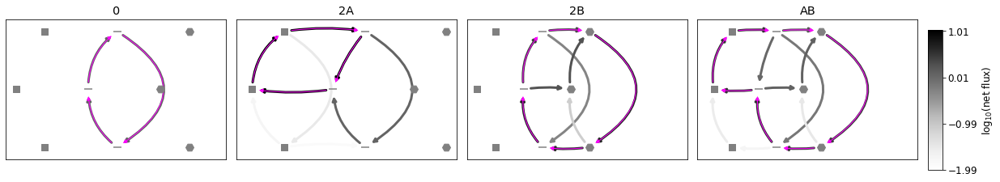

2105
[  12.33226344   24.4467195  1835.18719496  520.06669057]
[ 12.33226344  24.4467195  224.41677405 520.06669057]
[6579.91640491   24.4467195  1835.18719496  520.06669057]
12.332263436075202,24.446719500316263,1835.1871949635936,520.0666905724049,12.332263436075202,24.446719500316263,224.4167740513304,520.0666905724049,6579.916404908975,24.446719500316263,1835.1871949635936,520.0666905724049,925.0121717870876,4351.736042067058,925.0121717870876,4351.736042067058,925.0121717870876,4351.736042067058,925.0121717870876,4351.736042067058,925.0121717870876,4351.736042067058,925.0121717870876,4351.736042067058
[2.679958420556828, -0.12118225756763726, [2.4386900717900932, 3.0887516008996627, 21.528330383921727, 19.79387645362217]]
0 0 2.4386900717900932
2 0 3.0887516008996627
0 2 21.528330383921727
1 1 19.79387645362217


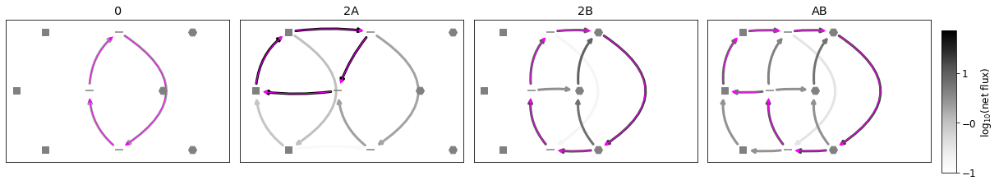

2659
[  3.23717254   4.44229382 518.70651874 251.21864401]
[  3.23717254   4.44229382 205.73241125 251.21864401]
[232.21285011   4.44229382 518.70651874 251.21864401]
3.237172536469065,4.442293818776284,518.7065187417603,251.2186440117783,3.237172536469065,4.442293818776284,205.73241124668849,251.2186440117783,232.21285010693688,4.442293818776284,518.7065187417603,251.2186440117783,1519.4131784761476,1797.3212710108603,1519.4131784761476,1797.3212710108603,1519.4131784761476,1797.3212710108603,1519.4131784761476,1797.3212710108603,1519.4131784761476,1797.3212710108603,1519.4131784761476,1797.3212710108603
[1.792741269047509, -0.09940914159225529, [0.8504633067088516, 1.0765577449715316, 3.9960541035358834, 3.7299776209838336]]
0 0 0.8504633067088515
2 0 1.0765577449715316
0 2 3.996054103535884
1 1 3.729977620983834


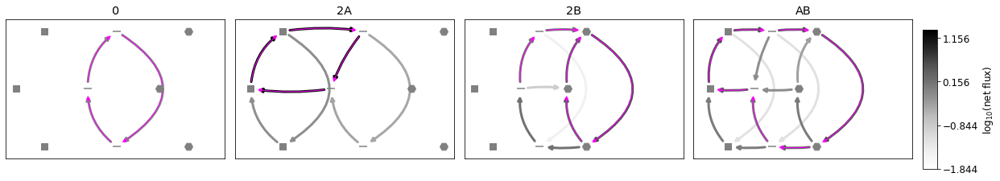

2074
[  12.45586278  117.16843552  152.81109026 1856.84221957]
[  12.45586278  117.16843552    3.49390529 1856.84221957]
[  98.48038609  117.16843552  152.81109026 1856.84221957]
12.455862779648172,117.16843551927872,152.81109025505106,1856.8422195741869,12.455862779648172,117.16843551927872,3.4939052924809366,1856.8422195741869,98.48038608713566,117.16843551927872,152.81109025505106,1856.8422195741869,6742.760843598387,7093.314775571183,6742.760843598387,7093.314775571183,6742.760843598387,7093.314775571183,6742.760843598387,7093.314775571183,6742.760843598387,7093.314775571183,6742.760843598387,7093.314775571183
[1.3778429339817022, -0.5081663683423134, [10.42059867280825, 10.902335911945018, 40.2962777248513, 28.33293800803658]]
0 0 10.420598672808248
2 0 10.902335911945016
0 2 40.2962777248513
1 1 28.332938008036578


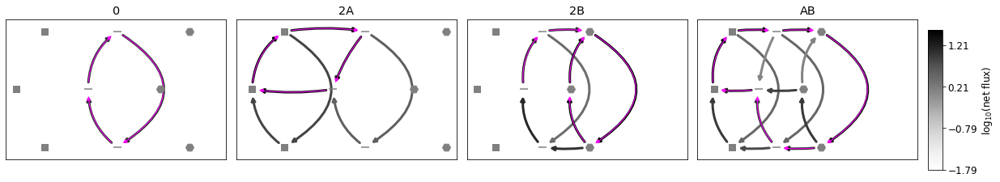

1919
[   4.14050795   25.95108275 1260.90633983 1853.46926824]
[   4.14050795   25.95108275  117.60038377 1853.46926824]
[ 241.28903409   25.95108275 1260.90633983 1853.46926824]
4.140507953830611,25.95108275335091,1260.9063398314436,1853.4692682425325,4.140507953830611,25.95108275335091,117.60038377423297,1853.4692682425325,241.289034089243,25.95108275335091,1260.9063398314436,1853.4692682425325,25.967452474576096,98.18701413129476,25.967452474576096,98.18701413129476,25.967452474576096,98.18701413129476,25.967452474576096,98.18701413129476,25.967452474576096,98.18701413129476,25.967452474576096,98.18701413129476
[1.8980769162598805, -0.5708345093837769, [2.2477355551912677, 2.6432348540721624, 14.633632630473269, 9.851760336339536]]
0 0 2.2477355551912677
2 0 2.6432348540721624
0 2 14.633632630473269
1 1 9.851760336339535


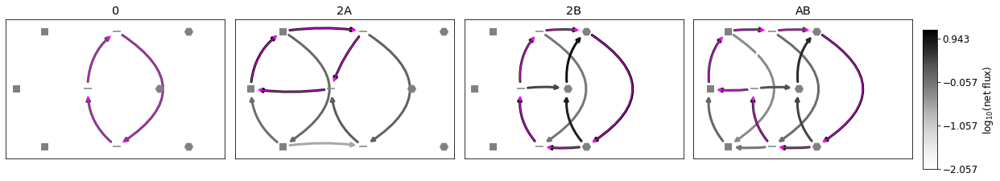

1271
[  5.50818298  47.46168796  93.59479063 203.4432672 ]
[  5.50818298  47.46168796   4.76643186 203.4432672 ]
[209.63507341  47.46168796  93.59479063 203.4432672 ]
5.508182983778562,47.46168795528134,93.59479063157973,203.4432671956338,5.508182983778562,47.46168795528134,4.766431863485026,203.4432671956338,209.6350734121859,47.46168795528134,93.59479063157973,203.4432671956338,3309.4064842609446,4258.624007166735,3309.4064842609446,4258.624007166735,3309.4064842609446,4258.624007166735,3309.4064842609446,4258.624007166735,3309.4064842609446,4258.624007166735,3309.4064842609446,4258.624007166735
[2.3931586966082503, -0.3078530477828583, [3.435777902825468, 4.120816205731072, 26.7959277732406, 21.64690428576187]]
0 0 3.435777902825468
2 0 4.120816205731073
0 2 26.7959277732406
1 1 21.646904285761867


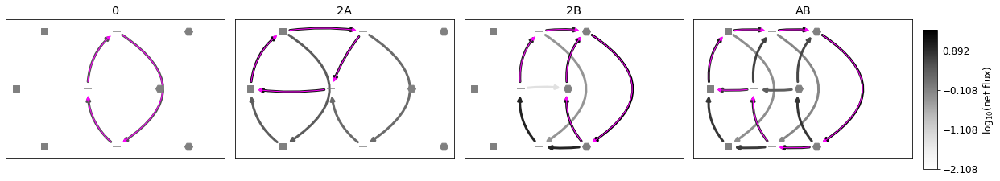

325
[ 60.60423923  36.71033736 519.66383964   6.78360378]
[60.60423923 36.71033736  2.12781103  6.78360378]
[351.11217583  36.71033736 519.66383964   6.78360378]
60.604239228005234,36.710337360512575,519.663839639487,6.7836037788797565,60.604239228005234,36.710337360512575,2.127811026839729,6.7836037788797565,351.11217582637033,36.710337360512575,519.663839639487,6.7836037788797565,300.0105340673288,665.4956546391902,300.0105340673288,665.4956546391902,300.0105340673288,665.4956546391902,300.0105340673288,665.4956546391902,300.0105340673288,665.4956546391902,300.0105340673288,665.4956546391902
[0.2253660005011633, -0.1366419819703951, [0.6871955713271826, 1.3235173747190623, 1.7010023294066572, 1.5472894811562243]]
0 0 0.6871955713271826
2 0 1.3235173747190623
0 2 1.701002329406657
1 1 1.5472894811562241


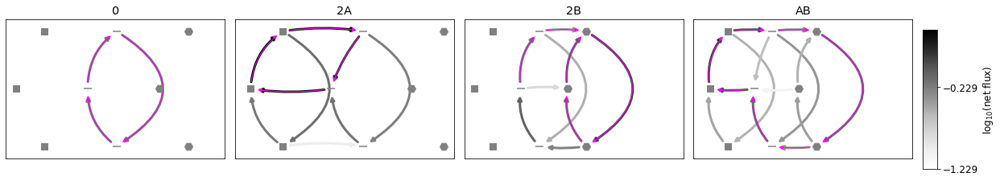

2818
[1.00325806e+00 3.91872917e+00 1.17322284e+03 3.28856078e+03]
[1.00325806e+00 3.91872917e+00 3.72301001e+01 3.28856078e+03]
[ 420.06671943    3.91872917 1173.22283546 3288.56078435]
1.003258059569439,3.918729170994232,1173.222835462985,3288.5607843452044,1.003258059569439,3.918729170994232,37.23010006285384,3288.5607843452044,420.0667194288338,3.918729170994232,1173.222835462985,3288.5607843452044,194.56690996903575,272.15540396315936,194.56690996903575,272.15540396315936,194.56690996903575,272.15540396315936,194.56690996903575,272.15540396315936,194.56690996903575,272.15540396315936,194.56690996903575,272.15540396315936
[2.339851765263271, -0.06197970898875203, [0.6219518302563062, 0.7220690263753933, 3.8159443658380368, 3.6554789115111053]]
0 0 0.6219518302563061
2 0 0.7220690263753933
0 2 3.8159443658380363
1 1 3.655478911511105


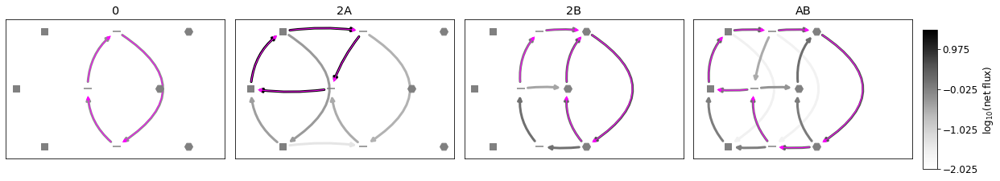

3141
[  3.22567578   1.69654451 823.24963117  77.08253268]
[ 3.22567578  1.69654451 21.93277361 77.08253268]
[1.90160268e+03 1.69654451e+00 8.23249631e+02 7.70825327e+01]
3.225675784698609,1.696544507167542,823.249631166845,77.08253268000794,3.225675784698609,1.696544507167542,21.932773609800712,77.08253268000794,1901.602679158873,1.696544507167542,823.249631166845,77.08253268000794,2222.730213581261,3201.879396900435,2222.730213581261,3201.879396900435,2222.730213581261,3201.879396900435,2222.730213581261,3201.879396900435,2222.730213581261,3201.879396900435,2222.730213581261,3201.879396900435
[1.868955648456142, -0.01974918764740583, [0.23677683707923872, 0.43985741553561075, 1.62880362325817, 1.6066586955897224]]
0 0 0.23677683707923874
2 0 0.43985741553561075
0 2 1.6288036232581702
1 1 1.6066586955897222


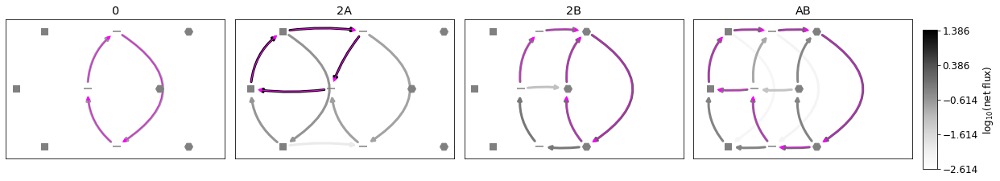

412
[  89.74785746   61.3927136  1941.0145972  2487.8328622 ]
[  89.74785746   61.3927136     5.43271159 2487.8328622 ]
[4110.62308261   61.3927136  1941.0145972  2487.8328622 ]
89.74785746406357,61.39271359805793,1941.0145972011096,2487.8328621977475,89.74785746406357,61.39271359805793,5.432711594695702,2487.8328621977475,4110.623082607959,61.39271359805793,1941.0145972011096,2487.8328621977475,1038.95748132602,7463.808882076336,1038.95748132602,7463.808882076336,1038.95748132602,7463.808882076336,1038.95748132602,7463.808882076336,1038.95748132602,7463.808882076336,1038.95748132602,7463.808882076336
[0.7208608005294744, -0.1365434993067961, [27.377654615128947, 29.060569758155587, 52.65123195437244, 47.89661796097245]]
0 0 27.37765461512895
2 0 29.06056975815558
0 2 52.651231954372435
1 1 47.89661796097244


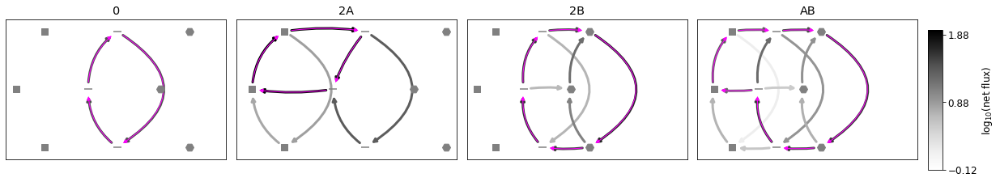

3593
[  1.39016771  11.46336106 637.20673098 783.46969789]
[  1.39016771  11.46336106  57.21448334 783.46969789]
[1268.70211564   11.46336106  637.20673098  783.46969789]
1.390167714840333,11.463361061999972,637.2067309800943,783.4696978901891,1.390167714840333,11.463361061999972,57.2144833352902,783.4696978901891,1268.7021156393305,11.463361061999972,637.2067309800943,783.4696978901891,16.150196115253568,407.8669421352369,16.150196115253568,407.8669421352369,16.150196115253568,407.8669421352369,16.150196115253568,407.8669421352369,16.150196115253568,407.8669421352369,16.150196115253568,407.8669421352369
[2.8105558165331526, -0.45101820791192226, [0.7179288164099216, 0.7473869265313018, 7.167655295907115, 5.243328916457132]]
0 0 0.7179288164099216
2 0 0.7473869265313018
0 2 7.167655295907115
1 1 5.2433289164571315


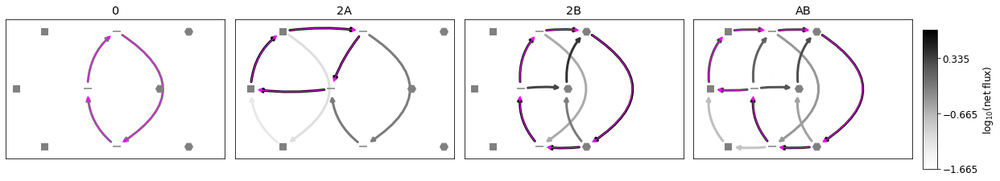

1596
[  2.59278016   1.73457568 271.17666915 142.16322639]
[  2.59278016   1.73457568   1.31466428 142.16322639]
[423.60203615   1.73457568 271.17666915 142.16322639]
2.59278016324387,1.7345756836368935,271.17666914663425,142.16322638613764,2.59278016324387,1.7345756836368935,1.314664283832911,142.16322638613764,423.60203614647554,1.7345756836368935,271.17666914663425,142.16322638613764,31.489195746066493,1256.1554185144926,31.489195746066493,1256.1554185144926,31.489195746066493,1256.1554185144926,31.489195746066493,1256.1554185144926,31.489195746066493,1256.1554185144926,31.489195746066493,1256.1554185144926
[0.9581242807968051, -0.2110721031704925, [0.5865350167383444, 0.6009981425788169, 1.351563056150371, 1.1676085805601721]]
0 0 0.5865350167383443
2 0 0.600998142578817
0 2 1.3515630561503709
1 1 1.1676085805601721


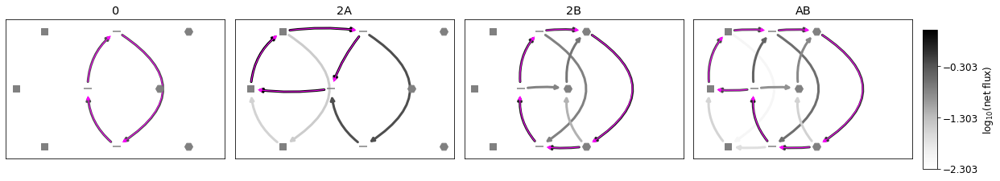

641
[  18.22270763    9.4147891  1324.57451658   11.92406478]
[18.22270763  9.4147891   1.54965133 11.92406478]
[1781.37607906    9.4147891  1324.57451658   11.92406478]
18.222707631591664,9.414789097255724,1324.5745165771298,11.924064776453443,18.222707631591664,9.414789097255724,1.5496513322641738,11.924064776453443,1781.376079064449,9.414789097255724,1324.5745165771298,11.924064776453443,126.86201009374642,1538.9421690185686,126.86201009374642,1538.9421690185686,126.86201009374642,1538.9421690185686,126.86201009374642,1538.9421690185686,126.86201009374642,1538.9421690185686,126.86201009374642,1538.9421690185686
[1.9875558947016425, -0.6696063845314352, [0.1577069384107208, 0.20029769744543124, 1.2634600265102642, 0.7943097604619006]]
0 0 0.15770693841072086
2 0 0.20029769744543122
0 2 1.2634600265102642
1 1 0.7943097604619006


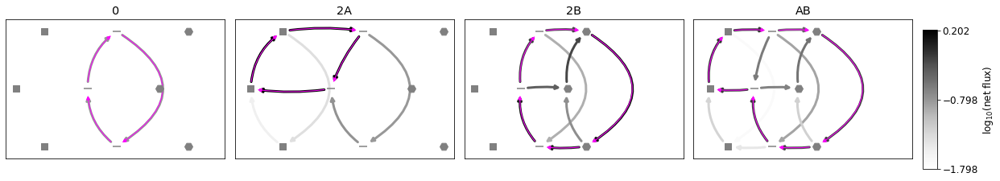

1966
[3.75695841e+00 7.35066068e+00 4.40949079e+03 2.51572852e+03]
[   3.75695841    7.35066068  808.6992455  2515.72852392]
[2315.40246941    7.35066068 4409.49079249 2515.72852392]
3.7569584107160137,7.350660678273122,4409.490792488419,2515.728523923129,3.7569584107160137,7.350660678273122,808.6992454955209,2515.728523923129,2315.402469408844,7.350660678273122,4409.490792488419,2515.728523923129,170.16940875274332,964.914239092586,170.16940875274332,964.914239092586,170.16940875274332,964.914239092586,170.16940875274332,964.914239092586,170.16940875274332,964.914239092586,170.16940875274332,964.914239092586
[2.242549918717501, -0.08727014101101935, [1.1505469995197874, 1.3842333413449373, 6.959131261701136, 6.550645508097114]]
0 0 1.1505469995197872
2 0 1.3842333413449377
0 2 6.959131261701135
1 1 6.550645508097114


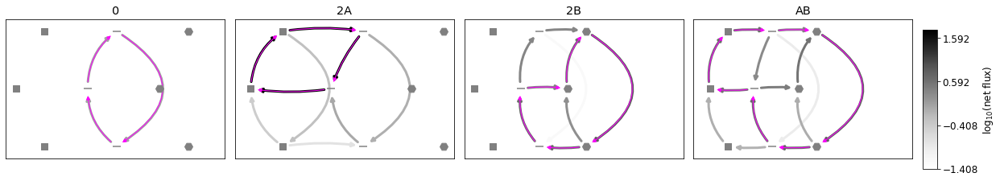

2590
[  55.79858861  396.87139302 1991.24001154  473.73533491]
[ 55.79858861 396.87139302  69.65170384 473.73533491]
[6300.95268121  396.87139302 1991.24001154  473.73533491]
55.79858860504791,396.8713930234495,1991.2400115403248,473.7353349069717,55.79858860504791,396.8713930234495,69.65170383939174,473.7353349069717,6300.952681210211,396.8713930234495,1991.2400115403248,473.7353349069717,700.1174389077152,6625.739069778808,700.1174389077152,6625.739069778808,700.1174389077152,6625.739069778808,700.1174389077152,6625.739069778808,700.1174389077152,6625.739069778808,700.1174389077152,6625.739069778808
[2.2730959937427206, -0.5965891247121874, [10.216423654452388, 12.054785064293137, 88.10910101450692, 58.2679244557272]]
0 0 10.216423654452388
2 0 12.054785064293137
0 2 88.10910101450692
1 1 58.267924455727204


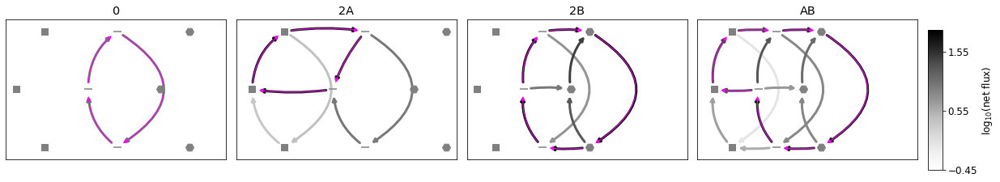

908
[ 20.69671201 167.26788777 334.67454336 476.54416859]
[ 20.69671201 167.26788777  10.23790235 476.54416859]
[1218.15150011  167.26788777  334.67454336  476.54416859]
20.696712007605065,167.26788776799808,334.67454335637643,476.5441685865477,20.696712007605065,167.26788776799808,10.237902345814431,476.5441685865477,1218.1515001060436,167.26788776799808,334.67454335637643,476.5441685865477,103.96828636510504,299.71287607314497,103.96828636510504,299.71287607314497,103.96828636510504,299.71287607314497,103.96828636510504,299.71287607314497,103.96828636510504,299.71287607314497,103.96828636510504,299.71287607314497
[1.7755712494577667, -0.6230351490482833, [11.070959354013372, 13.398952049069532, 70.65181232802486, 45.87446774645446]]
0 0 11.070959354013372
2 0 13.398952049069528
0 2 70.65181232802485
1 1 45.87446774645445


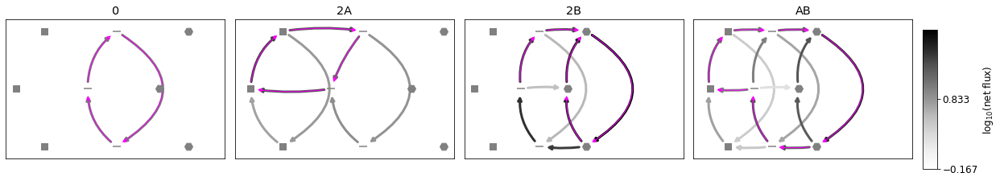

3131
[  3.324889    26.71589994 114.42039866 206.58361908]
[  3.324889    26.71589994  13.26205427 206.58361908]
[204.10851919  26.71589994 114.42039866 206.58361908]
3.324888999596547,26.7158999373151,114.42039865510436,206.5836190828332,3.324888999596547,26.7158999373151,13.26205427040736,206.5836190828332,204.10851918544589,26.7158999373151,114.42039865510436,206.5836190828332,444.7122452102556,525.1799309888754,444.7122452102556,525.1799309888754,444.7122452102556,525.1799309888754,444.7122452102556,525.1799309888754,444.7122452102556,525.1799309888754,444.7122452102556,525.1799309888754
[2.6111751318070806, -0.30864769643444395, [1.962260354605929, 2.4097853617249623, 18.236127302138467, 14.72381664397927]]
0 0 1.9622603546059287
2 0 2.4097853617249623
0 2 18.236127302138463
1 1 14.72381664397927


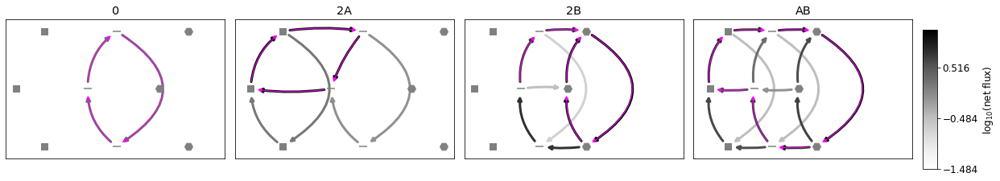

901
[  26.17479835   20.86317371 2626.29711107  365.04076445]
[ 26.17479835  20.86317371 164.63172198 365.04076445]
[5102.8287688    20.86317371 2626.29711107  365.04076445]
26.17479834806392,20.863173709821837,2626.297111065322,365.04076444850114,26.17479834806392,20.863173709821837,164.63172198351666,365.04076444850114,5102.828768803765,20.863173709821837,2626.297111065322,365.04076444850114,1222.754136229433,9103.422824456538,1222.754136229433,9103.422824456538,1222.754136229433,9103.422824456538,1222.754136229433,9103.422824456538,1222.754136229433,9103.422824456538,1222.754136229433,9103.422824456538
[2.130146410388606, -0.19185641614846058, [2.749214458636974, 3.3244450919963313, 16.62308651409836, 14.553154134034541]]
0 0 2.749214458636974
2 0 3.3244450919963313
0 2 16.62308651409836
1 1 14.553154134034544


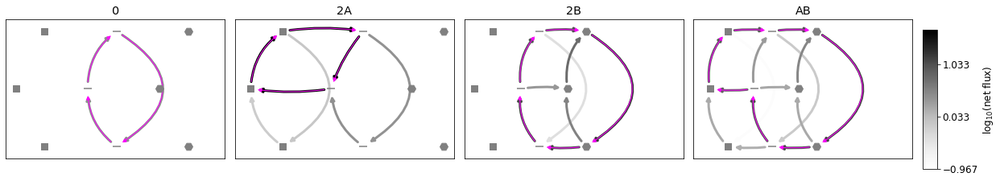

2912
[  6.25660161   5.06282928 155.48059304   4.19106475]
[6.25660161 5.06282928 2.68209662 4.19106475]
[349.21628152   5.06282928 155.48059304   4.19106475]
6.256601611999704,5.062829278643251,155.48059303808756,4.191064753252912,6.256601611999704,5.062829278643251,2.682096617279053,4.191064753252912,349.21628151687435,5.062829278643251,155.48059303808756,4.191064753252912,83.50854063256018,394.91537578734943,83.50854063256018,394.91537578734943,83.50854063256018,394.91537578734943,83.50854063256018,394.91537578734943,83.50854063256018,394.91537578734943,83.50854063256018,394.91537578734943
[1.850498318179748, -0.47450106489853394, [0.15324761385406735, 0.22253239750496673, 1.1150332063770925, 0.8025068490807133]]
0 0 0.15324761385406735
2 0 0.22253239750496673
0 2 1.1150332063770925
1 1 0.8025068490807135


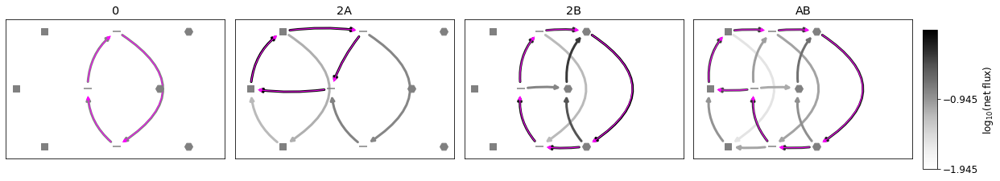

886
[1.60128476e+02 3.82382111e+00 1.83262301e+03 1.13934696e+00]
[160.12847588   3.82382111   5.89118162   1.13934696]
[6.82660736e+03 3.82382111e+00 1.83262301e+03 1.13934696e+00]
160.12847587578537,3.8238211089899674,1832.623011299192,1.1393469557667772,160.12847587578537,3.8238211089899674,5.891181616715103,1.1393469557667772,6826.607357667459,3.8238211089899674,1832.623011299192,1.1393469557667772,472.54585234584266,2601.434427983165,472.54585234584266,2601.434427983165,472.54585234584266,2601.434427983165,472.54585234584266,2601.434427983165,472.54585234584266,2601.434427983165,472.54585234584266,2601.434427983165
[1.1027235406837606, -0.4595468074734793, [0.08936209069442563, 0.1303598995162625, 0.3849765295606567, 0.2799605768560739]]
0 0 0.08936209069442563
2 0 0.1303598995162625
0 2 0.38497652956065653
1 1 0.27996057685607384


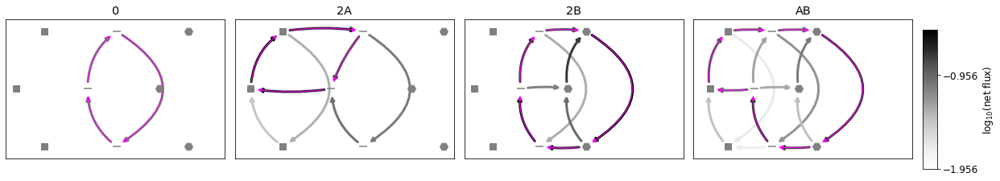

1712
[   6.02755654   12.49939385  119.82604343 3173.31311975]
[6.02755654e+00 1.24993939e+01 1.44393464e+00 3.17331312e+03]
[  60.38584225   12.49939385  119.82604343 3173.31311975]
6.027556543638816,12.499393851371597,119.82604342805938,3173.3131197479265,6.027556543638816,12.499393851371597,1.443934642150055,3173.3131197479265,60.38584225115015,12.499393851371597,119.82604342805938,3173.3131197479265,528.9093874951928,810.834147645472,528.9093874951928,810.834147645472,528.9093874951928,810.834147645472,528.9093874951928,810.834147645472,528.9093874951928,810.834147645472,528.9093874951928,810.834147645472
[0.9383570372701698, -0.25571493887062974, [3.9605785099902695, 4.016876312652741, 9.190516963140961, 7.697719365355381]]
0 0 3.9605785099902704
2 0 4.01687631265274
0 2 9.19051696314096
1 1 7.697719365355379


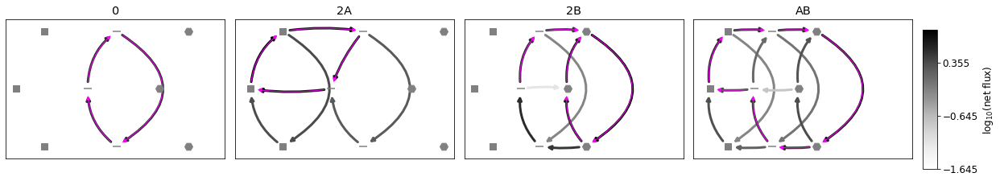

2571
[2.02614500e+00 2.10080373e+01 6.40310205e+01 2.68169710e+03]
[2.02614500e+00 2.10080373e+01 2.11966522e+00 2.68169710e+03]
[  77.20443442   21.0080373    64.03102051 2681.69709785]
2.0261450042580886,21.008037300488947,64.03102051294236,2681.6970978468303,2.0261450042580886,21.008037300488947,2.119665218446761,2681.6970978468303,77.2044344177188,21.008037300488947,64.03102051294236,2681.6970978468303,2939.6085072340475,4977.384776678039,2939.6085072340475,4977.384776678039,2939.6085072340475,4977.384776678039,2939.6085072340475,4977.384776678039,2939.6085072340475,4977.384776678039,2939.6085072340475,4977.384776678039
[2.5421109974442895, -0.3836251272448594, [1.807317237464476, 1.827742710797944, 13.888309734770246, 10.64551614931424]]
0 0 1.807317237464476
2 0 1.827742710797944
0 2 13.888309734770246
1 1 10.645516149314242


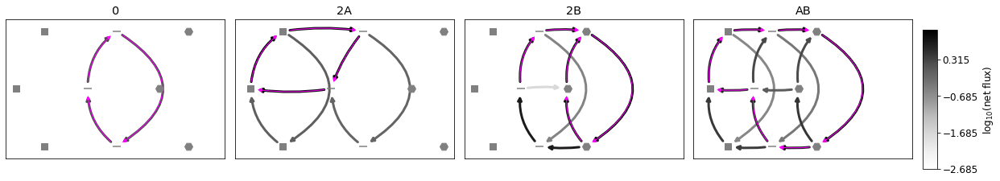

1414
[2.38581828e+00 5.49380714e+00 3.57375640e+03 4.29276021e+03]
[2.38581828e+00 5.49380714e+00 4.96100864e+02 4.29276021e+03]
[1680.42832049    5.49380714 3573.75639596 4292.76020772]
2.385818279777088,5.493807143665218,3573.756395960975,4292.760207718688,2.385818279777088,5.493807143665218,496.1008642451266,4292.760207718688,1680.428320492471,5.493807143665218,3573.756395960975,4292.760207718688,274.90958022276976,884.2836663766967,274.90958022276976,884.2836663766967,274.90958022276976,884.2836663766967,274.90958022276976,884.2836663766967,274.90958022276976,884.2836663766967,274.90958022276976,884.2836663766967
[2.067400342528945, -0.04476446694579308, [1.0522553697111776, 1.2412565564153855, 5.36644297639054, 5.202487814184494]]
0 0 1.0522553697111776
2 0 1.2412565564153852
0 2 5.366442976390541
1 1 5.202487814184493


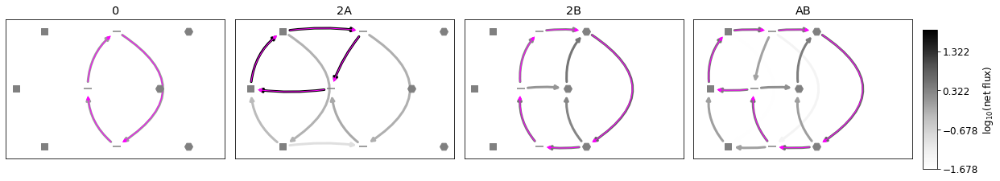

1998
[ 10.74423525  30.62680758 268.54494623   2.73003763]
[10.74423525 30.62680758  2.10877226  2.73003763]
[432.63467996  30.62680758 268.54494623   2.73003763]
10.744235246463427,30.62680758003393,268.5449462296398,2.730037632521213,10.744235246463427,30.62680758003393,2.1087722600650407,2.730037632521213,432.63467995683726,30.62680758003393,268.5449462296398,2.730037632521213,146.7680203156492,313.8084539389939,146.7680203156492,313.8084539389939,146.7680203156492,313.8084539389939,146.7680203156492,313.8084539389939,146.7680203156492,313.8084539389939,146.7680203156492,313.8084539389939
[1.7023985572689957, -0.49819709617111535, [0.10365567514647976, 0.2245541900078059, 1.0322061993659697, 0.7307926880845577]]
0 0 0.10365567514647976
2 0 0.22455419000780594
0 2 1.03220619936597
1 1 0.7307926880845577


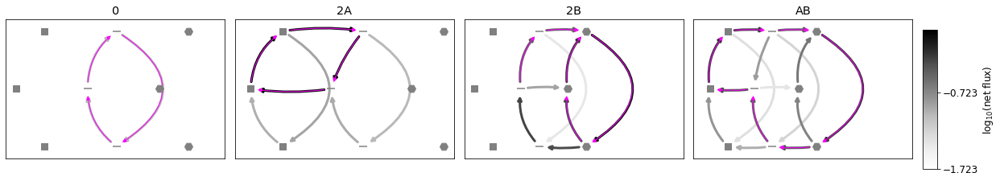

702
[  17.64883827   11.31520142 6989.22341411 5578.95599832]
[  17.64883827   11.31520142  250.6806145  5578.95599832]
[9432.06631784   11.31520142 6989.22341411 5578.95599832]
17.64883826986431,11.31520141815077,6989.223414106103,5578.955998317952,17.64883826986431,11.31520141815077,250.68061450223823,5578.955998317952,9432.066317843864,11.31520141815077,6989.223414106103,5578.955998317952,483.3196962543548,876.1600778801079,483.3196962543548,876.1600778801079,483.3196962543548,876.1600778801079,483.3196962543548,876.1600778801079,483.3196962543548,876.1600778801079,483.3196962543548,876.1600778801079
[0.8842493065546204, -0.04108716381208073, [4.625330103737096, 5.878776456241572, 11.164543749323757, 10.851068651204766]]
0 0 4.625330103737097
2 0 5.878776456241573
0 2 11.164543749323755
1 1 10.851068651204766


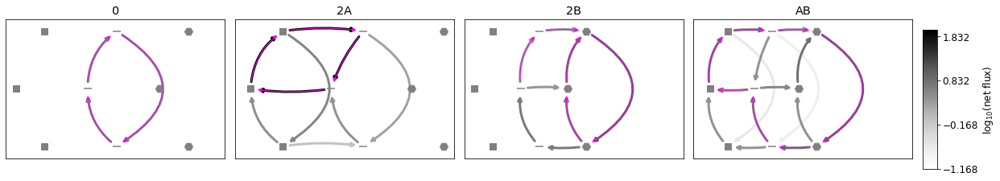

348
[   2.6867001     2.69297192  198.06972861 1360.46233665]
[   2.6867001     2.69297192   23.41218257 1360.46233665]
[  81.95427651    2.69297192  198.06972861 1360.46233665]
2.6867000976420736,2.6929719184329395,198.06972861314588,1360.4623366499864,2.6867000976420736,2.6929719184329395,23.412182568276435,1360.4623366499864,81.95427650965837,2.6929719184329395,198.06972861314588,1360.4623366499864,53.064864341392784,943.9279418032892,53.064864341392784,943.9279418032892,53.064864341392784,943.9279418032892,53.064864341392784,943.9279418032892,53.064864341392784,943.9279418032892,53.064864341392784,943.9279418032892
[0.5294188710375992, -0.18323495286432784, [1.2524031046183066, 1.260514411481912, 2.0657511007998415, 1.8193605596865992]]
0 0 1.2524031046183066
2 0 1.2605144114819122
0 2 2.0657511007998415
1 1 1.8193605596865992


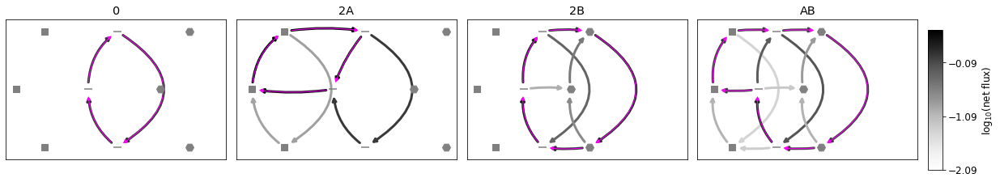

219
[   7.80424975   16.37608622  806.16635889 6403.52590773]
[   7.80424975   16.37608622  327.10183768 6403.52590773]
[ 236.19488875   16.37608622  806.16635889 6403.52590773]
7.804249752187903,16.376086221276115,806.1663588917461,6403.525907733367,7.804249752187903,16.376086221276115,327.1018376836648,6403.525907733367,236.19488875279052,16.376086221276115,806.1663588917461,6403.525907733367,2498.3337582488866,2990.662033852388,2498.3337582488866,2990.662033852388,2498.3337582488866,2990.662033852388,2498.3337582488866,2990.662033852388,2498.3337582488866,2990.662033852388,2498.3337582488866,2990.662033852388
[1.394399012884091, -0.1416676941691298, [4.866473333417231, 5.014561944353131, 14.542368810660065, 13.182231349323699]]
0 0 4.866473333417231
2 0 5.014561944353131
0 2 14.542368810660065
1 1 13.182231349323704


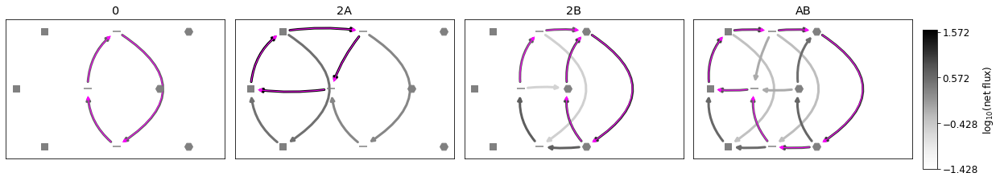

2626
[  22.62100998   34.82089204 7094.57092457 3478.67171728]
[  22.62100998   34.82089204   36.35209689 3478.67171728]
[7152.3961871    34.82089204 7094.57092457 3478.67171728]
22.62100998181344,34.820892037588955,7094.57092457468,3478.671717279361,22.62100998181344,34.820892037588955,36.35209689295128,3478.671717279361,7152.396187102656,34.820892037588955,7094.57092457468,3478.671717279361,133.528215847448,2266.389309341805,133.528215847448,2266.389309341805,133.528215847448,2266.389309341805,133.528215847448,2266.389309341805,133.528215847448,2266.389309341805,133.528215847448,2266.389309341805
[1.6924641853653024, -0.274444121559109, [6.121082099375784, 6.88733766131253, 26.924631896787133, 22.260446019031466]]
0 0 6.121082099375784
2 0 6.88733766131253
0 2 26.924631896787133
1 1 22.260446019031455


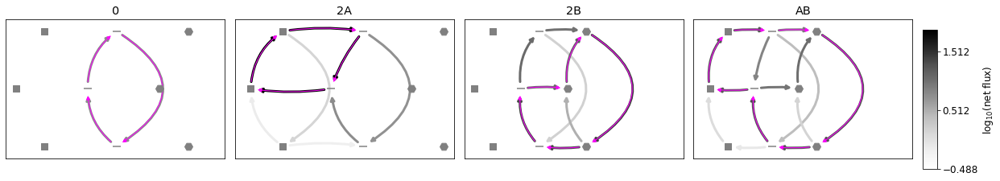

2883
[  1.45711242   1.80735117 217.82876721 154.44048681]
[  1.45711242   1.80735117   7.12468432 154.44048681]
[845.49824076   1.80735117 217.82876721 154.44048681]
1.4571124204182773,1.8073511738903616,217.828767206656,154.44048681398317,1.4571124204182773,1.8073511738903616,7.124684320647736,154.44048681398317,845.4982407630172,1.8073511738903616,217.828767206656,154.44048681398317,10.717732516976556,211.03456915970355,10.717732516976556,211.03456915970355,10.717732516976556,211.03456915970355,10.717732516976556,211.03456915970355,10.717732516976556,211.03456915970355,10.717732516976556,211.03456915970355
[1.497772357112559, -0.18505664900576213, [0.4516655203321069, 0.478930529142829, 1.5376395114879324, 1.352530065760532]]
0 0 0.45166552033210683
2 0 0.47893052914282896
0 2 1.5376395114879327
1 1 1.352530065760532


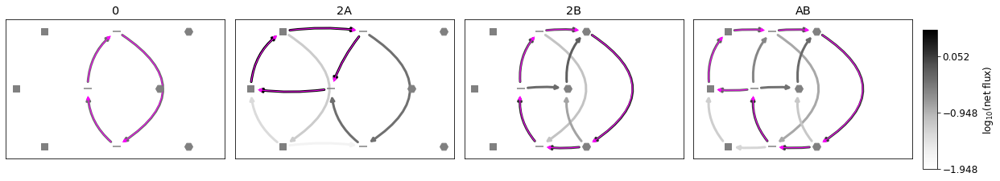

805
[ 321.33318173   25.97305567 5669.6867239    95.69661904]
[321.33318173  25.97305567  12.05910725  95.69661904]
[9787.18723636   25.97305567 5669.6867239    95.69661904]
321.33318172566794,25.973055673846705,5669.686723902594,95.69661904330174,321.33318172566794,25.973055673846705,12.059107251510806,95.69661904330174,9787.187236361133,25.973055673846705,5669.686723902594,95.69661904330174,895.9240907740108,3953.8175727403154,895.9240907740108,3953.8175727403154,895.9240907740108,3953.8175727403154,895.9240907740108,3953.8175727403154,895.9240907740108,3953.8175727403154,895.9240907740108,3953.8175727403154
[0.7056507650489374, -0.28130308892088607, [4.229398756652698, 6.624961328477988, 13.130645060597894, 10.804517923412227]]
0 0 4.229398756652698
2 0 6.624961328477987
0 2 13.130645060597894
1 1 10.804517923412227


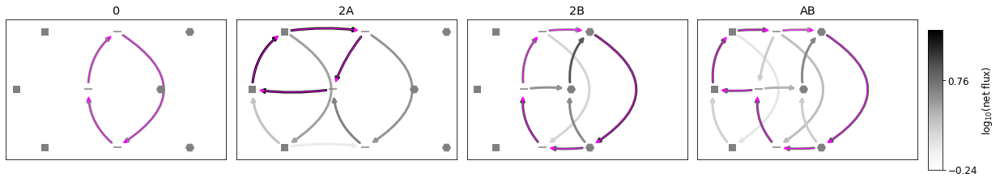

2856
[5.79599090e+00 1.59847151e+01 7.29929305e+03 4.26251786e+03]
[   5.7959909    15.98471514  233.65832757 4262.51785564]
[4632.66861949   15.98471514 7299.29304963 4262.51785564]
5.795990897377575,15.984715135199746,7299.293049634516,4262.517855636035,5.795990897377575,15.984715135199746,233.65832756835172,4262.517855636035,4632.668619485846,15.984715135199746,7299.293049634516,4262.517855636035,55.930054721673216,1935.5989988593824,55.930054721673216,1935.5989988593824,55.930054721673216,1935.5989988593824,55.930054721673216,1935.5989988593824,55.930054721673216,1935.5989988593824,55.930054721673216,1935.5989988593824
[2.284964524677153, -0.30342509665085143, [1.884021904378822, 1.9994725241582427, 12.025367490534078, 9.744471765679833]]
0 0 1.884021904378822
2 0 1.9994725241582427
0 2 12.025367490534078
1 1 9.744471765679833


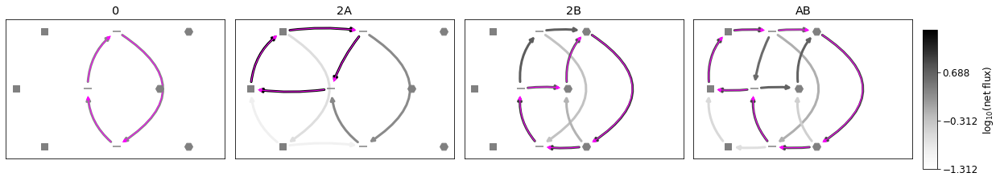

1100
[  2.03665276 296.2487345  149.29526118  60.07440494]
[  2.03665276 296.2487345    7.57387454  60.07440494]
[ 98.48397878 296.2487345  149.29526118  60.07440494]
2.036652761785323,296.248734502506,149.29526118322127,60.074404941481845,2.036652761785323,296.248734502506,7.573874536248993,60.074404941481845,98.48397877557882,296.248734502506,149.29526118322127,60.074404941481845,63.7284280387183,1014.5328993363896,63.7284280387183,1014.5328993363896,63.7284280387183,1014.5328993363896,63.7284280387183,1014.5328993363896,63.7284280387183,1014.5328993363896,63.7284280387183,1014.5328993363896
[1.6740782823090312, -0.6964351260412454, [0.5776182428866874, 0.6294421348829984, 3.2550034429710593, 2.008646855907672]]
0 0 0.5776182428866874
2 0 0.6294421348829982
0 2 3.2550034429710593
1 1 2.0086468559076716


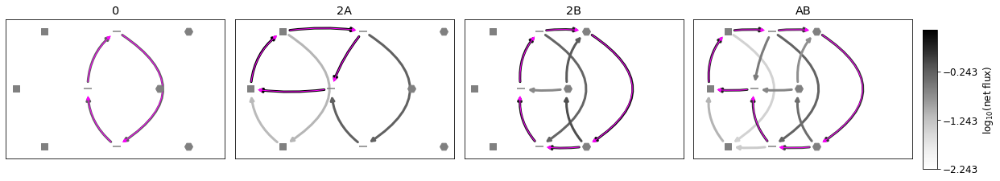

3583
[  97.87324653  113.31598072 2253.14587846    2.46759162]
[ 97.87324653 113.31598072   6.63995246   2.46759162]
[2.60678390e+03 1.13315981e+02 2.25314588e+03 2.46759162e+00]
97.87324652749535,113.31598072367824,2253.1458784584006,2.4675916189299945,97.87324652749535,113.31598072367824,6.639952461817452,2.4675916189299945,2606.7838958556254,113.31598072367824,2253.1458784584006,2.4675916189299945,4883.0102818424375,7463.882634089355,4883.0102818424375,7463.882634089355,4883.0102818424375,7463.882634089355,4883.0102818424375,7463.882634089355,4883.0102818424375,7463.882634089355,4883.0102818424375,7463.882634089355
[1.6588196766016727, -0.3477785814941402, [0.10252562188538321, 0.23777846892359145, 0.9554738185108971, 0.7508047409752875]]
0 0 0.10252562188538321
2 0 0.23777846892359147
0 2 0.9554738185108972
1 1 0.7508047409752875


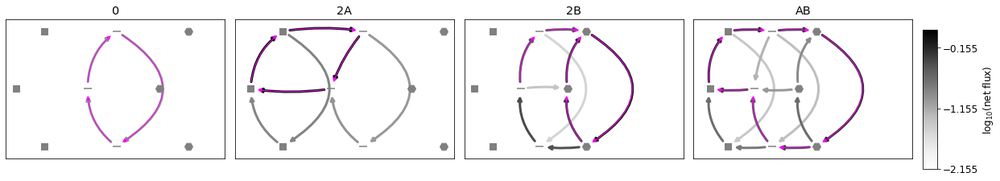

890
[2.49338660e+00 5.66025727e+01 2.44490806e+02 7.97231674e+03]
[2.49338660e+00 5.66025727e+01 1.30348481e+01 7.97231674e+03]
[  41.52176998   56.60257273  244.49080562 7972.3167379 ]
2.493386599128838,56.60257273499477,244.49080561994924,7972.316737902199,2.493386599128838,56.60257273499477,13.03484807295756,7972.316737902199,41.52176997856724,56.60257273499477,244.49080561994924,7972.316737902199,1758.3491535937906,1735.4519108042273,1758.3491535937906,1735.4519108042273,1758.3491535937906,1735.4519108042273,1758.3491535937906,1735.4519108042273,1758.3491535937906,1735.4519108042273,1758.3491535937906,1735.4519108042273
[2.3238771831876854, -0.6501279046157385, [2.3193625263345514, 2.36232329324092, 18.561115402290373, 11.827584804041395]]
0 0 2.3193625263345514
2 0 2.3623232932409195
0 2 18.56111540229037
1 1 11.827584804041393


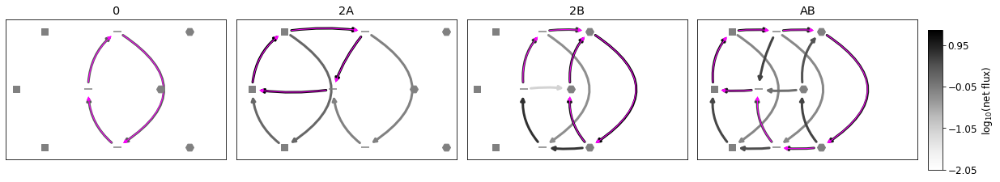

1703
[  1.86412295   3.73770697  73.95321954 302.00079629]
[  1.86412295   3.73770697  31.47302425 302.00079629]
[ 19.13098824   3.73770697  73.95321954 302.00079629]
1.864122952751744,3.737706970094544,73.95321954098524,302.00079629101185,1.864122952751744,3.737706970094544,31.473024247838097,302.00079629101185,19.130988243710185,3.737706970094544,73.95321954098524,302.00079629101185,45.79737521085219,48.64864541973122,45.79737521085219,48.64864541973122,45.79737521085219,48.64864541973122,45.79737521085219,48.64864541973122,45.79737521085219,48.64864541973122,45.79737521085219,48.64864541973122
[0.9731345728980629, -0.2958356896989737, [1.0653442951495882, 1.1261901128865643, 2.7139998722788894, 2.2108252013883374]]
0 0 1.0653442951495882
2 0 1.1261901128865643
0 2 2.7139998722788894
1 1 2.2108252013883374


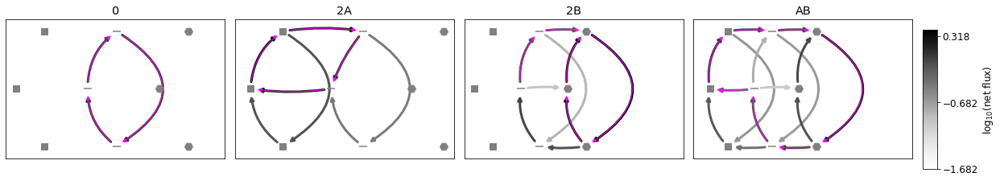

2020
[1.18299747e+00 3.46807120e+00 6.42224368e+02 2.17730496e+03]
[1.18299747e+00 3.46807120e+00 2.39770820e+01 2.17730496e+03]
[ 290.75305053    3.4680712   642.22436767 2177.30495848]
1.18299746735432,3.4680712038636443,642.2243676745376,2177.30495847734,1.18299746735432,3.4680712038636443,23.977082008984038,2177.30495847734,290.7530505339446,3.4680712038636443,642.2243676745376,2177.30495847734,92.27997700896856,1233.8618918620157,92.27997700896856,1233.8618918620157,92.27997700896856,1233.8618918620157,92.27997700896856,1233.8618918620157,92.27997700896856,1233.8618918620157,92.27997700896856,1233.8618918620157
[1.889538529604994, -0.15374528464800313, [0.7228308098069353, 0.7420145174011592, 3.0584551763510275, 2.749287627512136]]
0 0 0.7228308098069353
2 0 0.7420145174011591
0 2 3.0584551763510275
1 1 2.7492876275121363


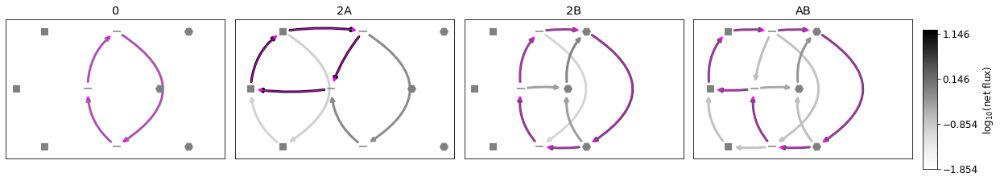

2459
[1.04963110e+00 2.42518002e+00 8.57195214e+02 1.49219486e+03]
[1.04963110e+00 2.42518002e+00 7.87124447e+00 1.49219486e+03]
[ 408.22641251    2.42518002  857.19521353 1492.19486332]
1.0496311003309984,2.425180021276212,857.1952135327188,1492.194863320459,1.0496311003309984,2.425180021276212,7.871244467526345,1492.194863320459,408.2264125084435,2.425180021276212,857.1952135327188,1492.194863320459,1561.5779451087833,1938.9180263609203,1561.5779451087833,1938.9180263609203,1561.5779451087833,1938.9180263609203,1561.5779451087833,1938.9180263609203,1561.5779451087833,1938.9180263609203,1561.5779451087833,1938.9180263609203
[1.8754581491424995, -0.02247865804923853, [0.5227346875991981, 0.6397550545747329, 2.384238160308482, 2.347377212814899]]
0 0 0.5227346875991981
2 0 0.639755054574733
0 2 2.384238160308482
1 1 2.347377212814899


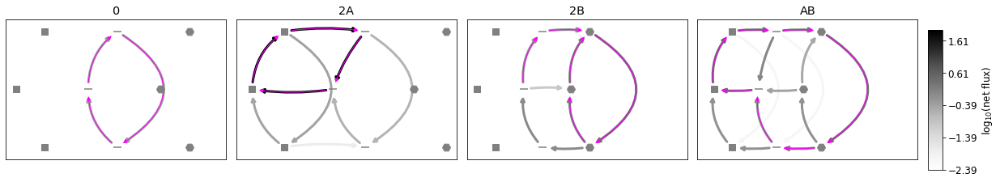

1665
[3.30805358e+01 3.30890946e+00 3.63100769e+03 8.60350711e+01]
[ 33.08053575   3.30890946 578.51778966  86.03507109]
[8.88435467e+03 3.30890946e+00 3.63100769e+03 8.60350711e+01]
33.080535750515246,3.308909464097961,3631.007689123398,86.03507109460864,33.080535750515246,3.308909464097961,578.5177896585408,86.03507109460864,8884.354672829017,3.308909464097961,3631.007689123398,86.03507109460864,3192.5441344123883,4785.003478100621,3192.5441344123883,4785.003478100621,3192.5441344123883,4785.003478100621,3192.5441344123883,4785.003478100621,3192.5441344123883,4785.003478100621,3192.5441344123883,4785.003478100621
[1.4959987157722743, -0.05060526371018506, [0.617338612779628, 1.0549781037911126, 3.081893558605046, 2.975664287449578]]
0 0 0.617338612779628
2 0 1.0549781037911128
0 2 3.0818935586050467
1 1 2.975664287449577


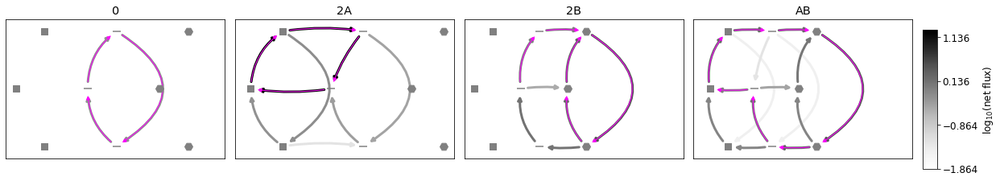

2962
[  17.60328683  106.13665415 1652.04712444 4435.81075809]
[  17.60328683  106.13665415  220.83880487 4435.81075809]
[ 357.31329395  106.13665415 1652.04712444 4435.81075809]
17.60328682767143,106.13665414637528,1652.0471244374469,4435.8107580870965,17.60328682767143,106.13665414637528,220.83880487291097,4435.8107580870965,357.3132939528033,106.13665414637528,1652.0471244374469,4435.8107580870965,189.6444877644127,331.5552387063337,189.6444877644127,331.5552387063337,189.6444877644127,331.5552387063337,189.6444877644127,331.5552387063337,189.6444877644127,331.5552387063337,189.6444877644127,331.5552387063337
[1.5862588825197255, -0.550224207722653, [11.413974183967909, 13.0231148046274, 57.261189366724906, 39.10446725581413]]
0 0 11.41397418396791
2 0 13.0231148046274
0 2 57.26118936672492
1 1 39.10446725581413


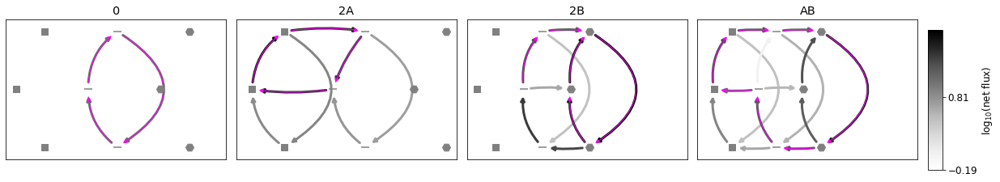

2844
[  5.67363682  14.13776201 478.97972763 911.2152507 ]
[  5.67363682  14.13776201   2.55155422 911.2152507 ]
[3112.54322942   14.13776201  478.97972763  911.2152507 ]
5.673636820570352,14.1377620090678,478.9797276293921,911.215250702395,5.673636820570352,14.1377620090678,2.551554218555099,911.215250702395,3112.5432294182983,14.1377620090678,478.9797276293921,911.215250702395,107.26682432717486,174.6149538889935,107.26682432717486,174.6149538889935,107.26682432717486,174.6149538889935,107.26682432717486,174.6149538889935,107.26682432717486,174.6149538889935,107.26682432717486,174.6149538889935
[1.7360294286923814, -0.18141111744300484, [2.9348624151059117, 3.5326754457225062, 13.344762809349465, 11.767946115331455]]
0 0 2.9348624151059117
2 0 3.5326754457225062
0 2 13.344762809349465
1 1 11.767946115331455


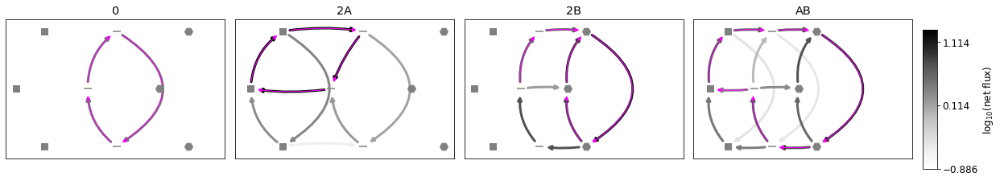

308
[   7.73334485 1899.54375893 2522.883831      9.67539789]
[   7.73334485 1899.54375893  237.08199418    9.67539789]
[2014.71179736 1899.54375893 2522.883831      9.67539789]
7.733344846385858,1899.5437589313583,2522.8838309961748,9.675397893761977,7.733344846385858,1899.5437589313583,237.08199417793836,9.675397893761977,2014.7117973631407,1899.5437589313583,2522.8838309961748,9.675397893761977,60.96900627515169,3430.5163993127653,60.96900627515169,3430.5163993127653,60.96900627515169,3430.5163993127653,60.96900627515169,3430.5163993127653,60.96900627515169,3430.5163993127653,60.96900627515169,3430.5163993127653
[2.0538649546601175, -0.800202708191487, [0.029454098717842103, 0.03095323460833955, 0.22380305762014407, 0.1285230424598822]]
0 0 0.029454098717842107
2 0 0.03095323460833955
0 2 0.22380305762014405
1 1 0.12852304245988216


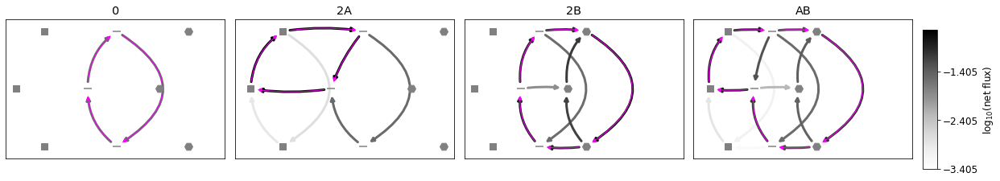

3571
[1.04056306e+00 5.54115516e+00 5.80217545e+02 1.11180279e+03]
[1.04056306e+00 5.54115516e+00 8.75229819e+00 1.11180279e+03]
[ 688.47655257    5.54115516  580.21754465 1111.80279371]
1.0405630557369558,5.541155162041511,580.2175446535597,1111.802793714038,1.0405630557369558,5.541155162041511,8.752298185576832,1111.802793714038,688.476552571433,5.541155162041511,580.2175446535597,1111.802793714038,63.81193071075618,5579.502474498871,63.81193071075618,5579.502474498871,63.81193071075618,5579.502474498871,63.81193071075618,5579.502474498871,63.81193071075618,5579.502474498871,63.81193071075618,5579.502474498871
[2.132988977779709, -0.39246882169785025, [0.608304762234993, 0.6127583378493612, 3.527993528882204, 2.687713001561811]]
0 0 0.608304762234993
2 0 0.6127583378493611
0 2 3.5279935288822037
1 1 2.687713001561811


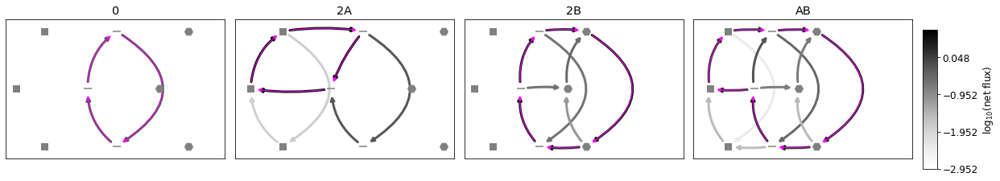

1851
[  1.53213245   1.93862281 184.57058985 700.50709455]
[  1.53213245   1.93862281   5.51667262 700.50709455]
[121.6517808    1.93862281 184.57058985 700.50709455]
1.5321324461525758,1.9386228104413548,184.5705898500782,700.5070945467786,1.5321324461525758,1.9386228104413548,5.516672621253152,700.5070945467786,121.65178080345338,1.9386228104413548,184.5705898500782,700.5070945467786,218.1385968415241,961.7903424420668,218.1385968415241,961.7903424420668,218.1385968415241,961.7903424420668,218.1385968415241,961.7903424420668,218.1385968415241,961.7903424420668,218.1385968415241,961.7903424420668
[1.1412329400152175, -0.08167664022843343, [0.7452047343180914, 0.7770691718088898, 1.81381147635603, 1.713977145999032]]
0 0 0.7452047343180914
2 0 0.7770691718088898
0 2 1.81381147635603
1 1 1.7139771459990323


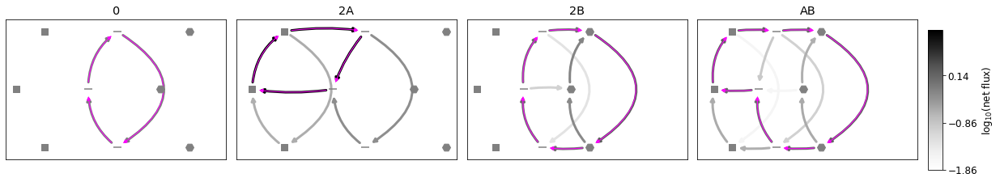

4284
[1.54995715e+00 2.35825193e+01 5.25867881e+01 3.24734384e+03]
[1.54995715e+00 2.35825193e+01 5.63210812e+00 3.24734384e+03]
[  67.13426002   23.58251933   52.58678809 3247.34383925]
1.5499571520514888,23.58251933133924,52.58678809178961,3247.343839251685,1.5499571520514888,23.58251933133924,5.63210811528261,3247.343839251685,67.13426002077573,23.58251933133924,52.58678809178961,3247.343839251685,3896.68988285606,6941.850083753609,3896.68988285606,6941.850083753609,3896.68988285606,6941.850083753609,3896.68988285606,6941.850083753609,3896.68988285606,6941.850083753609,3896.68988285606,6941.850083753609
[2.84270236922931, -0.4489338584180689, [1.431968770207583, 1.442170715872659, 14.122055438070696, 10.345592178419217]]
0 0 1.4319687702075827
2 0 1.4421707158726593
0 2 14.122055438070696
1 1 10.345592178419219


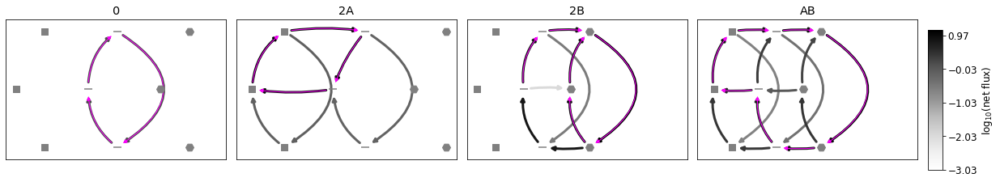

2770
[  4.97425782   2.33730857 279.33314229   5.73900024]
[ 4.97425782  2.33730857 11.4635818   5.73900024]
[215.84189897   2.33730857 279.33314229   5.73900024]
4.97425781576714,2.3373085701836525,279.3331422867592,5.739000240184222,4.97425781576714,2.3373085701836525,11.463581795279527,5.739000240184222,215.84189897178533,2.3373085701836525,279.3331422867592,5.739000240184222,229.798900553376,498.2650117644377,229.798900553376,498.2650117644377,229.798900553376,498.2650117644377,229.798900553376,498.2650117644377,229.798900553376,498.2650117644377,229.798900553376,498.2650117644377
[1.9434091890793619, -0.37156949902342823, [0.09444602013077512, 0.18116374389506176, 0.9014659174359231, 0.6967801130929818]]
0 0 0.09444602013077512
2 0 0.1811637438950618
0 2 0.9014659174359232
1 1 0.6967801130929819


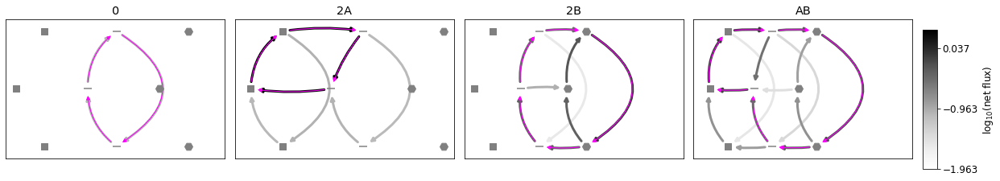

2837
[  6.06390818   9.17446678 330.47661575 130.7727379 ]
[  6.06390818   9.17446678   6.86637609 130.7727379 ]
[539.43916006   9.17446678 330.47661575 130.7727379 ]
6.06390818236324,9.174466777652158,330.47661575389634,130.7727378970119,6.06390818236324,9.174466777652158,6.866376086135446,130.7727378970119,539.4391600580057,9.174466777652158,330.47661575389634,130.7727378970119,37.03074785101446,103.98552578911722,37.03074785101446,103.98552578911722,37.03074785101446,103.98552578911722,37.03074785101446,103.98552578911722,37.03074785101446,103.98552578911722,37.03074785101446,103.98552578911722
[1.3568364494845901, -0.3139795415112222, [1.4320479379769204, 2.1791436821019095, 6.938276402262542, 5.581286764125329]]
0 0 1.4320479379769204
2 0 2.179143682101909
0 2 6.938276402262542
1 1 5.581286764125329


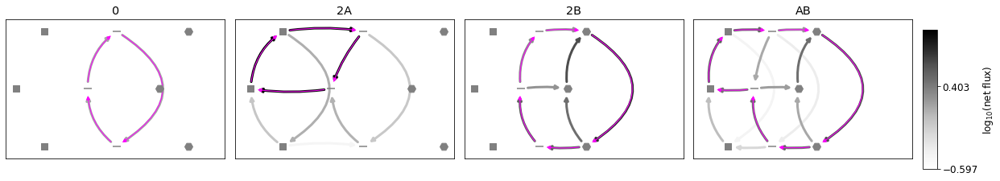

1435
[ 1.33707195 26.92843757 66.53787517 38.4169473 ]
[ 1.33707195 26.92843757 32.43679609 38.4169473 ]
[18.58334383 26.92843757 66.53787517 38.4169473 ]
1.3370719502106472,26.928437571970814,66.53787516923325,38.41694729957261,1.3370719502106472,26.928437571970814,32.43679609126699,38.41694729957261,18.583343827278668,26.928437571970814,66.53787516923325,38.41694729957261,609.8243021058765,2620.3969603660826,609.8243021058765,2620.3969603660826,609.8243021058765,2620.3969603660826,609.8243021058765,2620.3969603660826,609.8243021058765,2620.3969603660826,609.8243021058765,2620.3969603660826
[1.4322987487769974, -0.5939821768471725, [0.47473665544647853, 0.5278931154530974, 2.150390518154541, 1.4246588631950652]]
0 0 0.47473665544647853
2 0 0.5278931154530974
0 2 2.150390518154541
1 1 1.4246588631950654


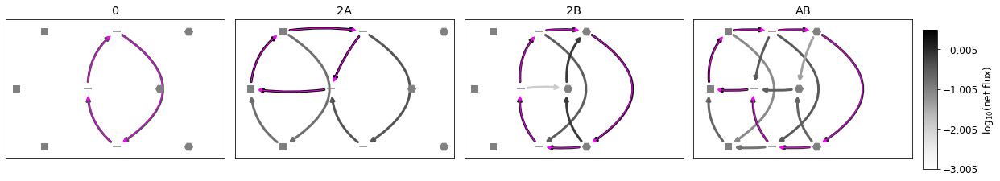

3290
[  2.08033955   4.13994592 267.24081183  49.96432084]
[ 2.08033955  4.13994592 87.00484372 49.96432084]
[246.19424984   4.13994592 267.24081183  49.96432084]
2.080339547476843,4.139945919987401,267.24081183379786,49.96432083620746,2.080339547476843,4.139945919987401,87.00484371783836,49.96432083620746,246.19424983844567,4.139945919987401,267.24081183379786,49.96432083620746,1030.2656365376088,4023.9301385827935,1030.2656365376088,4023.9301385827935,1030.2656365376088,4023.9301385827935,1030.2656365376088,4023.9301385827935,1030.2656365376088,4023.9301385827935,1030.2656365376088,4023.9301385827935
[2.7636107433500525, -0.2408055204773486, [0.301814582417002, 0.36833361710193885, 2.955702866369915, 2.5013305533436636]]
0 0 0.30181458241700204
2 0 0.36833361710193885
0 2 2.955702866369914
1 1 2.5013305533436636


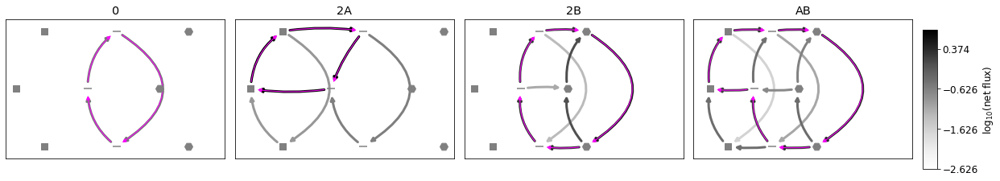

2305
[  4.87599878 100.3826526  606.22705546 856.11977348]
[  4.87599878 100.3826526   37.35376622 856.11977348]
[652.31549305 100.3826526  606.22705546 856.11977348]
4.875998778967813,100.38265259608607,606.2270554620089,856.1197734824481,4.875998778967813,100.38265259608607,37.353766217610726,856.1197734824481,652.3154930518384,100.38265259608607,606.2270554620089,856.1197734824481,184.62025701666656,3123.112072747153,184.62025701666656,3123.112072747153,184.62025701666656,3123.112072747153,184.62025701666656,3123.112072747153,184.62025701666656,3123.112072747153,184.62025701666656,3123.112072747153
[2.5201346940943212, -0.681700568231102, [2.7667130080245093, 2.895318415702307, 26.64064821651087, 16.608578699047843]]
0 0 2.7667130080245097
2 0 2.8953184157023064
0 2 26.64064821651087
1 1 16.60857869904785


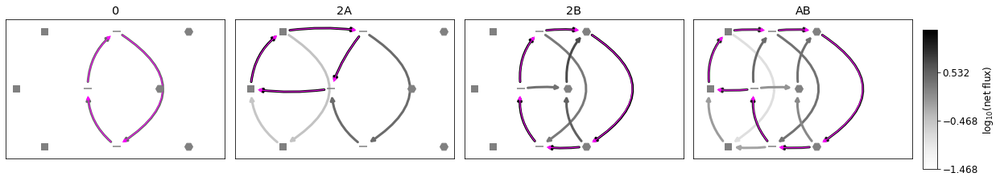

309
[  6.31507484   1.47250277 447.2860066   70.34980598]
[ 6.31507484  1.47250277  2.76604863 70.34980598]
[2.88719673e+03 1.47250277e+00 4.47286007e+02 7.03498060e+01]
6.315074836036307,1.4725027653179228,447.28600660497386,70.34980597527367,6.315074836036307,1.4725027653179228,2.7660486307603254,70.34980597527367,2887.1967298809504,1.4725027653179228,447.28600660497386,70.34980597527367,77.62997575246187,198.07672946902363,77.62997575246187,198.07672946902363,77.62997575246187,198.07672946902363,77.62997575246187,198.07672946902363,77.62997575246187,198.07672946902363,77.62997575246187,198.07672946902363
[0.7484337831051366, -0.05815443854574937, [0.5380731336998086, 0.8033853910078429, 1.405177473587953, 1.3496617768771444]]
0 0 0.5380731336998086
2 0 0.8033853910078429
0 2 1.405177473587953
1 1 1.3496617768771446


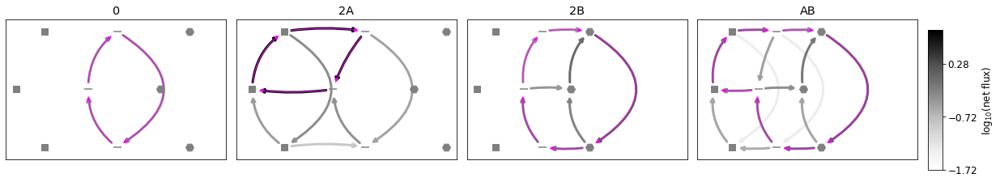

3446
[1.04115460e+00 5.98665671e+00 6.10428012e+02 1.26190613e+03]
[1.04115460e+00 5.98665671e+00 2.00109913e+00 1.26190613e+03]
[ 753.64856755    5.98665671  610.428012   1261.90612855]
1.0411546046295117,5.986656706265968,610.4280120024616,1261.9061285517846,1.0411546046295117,5.986656706265968,2.0010991347877107,1261.9061285517846,753.6485675535687,5.986656706265968,610.4280120024616,1261.9061285517846,6.876976619598,38.76340479677335,6.876976619598,38.76340479677335,6.876976619598,38.76340479677335,6.876976619598,38.76340479677335,6.876976619598,38.76340479677335,6.876976619598,38.76340479677335
[2.2522777620385273, -0.44250882825248994, [0.6277792487575564, 0.6967144140808048, 4.5109331509165935, 3.319387548318422]]
0 0 0.6277792487575564
2 0 0.6967144140808048
0 2 4.510933150916593
1 1 3.319387548318422


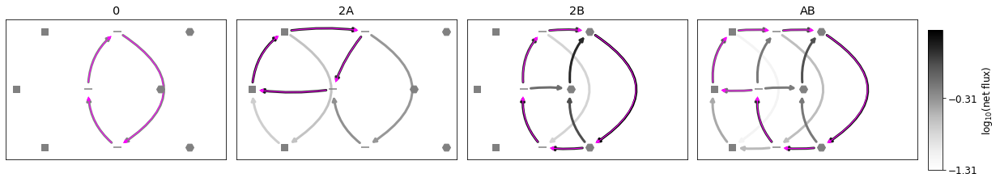

In [22]:
matd=np.asarray(allmatd[0],dtype=int)
subset=allsubsets[0]
netJ=True
columns_print=["p%d"%i for i in range(1,13)]

path1=list(map(int,list(map(float,list("0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 1. 1. 0. 0. 0. 1. 0. 0. 1.".split(" "))))))
path2=list(map(int,list(map(float,list("1. 0. 0. 0. 0. 1. 0. 0. 1. 1. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 1.".split(" "))))))
for path in [path1,path2]:
    print("#path")
    print(path)
    print(np.array(labls_)[np.asarray(path,dtype=bool)])

    idxs=np.where(np.all(matd==np.array(path),axis=1))[0]

    #choose 100
    np.random.seed(1)
    choice=np.random.choice(idxs,size=100,replace=False)
    for idx in choice:
        print(idx)
        print(subset.iloc[idx][columns_print[0:4]].values)
        print(subset.iloc[idx][columns_print[4:8]].values)
        print(subset.iloc[idx][columns_print[8:12]].values)
        
        parset=subset.iloc[idx].values[0:24].copy()
        print(",".join(map(str,parset)))
        out=basic.compute_synergy(parset,PolAB_A_allpars.interface_GRF_PolAB_A_A,fcind=10,fcpair=10,returnm=True,anystronger=True)
        if (out[0]<0):
            print("*****negative SAB")
        print(out)
        allGslist=[]
        allG2slist=[]
        allcolorslist=[]
        fig,axes=plt.subplots(1,4,figsize=(16,3))
        titles=["0","2A","2B","AB"]
        for i in range(4):
            if i==0:
                A=0
                B=0
            elif i==1:
                A=2
                B=0
            elif i==2:
                A=0
                B=2
            else:
                A=1
                B=1
            rhos=PolAB_A_allpars.interface_rhos_GRF_PolAB_A_A(parset,np.array([B]),A)
            P=rhos/np.sum(rhos)
            m=P[0]*parset[1]+P[3]*parset[5]+P[6]*parset[9]
            print(A,B,m)
            J=fluxes.get_fluxes(edges_,A,B,parset,P,netJ=netJ)
            Js_ar=J.flatten()
            #print(Js_ar)
            #keep only those columns with nonzero fluxes
            mask=[]
            for col in range(nnodes*nnodes):
                if np.any(Js_ar[col]>1e-15):
                    mask.append(col)
            #mat=np.log10(all_Js)[:,mask]
            Js_ar=Js_ar[mask]
            names_ar=all_fnames[mask]
            G=fluxes.get_graph_fromJarray(np.log10(Js_ar),names_ar,min_=-15)
            Gs=[G]
            G2=fluxes.get_dominant_path_G(G,node0)
            all_G2s=[G2]
            allGslist.append(Gs)
            allG2slist.append(all_G2s)
            colors_=[[G[e[0]][e[1]]["weight"] for e in G.edges()] for G in Gs]
            allcolorslist.append(colors_)

        vmin_nflog=min([min([min(x) for x in colors_]) for colors_ in allcolorslist])
        vmax_nflog=max([max([max(x) for x in colors_]) for colors_ in allcolorslist])

        color_args={"edge_cmap":cmap,"edge_vmin":vmin_nflog,"edge_vmax":vmax_nflog,"width":3}


        for i in range(4):
            axes[i].set_title(titles[i])
            #axes[i].set_frame_on(False)
            Gs=allGslist[i]
            all_G2s=allG2slist[i]
            colors_=allcolorslist[i]
            fluxes.plot_graphs(Gs,[axes[i]],coords=coords,dominant=all_G2s,color_lists=colors_,color_args=color_args,colord="magenta")

        cbax=fig.add_axes([1,0,0.015,0.8])
        norm=mpl.colors.Normalize(vmin=vmin_nflog,vmax=vmax_nflog)
        mpl.colorbar.ColorbarBase(cbax,cmap=cmap,norm=norm,ticks=np.arange(vmin_nflog,vmax_nflog,1),label="log$_{10}$(net flux)")
        plt.tight_layout()
        plt.show()
       
